<div class="alert alert-block alert-info"> <br>

#  <center> <b> Data Mining Project- ABCDEats Inc. </center> <br>
## <center> Fall Semester 2024-2025 <center>

  <div>

### Group Members
| Name              | Email                        | Student ID |
|-------------------|------------------------------|------------|
| Inês Araújo       | 20240532@novaims.unl.pt      | 20240532   |
| Leonor Mira       | 20240658@novaims.unl.pt      | 20240658   |
| Rafael Silva      | 20240511@novaims.unl.pt      | 20240511   |
| Rita Serra        | 20240515@novaims.unl.pt      | 20240515   |

<a id = "toc"></a>

## **Table of Contents** <br>
+ [1.Import Libraries](#importlibraries) <br>
+ [2. Import Dataset](#importdataset) <br>
+ [3. Metadata](#metadata) <br>
+ [4. Data Exploration](#section_4) <br>
  + [4.1 Initial Data Preview](#section_4_1) <br>
    + [4.3.1 First Analysis](#section_4_3_1) <br>
    + [4.3.2 Analysis for `is_chain` Variable](#section_4_3_2) <br>
    + [4.3.3 Processing decisions for `is_chain` Variable (first part)](#section_4_3_3) <br>

  + [4.4 Duplicates](#section_4_4) <br>
    + [4.4.1 First Analysis](#section_4_4_1) <br>
    + [4.4.2 Dealing with Duplicates](#section_4_4_2) <br>

  + [4.5 Missing Values](#section_4_5) <br>
  + [4.6 Descriptive Statistics](#section_4_6) <br>
  + [4.7 Variables Analysis](#section_4_7) <br>
    + [4.7.1 Analysis of Categorical variables and Unique values](#section_4_7_1) <br>
    + [4.7.2 Analysis of Numeric variables and Unique values](#section_4_7_2) <br>

  + [4.8 Creating New Features](#section_4_8) <br>

  + [4.9 Analysis with New Features](#section_4_9) <br>
    + [4.9.1 Discrepancies Between Product Count and Daily/Weekly Totals: Analysis and Possible Causes](#section_4_9_1) <br>
    + [4.9.2 Heat Maps of Correlation Among Days of the Week, Cuisine Types, and Hours of the Day](#section_4_9_2) <br>
      + [4.9.2.1 Heat Maps between Individual Cuisine Types and between Grouped Cuisine Types](#section_4_9_2_1) <br>
      + [4.9.2.2 Heat Maps between Days of the Week and between Work and Leisure Days](#section_4_9_2_2) <br>
      + [4.9.2.3 Heat Maps between Individual Hours and between Grouped Time Periods](#section_4_9_2_3) <br>
    + [4.9.3 Analysis of Demand Patterns Across Cuisine Groups, Day Types, and Time Periods](#section_4_9_3) <br>
      + [4.9.3.1 Analysis of Bar Plots: Cuisine Group Popularity by Time of Day](#section_4_9_3_1) <br>
      + [4.9.3.2 Analysis of Bar Plots: Popularity of Work and Leisure Days by Cuisine Groups](#section_4_9_3_2) <br>
      + [4.9.3.3 Analysis of Time Period Demand on Work and Leisure Days](#section_4_9_3_3) <br>

+ [5. Visual Exploration](#section_5) <br>
  + [5.1 Numeric Variables - Univariate Analysis](#section_5_1) <br>
     + [5.1.1 Histograms](#section_5_1_1) <br>
     + [5.1.2 Boxplots](#section_5_1_2) <br>
     + [5.1.3 Bar plots](#section_5_1_3) <br>
  + [5.2 Numeric Variables - Bivariate Analysis](#section_5_2) <br>
     + [5.2.1 Scatter Plots](#section_5_2_1) <br>
     + [5.2.1 Heatmaps](#section_5_2_2) <br>
  + [5.3 Categorical Variables - Univariate Analysis](#section_5_3) <br>
  + [5.4 Categorical Variables - Bivariate Analysis](#section_5_4) <br>
    + [5.4.1 Customer Region vs Payment Method](#section_5_4_1) <br>
    + [5.4.2 Customer Region vs Last Promo](#section_5_4_2) <br>

+ [6.1 Measures of central tendency](#section_6_2) <br>
  + [6.1.1 Metric Features](#section_6_2_1) <br>
  + [6.1.2 Non-metric Features](#section_6_2_2) <br>


<div class="alert alert-block alert-success">
<a class="anchor" id="importlibraries">

# 1. Import Libraries
    
</a>
<div>


[Back to ToC](#toc)<br>

In this section we will imported the needed libraries for this notebook.

In [18]:
from functions import *

<div class="alert alert-block alert-success">

## 2. Import dataset
<a id="importdataset"></a>

[Back to ToC](#toc)

Importing the datasets for further processing.
</div>


In [19]:
# Load a CSV d named 'DM2425_ABCDEats_DATASET.csv' into a pandas DataFrame.
# The 'sep' parameter specifies that the values are separated by commas.

df = pd.read_csv('DM2425_ABCDEats_DATASET.csv', sep = ',', index_col= 'customer_id')

To check that the imports really worked, we will use `.head()`.

In [20]:
df.head(2)

,customer_region,customer_age,vendor_count,product_count,is_chain,first_order,last_order,last_promo,payment_method,CUI_American,...,HR_14,HR_15,HR_16,HR_17,HR_18,HR_19,HR_20,HR_21,HR_22,HR_23
customer_id,,,,,,,,,,,,,,,,,,,,,
1b8f824d5e,2360,18.0,2,5,1,0.0,1,DELIVERY,DIGI,0.00,...,0,0,0,0,2,0,0,0,0,0
5d272b9dcb,8670,17.0,2,2,2,0.0,1,DISCOUNT,DIGI,12.82,...,0,0,0,0,0,0,0,0,0,0


The __`customer_id`__ column was set has index column.

<div class="alert alert-block alert-success">
<a class="anchor" id="metadata">
    
# 3. Metadata


[Back to ToC](#toc)
</a>
<div>

- __`customer_id`__: Unique identifier for each customer. <br>
- __`customer_region`__: Geographic region where the customer is located. <br>
- __`customer_age`__: Age of the customer. <br>
- __`vendor_count`__: Number of unique vendors the customer has ordered from. <br>
- __`product_count`__: Total number of products the customer has ordered. <br> 
- __`is_chain`__: Indicates whether the customer's order was from a chain restaurant. <br>
- __`first_order`__: Number of days from the start of the dataset when the customer first placed an order. <br>
- __`last_order`__: Number of days from the start of the dataset when the customer most recently placed an order. <br>
- __`last_promo`__: The category of the promotion or discount most recently used by the customer. <br>
- __`payment_method`__: Method most recently used by the customer to pay for their orders. <br>
- __`CUI_American, CUI_Asian, CUI_Chinese, CUI_Italian, etc.`__: The amount in monetary units spent by the customer from the indicated type of cuisine. <br>
- __`DOW_0 to DOW_6`__: Number of orders placed on each day of the week (0 = Sunday, 6 = Saturday). <br>
- __`HR_0 to HR_23`__: Number of orders placed during each hour of the day (0 = midnight, 23 = 11 PM). <br>

<div class="alert alert-block alert-success">
<a class="anchor" id="section_4">
    
# 4. Data Exploration
    
</a>
<div>

[Back to ToC](#toc)<br>

<a class="anchor" id="section_4_1">

## 4.1 Initial Data Preview

</a>

[Back to 4. Data Exploration](#section_4)<br>

The __`.info`__ displays a concise summary of a DataFrame, including the number of non-null entries, data types of each column, and memory usage.

In [21]:
df.info()

<class 'pandas.core.frame.DataFrame'>
Index: 31888 entries, 1b8f824d5e to fd40d3b0e0
Data columns (total 55 columns):
 #   Column                    Non-Null Count  Dtype  
---  ------                    --------------  -----  
 0   customer_region           31888 non-null  object 
 1   customer_age              31161 non-null  float64
 2   vendor_count              31888 non-null  int64  
 3   product_count             31888 non-null  int64  
 4   is_chain                  31888 non-null  int64  
 5   first_order               31782 non-null  float64
 6   last_order                31888 non-null  int64  
 7   last_promo                31888 non-null  object 
 8   payment_method            31888 non-null  object 
 9   CUI_American              31888 non-null  float64
 10  CUI_Asian                 31888 non-null  float64
 11  CUI_Beverages             31888 non-null  float64
 12  CUI_Cafe                  31888 non-null  float64
 13  CUI_Chicken Dishes        31888 non-null  float64
 1

In [22]:
# Retrieves the dimensions of the DataFrame
df.shape

(31888, 55)

Using the `shape` function, we found that the DataFrame contains **31,888 rows** and **55 columns**.

### *Some conclusions from the output above:*

**Non-null Count:**
- **`customer_age`**, **`first_order`**, and **`HR_0`**: These variables contain missing values.
- **All other variables:** No missing values detected.

In [23]:
# Checks the data type of each column
df.dtypes

customer_region              object
customer_age                float64
vendor_count                  int64
product_count                 int64
is_chain                      int64
first_order                 float64
last_order                    int64
last_promo                   object
payment_method               object
CUI_American                float64
CUI_Asian                   float64
CUI_Beverages               float64
CUI_Cafe                    float64
CUI_Chicken Dishes          float64
CUI_Chinese                 float64
CUI_Desserts                float64
CUI_Healthy                 float64
CUI_Indian                  float64
CUI_Italian                 float64
CUI_Japanese                float64
CUI_Noodle Dishes           float64
CUI_OTHER                   float64
CUI_Street Food / Snacks    float64
CUI_Thai                    float64
DOW_0                         int64
DOW_1                         int64
DOW_2                         int64
DOW_3                       

**Comparing Data Types with Metadata: Identified Inconsistencies**

- **`customer_age`**: This variable should be an integer, as it represents whole years, not fractions or decimals including months.
- **`first_order`**: This variable must also be an integer, indicating the number of days from the start of the dataset until the customer’s first order. Hours, minutes, and seconds are not relevant.
- **`HR_0`**: This variable should be an integer, as it represents the total number of orders placed during the first hour of the day. Partial or "incomplete" orders are not applicable.

In [24]:
# Fix the data types of this columns to ensure they are integers.
# The 'Int64' dtype is used to allow for nullable integers (handles NaNs safely).

columns_to_convert = ['customer_age', 'first_order', 'HR_0']
convert_columns_to_dtype(df, columns_to_convert, dtype='Int64')

In [25]:
# This helps verify that the data types have been correctly set, especially for columns we changed.
df.dtypes

customer_region              object
customer_age                  Int64
vendor_count                  int64
product_count                 int64
is_chain                      int64
first_order                   Int64
last_order                    int64
last_promo                   object
payment_method               object
CUI_American                float64
CUI_Asian                   float64
CUI_Beverages               float64
CUI_Cafe                    float64
CUI_Chicken Dishes          float64
CUI_Chinese                 float64
CUI_Desserts                float64
CUI_Healthy                 float64
CUI_Indian                  float64
CUI_Italian                 float64
CUI_Japanese                float64
CUI_Noodle Dishes           float64
CUI_OTHER                   float64
CUI_Street Food / Snacks    float64
CUI_Thai                    float64
DOW_0                         int64
DOW_1                         int64
DOW_2                         int64
DOW_3                       

----- 
### vai ter que ser retirado daqui __> Inconsistences maybe

<a class="anchor" id="section_4_3_2">

### 4.3.2 Analysis for `is_chain` Variable

</a>

In [26]:
# Check unique values in 'is_chain' to understand its range
df['is_chain'].unique()

array([ 1,  2,  0,  3,  5,  4,  7, 12,  6, 23,  8, 11, 20, 14,  9, 10, 16,
       15, 13, 25, 17, 27, 30, 32, 24, 18, 26, 28, 22, 40, 31, 39, 21, 37,
       19, 33, 65, 38, 29, 45, 47, 73, 81, 56, 35, 46, 67, 44, 61, 34, 36,
       49, 83, 75, 43, 42, 48, 63, 54, 80], dtype=int64)

In [27]:
# View frequency of each value to identify common and rare categories
df['is_chain'].value_counts()

is_chain
1     8547
0     6104
2     5893
3     3698
4     2165
5     1380
6      946
7      679
8      500
9      374
10     291
11     248
12     169
13     152
14     138
15      89
16      68
18      65
17      55
19      35
20      34
21      29
22      26
24      23
23      20
26      20
27      16
25      14
28      13
29      10
31       9
30       9
32       8
33       6
34       6
36       5
43       5
40       5
37       4
35       4
45       4
39       2
42       2
48       2
75       1
63       1
54       1
83       1
49       1
46       1
61       1
44       1
67       1
56       1
81       1
73       1
47       1
38       1
65       1
80       1
Name: count, dtype: int64

In [28]:
# Calculate average vendor_count and product_count for each is_chain category
avg_stats = df.groupby('is_chain')[['vendor_count', 'product_count']].mean().sort_values(by='vendor_count', ascending=False)

# Display the Result
avg_stats

,vendor_count,product_count
is_chain,,
73,41.000000,110.000000
81,40.000000,269.000000
47,32.000000,83.000000
46,30.000000,64.000000
38,28.000000,57.000000
83,27.000000,109.000000
39,25.000000,49.000000
65,25.000000,84.000000
45,24.000000,72.750000


**Interpretation of `is_chain` and Relationship with `vendor_count`**

<br>**Analysis Context**<br>
During our analysis of the `is_chain` variable, we came across an interesting case: for chain `73`, there’s only a single entry in the dataset, yet the associated `vendor_count` value is `41`. This raised some important questions about how to interpret these data, particularly since `vendor_count` represents the number of unique vendors a customer interacted with.

<br>**Note:** The interpretations presented here are based on the analysis we conducted and the specific data values we encountered during our exploration.

<br>1. Observations on the Distribution of `is_chain`
- The `is_chain` variable exhibits a **highly uneven distribution**. Some categories are extremely frequent, while many others appear just a handful of times, or only once.
- Chains with values `0`, `1`, `2`, `3`, and `4` dominate the dataset. This suggests a strong preference among customers for these chains, making them the most popular overall.
- In contrast, a large portion of the `is_chain` values occur just once, creating a **long-tail distribution**. This pattern is common in datasets where a few values are very frequent, while the majority are sparse.
- To simplify the analysis and concentrate on the most relevant chains, it may be worthwhile to group the less frequent chains into an "Other Chains" category.

<br>2. Interpretation of `vendor_count`
- The `vendor_count` variable reflects the **number of unique vendors** a customer placed orders from over a given time period.
- In the specific case of chain `73`, the `vendor_count = 41` indicates that the customer interacted with 41 different vendors. This doesn’t mean the customer made 41 orders or that all orders were from chain `73`. Instead, it highlights the **variety of vendors** involved in their transactions.

<br>3. Interpretation of `is_chain`
- The `is_chain` variable likely represents the **primary chain** a customer engages with most often, rather than all the chains they’ve ordered from.
- For example, `is_chain = 73` implies that the customer’s highest number of orders, or perhaps the greatest total spending, was with chain `73`. However, it doesn’t rule out that they also ordered from other chains or independent vendors.

<br>4. Rationale for Keeping `is_chain` as a Categorical Variable
- Converting `is_chain` into a binary variable (e.g., distinguishing only between "chain" and "independent") would result in losing valuable details about customer preferences for specific chains.
- By maintaining `is_chain` as a categorical variable, we preserve the ability to analyze customer loyalty and preferences for specific chains, enabling richer insights.

<br>5. Why `vendor_count` Remains Relevant
- Even though `is_chain` reflects the primary chain, `vendor_count` is still meaningful as it highlights vendor diversity. It captures the range of establishments a customer interacted with, while `is_chain` points to the chain with the most engagement.
- This explains why a customer can have a high `vendor_count` (like `41`) even if they only appear under one `is_chain` value. The customer might favor a specific chain (`73`) but still order from various other vendors.

<br>**Conclusion**<br>
Based on this analysis, we conclude that `is_chain` should be interpreted as a customer’s **preferred restaurant chain**, the chain with which they’ve had the most frequent or significant interactions. A value of `0` for `is_chain` suggests a preference for **independent restaurants** or non-major chains. Together, `is_chain` and `vendor_count` offer complementary insights, helping us better understand customer preferences and their diversity in consumption behavior.

<br>**Next Steps:**
The processing of the `is_chain` variable, as well as its integration into downstream analyses, will be covered in the subsequent processing section. These steps will focus on operationalizing the insights derived here to enhance the overall analysis.

<a class="anchor" id="section_4_3_3">

### 4.3.3 Processing decisions for `is_chain` Variable (first part)

</a>

In [29]:
# Fix the data type of the 'is_chain' column to 'object' to handle it as a categorical variable.
convert_columns_to_dtype(df, columns=['is_chain'], dtype='object')


# Display the data type of the 'is_chain' column to confirm the change.
print(df['is_chain'].dtype)

object


As mentioned before, we decided to convert the variable __`is_chain`__ into an object type

----

<a class="anchor" id="section_4_2">

## 4.2 Duplicates

</a>

In this section, we will verified if we have duplicates and how to deal with them.

[Back to 4. Data Exploration](#section_4)<br>

<a class="anchor" id="section_4_2_1">

### 4.2.1 First Analysis

</a>

In [48]:
find_and_count_duplicates_index_version(df)

Duplicate count for each 'customer_id' (index of the dataframe):
customer_id
b55012ee1c    2
24251eb7da    2
671bf0c738    2
742ca068fc    2
df91183978    2
6bbf5f74cd    2
8aa9bbc147    2
cf563a0a98    2
201a13a34d    2
06018a56be    2
fac7984c0d    2
b8e7a643a4    2
cc08ef25ce    2
Name: count, dtype: int64

Total duplicated rows based on 'customer_id': 26


**Insights from the Duplicate Analysis:**
- We identified **26 rows** with duplicate values, corresponding to **13 unique `customer_id` entries** that are duplicated.
- In the context of this project, retaining multiple instances of the same **`customer_id`** is not meaningful and could lead to redundancy or inaccuracies in the analysis.

**Action Points:** To ensure data quality and consistency, we need to remove these duplicated rows. This step is crucial for accurate customer segmentation and subsequent analysis.


<a class="anchor" id="section_4_2_2">

### 4.2.2 Dealing with Duplicates

</a>

In [49]:
remove_duplicates_by_index(df, index_column='customer_id')

Remaining duplicated rows based on 'customer_id' after cleanup: 0


<a class="anchor" id="section_4_3">

## 4.3 Missing Values

</a>


In [50]:
# Check if there are any values ​​that contain an empty string ("")
df[df.eq("").any(axis=1)]

,customer_region,customer_age,vendor_count,product_count,is_chain,first_order,last_order,last_promo,payment_method,CUI_American,CUI_Asian,CUI_Beverages,CUI_Cafe,CUI_Chicken Dishes,CUI_Chinese,CUI_Desserts,CUI_Healthy,CUI_Indian,CUI_Italian,CUI_Japanese,CUI_Noodle Dishes,CUI_OTHER,CUI_Street Food / Snacks,CUI_Thai,DOW_0,DOW_1,DOW_2,DOW_3,DOW_4,DOW_5,DOW_6,HR_0,HR_1,HR_2,HR_3,HR_4,HR_5,HR_6,HR_7,HR_8,HR_9,HR_10,HR_11,HR_12,HR_13,HR_14,HR_15,HR_16,HR_17,HR_18,HR_19,HR_20,HR_21,HR_22,HR_23
customer_id,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,


The output table shows **0 rows**, indicating that the DataFrame does not contain any entries with empty string values (`""`). This confirms that all text-based columns are either fully populated or use other indicators, such as `NaN`, to represent missing data. As a result, the data cleaning process is simplified, with no empty strings requiring handling.

In [51]:
# Count the number of missing (NaN) values in each column of the DataFrame.
df.isna().sum()

customer_region                0
customer_age                 727
vendor_count                   0
product_count                  0
is_chain                       0
first_order                  106
last_order                     0
last_promo                     0
payment_method                 0
CUI_American                   0
CUI_Asian                      0
CUI_Beverages                  0
CUI_Cafe                       0
CUI_Chicken Dishes             0
CUI_Chinese                    0
CUI_Desserts                   0
CUI_Healthy                    0
CUI_Indian                     0
CUI_Italian                    0
CUI_Japanese                   0
CUI_Noodle Dishes              0
CUI_OTHER                      0
CUI_Street Food / Snacks       0
CUI_Thai                       0
DOW_0                          0
DOW_1                          0
DOW_2                          0
DOW_3                          0
DOW_4                          0
DOW_5                          0
DOW_6     

In [52]:
# Calculate the percentage of missing values for each column
df.isna().sum()/len(df)*100

customer_region             0.000000
customer_age                2.280784
vendor_count                0.000000
product_count               0.000000
is_chain                    0.000000
first_order                 0.332549
last_order                  0.000000
last_promo                  0.000000
payment_method              0.000000
CUI_American                0.000000
CUI_Asian                   0.000000
CUI_Beverages               0.000000
CUI_Cafe                    0.000000
CUI_Chicken Dishes          0.000000
CUI_Chinese                 0.000000
CUI_Desserts                0.000000
CUI_Healthy                 0.000000
CUI_Indian                  0.000000
CUI_Italian                 0.000000
CUI_Japanese                0.000000
CUI_Noodle Dishes           0.000000
CUI_OTHER                   0.000000
CUI_Street Food / Snacks    0.000000
CUI_Thai                    0.000000
DOW_0                       0.000000
DOW_1                       0.000000
DOW_2                       0.000000
D

**Insights from the Missing Value Analysis:**
- The `customer_age` column has 727 missing values, accounting for approximately 2.28% of our dataset.
- The `first_order` column has 106 missing values, representing about 0.33%.
- The `HR_O` column has 1,164 missing values, which is roughly 3.65%.

**Note:** Both the `customer_id` and `customer_region` columns are complete, with no missing values.

**Action Points:**
We need to handle the missing values in `customer_age`, `first_order`, and `HR_0` to ensure the data quality.

<a class="anchor" id="section_4_4">

## 4.4 Descriptive Statistics

</a>

In [53]:
# Show summary statistics for all columns in the DataFrame
# 'include="all"' includes both numerical and categorical columns
# '.T' transposes the output to make it easier to read

df.describe(include="all").T

,count,unique,top,freq,mean,std,min,25%,50%,75%,max
customer_region,31875,9,8670,9761,NaN,NaN,NaN,NaN,NaN,NaN,NaN
customer_age,31148.0,<NA>,<NA>,<NA>,27.507545,7.161828,15.0,23.0,26.0,31.0,80.0
vendor_count,31875.0,NaN,NaN,NaN,3.102714,2.771753,0.0,1.0,2.0,4.0,41.0
product_count,31875.0,NaN,NaN,NaN,5.668424,6.957933,0.0,2.0,3.0,7.0,269.0
is_chain,31875.0,60.0,1.0,8543.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN
first_order,31769.0,<NA>,<NA>,<NA>,28.469924,24.104626,0.0,7.0,22.0,45.0,90.0
last_order,31875.0,NaN,NaN,NaN,63.672376,23.227992,0.0,49.0,70.0,83.0,90.0
last_promo,31875,4,-,16744,NaN,NaN,NaN,NaN,NaN,NaN,NaN
payment_method,31875,3,CARD,20153,NaN,NaN,NaN,NaN,NaN,NaN,NaN
CUI_American,31875.0,NaN,NaN,NaN,4.877205,11.647043,0.0,0.0,0.0,5.66,280.21


In [54]:
# Checks the descriptive statistics of each numerical variable, rounding to 2 decimal places
df.describe().round(2).T

,count,mean,std,min,25%,50%,75%,max
customer_age,31148.0,27.51,7.16,15.0,23.0,26.0,31.0,80.0
vendor_count,31875.0,3.1,2.77,0.0,1.0,2.0,4.0,41.0
product_count,31875.0,5.67,6.96,0.0,2.0,3.0,7.0,269.0
first_order,31769.0,28.47,24.1,0.0,7.0,22.0,45.0,90.0
last_order,31875.0,63.67,23.23,0.0,49.0,70.0,83.0,90.0
CUI_American,31875.0,4.88,11.65,0.0,0.0,0.0,5.66,280.21
CUI_Asian,31875.0,9.96,23.56,0.0,0.0,0.0,11.83,896.71
CUI_Beverages,31875.0,2.3,8.48,0.0,0.0,0.0,0.0,229.22
CUI_Cafe,31875.0,0.8,6.43,0.0,0.0,0.0,0.0,326.1
CUI_Chicken Dishes,31875.0,0.77,3.66,0.0,0.0,0.0,0.0,219.66


In [55]:
calculate_categorical_statistics(df)

,Count,Unique,Top,Freq,Most Frequent Percentage
customer_region,31875,9,8670,9761,30.622745
is_chain,31875.0,60.0,1.0,8543.0,26.801569
last_promo,31875,4,-,16744,52.530196
payment_method,31875,3,CARD,20153,63.225098


**Key Statistics Summary**

<br>**Categorical Data**

- **Customer Region**: The dataset includes customers from **nine distinct regions**. Region **8670** stands out with the highest concentration of customers, **9,761 entries**, which is about **30.6%** of the sample. This suggests a regional preference or a higher customer base in this area, potentially driven by stronger market presence or targeted promotional efforts.

- **Promotional Use (`last_promo`)**: This column captures **four distinct promotion types**. Interestingly, **52.5%** of customers have no recorded promotion usage, represented by `'-'`. Among those who do use promotions, **DELIVERY** is the most common type, highlighting the effectiveness of delivery-related discounts in engaging customers.

- **Payment Methods (`payment_method`)**: Customers use **three distinct payment methods**, with the majority (**63.2%**) opting for **card payments**. This preference reflects a trend toward digital transactions, likely driven by convenience or promotions encouraging card use.

<br>**Numerical Data**

- **Customer Age (`customer_age`)**: Customers range in age from **15 to 80 years**, with an average age of **27.5 years**, indicating a relatively young customer base. Most customers are between **23 and 31 years old**, as indicated by the 25th and 75th percentiles.

- **Vendor Interaction (`vendor_count`)**: Customers interact with **0 to 41 unique vendors**, with an average of **3.1 vendors** per customer. This suggests that most customers tend to stick with a few preferred vendors.

- **Products Ordered (`product_count`)**: The number of products ordered ranges from **0 to 269**, with an average of **5.67 products** per customer. While most customers show modest ordering activity, a subset exhibits significantly higher volumes, representing frequent or bulk buyers.

- **Order Timing (First and Last Orders)**:
    - The `first_order` and `last_order` columns, measured in days since the start of the dataset, range from **0 to 90 days**, with means of **28.48 days** and **63.68 days**, respectively.
    - This indicates that many customers made their first purchase early in the dataset period, while others remained active throughout the observed timeframe.

- **Cuisine Spending Patterns**:
    - Spending varies significantly across cuisines. For example, spending on **CUI_Asian** peaks at **896.71**, while spending on **CUI_Street Food / Snacks** reaches up to **454.45**.
    - The distribution of spending across these cuisines might highlight specific customer preferences, which could guide marketing efforts or promotions for popular cuisines.

- **Day and Hourly Order Distribution**:
  - **Day of the Week**: Saturday (`DOW_6`) has the highest average order volume, indicating increased customer activity during weekends.
  - **Peak Ordering Hours**: Orders peak in the evening, particularly at **5 PM (`HR_17`)** and **6 PM (`HR_18`)**, aligning with typical dinner times.

<a class="anchor" id="section_4_5">

## 4.5 Variables Analysis

</a>

<a class="anchor" id="section_4_5_1">

### 4.5.1 Analysis of Categorical variables and Unique values

</a>

| Categorical Variables   | Data Type |
|-------------------------|-----------|
| customer_region         | object    |
| is_chain                | object    |
| last_promo              | object    |
| payment_method          | object    |

In [56]:
# Displays the count of unique values for each categorical column
display_value_counts_by_type(df, dtypes=('object',))

Value counts for column:
customer_region
8670    9761
4660    9550
2360    8829
2440    1483
4140     857
8370     495
2490     445
-        442
8550      13
Name: count, dtype: int64 
 

Value counts for column:
is_chain
1     8543
0     6099
2     5892
3     3696
4     2165
5     1380
6      946
7      679
8      500
9      373
10     291
11     248
12     169
13     152
14     138
15      89
16      68
18      65
17      55
19      35
20      34
21      29
22      26
24      23
23      20
26      20
27      16
25      14
28      13
29      10
31       9
30       9
32       8
33       6
34       6
36       5
43       5
40       5
37       4
35       4
45       4
39       2
42       2
48       2
75       1
63       1
54       1
83       1
49       1
46       1
61       1
44       1
67       1
56       1
81       1
73       1
47       1
38       1
65       1
80       1
Name: count, dtype: int64 
 

Value counts for column:
last_promo
-           16744
DELIVERY     6282
DISCOUNT     449

**Data Interpretation using `value_counts()`**

Using the `value_counts()` function, we can analyze the distribution of unique values across key columns. This approach provides insights into the different classes within each column and helps identify potential data quality issues that may need to be addressed for more effective analysis.

1. **`customer_region` and `last_promo` Columns**:
   - Both columns contain entries labeled as `"-"`, likely representing missing or unspecified data. These entries will be replaced with a more interpretable placeholder to enhance the clarity of visualizations and analysis.

2. **Class Distribution Across Columns**:
   - **`customer_region`**: The data shows a notable concentration in a few regions (e.g., regions `8670`, `4660`, and `2360` have the highest counts), while other regions have significantly fewer entries. This likely reflects regional trends in customer activity or market penetration.
   - **`last_promo`**: The most frequent entry is `"-"` (likely indicating no recent promotion usage), followed by specific promotion types such as `DELIVERY`, `DISCOUNT`, and `FREEBIE`. This distribution offers insights into customer preferences and the effectiveness of different promotional strategies.
   - **`payment_method`**: The `CARD` method is the most commonly used, followed by `DIGI` and `CASH`. This suggests a strong customer preference for digital payment methods.

3. **`is_chain` Column**:
   - The `is_chain` variable has been thoroughly analyzed in sections **4.3.2**, **4.3.3**, where its distribution and adjustments were discussed in detail. Key points include:
     - Smaller or less relevant chains were consolidated into a category labeled **"Other Chains"** to simplify analysis and enhance clarity.
     - The distribution shows that a significant portion of customers prefer certain chains, with **chain 1** being the most popular. This highlights loyalty patterns and identifies the most prominent chains within the customer base, offering actionable insights for targeted strategies.


In [57]:
# Replace all occurrences of '-' in the 'customer_region' column with 'UNKNOWNREGION'
replace_column_value(df, column='customer_region', old_value='-', new_value='UNKNOWNREGION')

# Display the unique values in the 'customer_region' column again to confirm the replacement.
df['customer_region'].unique()

array(['2360', '8670', '4660', '2440', 'UNKNOWNREGION', '4140', '2490',
       '8370', '8550'], dtype=object)

In [58]:
# Replace all occurrences of '-' in the 'last_promo' column with 'NOPROMO'
replace_column_value(df, column='last_promo', old_value='-', new_value='NOPROMO')

# Display the unique values in the 'last_promo' column again to confirm the replacement
df['last_promo'].unique()

array(['DELIVERY', 'DISCOUNT', 'NOPROMO', 'FREEBIE'], dtype=object)

<a class="anchor" id="section_4_5_2">

### 4.5.2 Analysis of Numeric variables and Unique values

</a>

| Numeric variables       | Data Type |
|-------------------------|-----------|
| customer_age            | int64     |
| vendor_count            | int64     |
| product_count           | int64     |
| first_order             | int64     |
| last_order              | int64     |
| CUI_American            | float64   |
| CUI_Asian               | float64   |
| CUI_Beverages           | float64   |
| CUI_Cafe                | float64   |
| CUI_Chicken Dishes      | float64   |
| CUI_Chinese             | float64   |
| CUI_Desserts            | float64   |
| CUI_Healthy             | float64   |
| CUI_Indian              | float64   |
| CUI_Italian             | float64   |
| CUI_Japanese            | float64   |
| CUI_Noodle Dishes       | float64   |
| CUI_OTHER               | float64   |
| CUI_Street Food / Snacks| float64   |
| CUI_Thai                | float64   |
| DOW_0 to DOW_6          | int64     |
| HR_0 to HR_23           | int64     |

In [59]:
# Displays the count of unique values for each numeric column
display_value_counts_by_type(df, dtypes=('integer', 'float'))

Value counts for column:
customer_age
23    2359
22    2317
24    2303
25    2261
26    2059
      ... 
79       2
75       2
78       1
71       1
73       1
Name: count, Length: 66, dtype: Int64 
 

Value counts for column:
vendor_count
1     9059
2     8547
3     5173
4     2984
5     1875
6     1166
7      816
8      594
9      396
10     285
11     219
12     146
0      138
13     108
14     101
15      62
16      41
17      34
18      26
20      22
19      20
23      12
21       9
22       7
25       6
24       6
27       5
30       3
28       3
34       2
32       2
26       2
29       2
40       1
41       1
31       1
35       1
Name: count, dtype: int64 
 

Value counts for column:
product_count
2      6282
3      4970
1      4690
4      3404
5      2382
       ... 
117       1
110       1
83        1
84        1
68        1
Name: count, Length: 93, dtype: int64 
 

Value counts for column:
first_order
0     1436
1     1011
6      997
2      934
3      934
      ... 
78     1

**Data Interpretation using `value_counts()`**

Analyzing the distribution of values across key numerical variables provides the following insights:

1. **`customer_age`**:
   - The most common ages are between **22 and 26**, indicating a concentration of younger customers.
   - Ages above **70** are rare, suggesting limited participation from older users on the platform.

2. **`vendor_count`**:
   - Most customers order from **1 to 3 vendors**, with a sharp decline as the number of vendors increases.
   - Outlier values show some customers ordering from more than **30 vendors**, which could be significant for customer segmentation and analysis.

3. **`product_count`**:
   - Typical orders consist of **1 to 5 products**, with orders exceeding **10 products** being uncommon.
   - Extreme values above **80 products** likely represent a small subset of high-consumption customers, such as corporate clients or large individual orders.

4. **`first_order`** and **`last_order`**:
   - **`first_order`**: A higher concentration of orders occurs in the initial days, indicating many customers placed their first order shortly after entering the observation period.
   - **`last_order`**: Values are concentrated around the final days (**84 to 89**), suggesting that many customers remained active until the end of the observation window.

5. **`CUI_*` Variables (Cuisine Spending by Type)**:
   - For most cuisine types, a large portion of customers show zero spending (`0.00`), indicating that preferences are concentrated in a few categories.
   - Categories such as `CUI_American`, `CUI_Asian`, and `CUI_Italian` show varied spending patterns, with most customers spending little but a few contributing significantly, highlighting specific culinary preferences.

6. **`DOW_*` Variables (Orders by Day of the Week)**:
   - A significant number of customers have zero orders on any given day, with order counts dropping sharply as the number of orders per day increases.
   - This pattern suggests customers have preferred ordering days, with sporadic activity across the week.

7. **`HR_*` Variables (Orders by Hour)**:
   - Most hourly values are zero, showing that customers tend to place orders during specific times of the day.
   - Peak activity is observed between **10 AM and 7 PM**, indicating these are the most common hours for placing orders.



<div class="alert alert-block alert-success">
<a class="anchor" id="section_5">

# 5. Feature Engineering

</a>
<div>

[Back to ToC](#toc)<br>

In [64]:
add_order_difference_to_df(df)          # Add the difference in days between first and last order to assess customer loyalty
add_total_cuisine_to_df(df)             # Add the total amount spent across all cuisine types
add_work_leisure_days_to_df(df)         # Add total orders on workdays and leisure days
add_total_products_to_df(df)            # Add total products across all days in a week and across all hours in a day
add_time_periods_to_df(df)              # Add columns with total orders per time period of the day
add_cuisine_groups_to_df(df)            # Add total spent for each cuisine group (based on cultural categories)
add_purchased_cuisines_to_df(df)        # Add the count of cuisines with purchases (values > 0) for each row (customer)

In [65]:
# To check all columns again
df.columns

Index(['customer_region', 'customer_age', 'vendor_count', 'product_count',
       'is_chain', 'first_order', 'last_order', 'last_promo', 'payment_method',
       'CUI_American', 'CUI_Asian', 'CUI_Beverages', 'CUI_Cafe',
       'CUI_Chicken Dishes', 'CUI_Chinese', 'CUI_Desserts', 'CUI_Healthy',
       'CUI_Indian', 'CUI_Italian', 'CUI_Japanese', 'CUI_Noodle Dishes',
       'CUI_OTHER', 'CUI_Street Food / Snacks', 'CUI_Thai', 'DOW_0', 'DOW_1',
       'DOW_2', 'DOW_3', 'DOW_4', 'DOW_5', 'DOW_6', 'HR_0', 'HR_1', 'HR_2',
       'HR_3', 'HR_4', 'HR_5', 'HR_6', 'HR_7', 'HR_8', 'HR_9', 'HR_10',
       'HR_11', 'HR_12', 'HR_13', 'HR_14', 'HR_15', 'HR_16', 'HR_17', 'HR_18',
       'HR_19', 'HR_20', 'HR_21', 'HR_22', 'HR_23', 'dif_order', 'tot_CUI',
       'tot_work_days', 'tot_leisure_days', 'total_products_by_week',
       'total_products_by_day', 'tot_early_morning', 'tot_breakfast',
       'tot_lunch', 'tot_afternoon', 'tot_dinner', 'tot_late_night',
       'tot_western_cuisines', 'tot_orient

**Explanation of the New Created Features**

1. **Customer Loyalty and Behavior Analysis**
- **`dif_order`**: Represents the number of days between a customer's first and last orders. This feature helps measure customer loyalty and engagement. A small `dif_order` value suggests frequent purchases within a short period, offering insights into customer regularity and retention.

2. **Overall Cuisine Engagement**
- **`tot_CUI`**: Aggregates the total orders across all cuisine types for each customer. This feature provides an overview of customer engagement with the available cuisines, helping to identify consumption patterns and preferences.

3. **Behavior Across Work and Leisure Days**
- **`tot_work_days`**: Captures the total number of orders made on weekdays (Monday to Thursday), highlighting customer activity during typical working days.
- **`tot_leisure_days`**: Focuses on orders placed on leisure days (Friday, Saturday, and Sunday). Together, these features reveal potential differences in customer behavior on workdays versus leisure days, aiding in trend analysis and targeted strategies.

4. **Summarizing Orders by Time Periods**
- **`total_products_by_week`**: Consolidates the total orders across all days of the week into a single feature. This simplifies the analysis of weekly customer activity by eliminating the need to analyze individual day-specific variables.
- **`total_products_by_day`**: Combines all hourly data into a single feature representing total daily activity. This streamlines the analysis of customer behavior, especially when dealing with detailed hourly datasets.

5. **Analyzing Time-of-Day Preferences**
- **`tot_early_morning`, `tot_breakfast`, `tot_lunch`, `tot_afternoon`, `tot_dinner`, `tot_late_night`**: Groups hourly data into six distinct time periods, such as "early morning" or "dinner." These categories help identify customer activity patterns throughout the day. For instance, some customers may primarily order during dinner hours, while others prefer lunchtime, providing actionable insights into time-specific preferences.

6. **Cuisine Category Simplification**
- **`tot_western_cuisines`, `tot_oriental_cuisines`, `tot_other_cuisines`**: Consolidates various cuisines into broader categories based on cultural or culinary similarities. For example, "Western Cuisines" includes American and Italian. These aggregated features make the dataset more interpretable while preserving essential insights about customer preferences.

7. **Cuisines with Purchases**

- **`purchased_cuisines`**: This feature counts the number of cuisine categories in which customers have made at least one purchase. It provides insights into customer diversity in their culinary choices, highlighting how broadly a customer engages with the available variety of cuisines.

<br>**Objective of These Features**

The creation of these features serves the following purposes:

1. **Simplification**: Reduces dataset complexity by aggregating detailed variables (e.g., hourly or cuisine-specific data) into more interpretable categories.
2. **Behavioral Insights**: Uncovers trends and patterns in customer behavior, such as loyalty, time-of-day preferences, and activity differences between weekdays and weekends.
3. **Enhanced Analysis**: Balances data granularity with clarity, enabling the extraction of meaningful conclusions and actionable insights.

<a class="anchor" id="section_5_1">

## 5.1 Analysis with New Features

</a>

<a class="anchor" id="section_4_9_1">

### 5.1.1 Discrepancies Between Product Count and Daily/Weekly Totals: Analysis and Possible Causes

</a>

In [175]:
# Check if the sum of products by day matches the overall product count for each record
check_column_match(df, 'total_products_by_day', 'product_count')

Matches for 'total_products_by_day' compared to 'product_count':
False    17687
True     14188
Name: count, dtype: Int64




In [176]:
# Check if the sum of products by week matches the overall product count for each record
check_column_match(df, 'total_products_by_week', 'product_count')

Matches for 'total_products_by_week' compared to 'product_count':
False    17358
True     14517
Name: count, dtype: int64




**Analysis of Results**

The results highlight the following observations:

- **Daily Totals**: Out of the total records, **14,188** show a match between the sum of products by day and the `product_count`. However, **17,687** records exhibit a mismatch.
- **Weekly Totals**: Similarly, **14,517** records align with the `product_count` when summed by week, while **17,538** records do not.

<br>**Conclusion**

The frequent mismatches between the daily/weekly totals and the `product_count` column are unexpected, as the `product_count` should theoretically represent the cumulative total of products ordered. These discrepancies point to potential issues worth investigating:

- **Data Integrity Concerns:** The `product_count` column might not reliably represent the actual totals when aggregated by day or week, suggesting possible inconsistencies in the dataset.
- **Calculation Logic Variances:** The methods used to calculate `total_products_by_day` and `total_products_by_week` could differ from the logic behind `product_count`. This might stem from differences in how the data is aggregated or processed at different levels.
- **Incomplete Data:** Missing entries for certain days or weeks could contribute to the mismatches, particularly if not all transactions or records are captured in the dataset.

In [177]:
# Check if the sum of products by day matches the overall sum of products by weekt for each record
check_column_match(df, 'total_products_by_day', 'total_products_by_week')

Matches for 'total_products_by_day' compared to 'total_products_by_week':
True     30711
False     1164
Name: count, dtype: Int64




<a class="anchor" id="section_4_9_1_1">

#### 4.9.1.1 Dealing with mismatched rows of missings (`HR_0` column)

</a>

Here, we observe that the number of False rows matches the count of missing values in the variable HR_0. Let’s verify if the rows where the match is False are indeed the same rows that contain missing values in the HR_0 variable:

In [178]:
check_missing_and_mismatch(df, column_to_check='HR_0', total_column_1='total_products_by_day', total_column_2='total_products_by_week')

Number of missing values in HR_0: 1164
Number of mismatched rows with missing HR_0: 1164


Since we have verified that the missing values in `HR_0` correspond to the rows where the value of `products_by_day` is not equal to `products_by_week`, the missing values in `HR_0` will be imputed with the value of the difference.

In [179]:
fill_missing_values(df, column_name='HR_0', method=lambda df: abs(df['total_products_by_day'] - df['total_products_by_week']))

In [180]:
# To check if the filling was successful or if there are still NaNs in the column HR_0
df['HR_0'].isna().sum()

0

<a class="anchor" id="section_4_9_2">

### 4.9.2 Heat Maps of Correlation Among Days of the Week, Cuisine Types, and Hours of the Day

</a>

<a class="anchor" id="section_4_9_2_1">

#### 4.9.2.1 Heat Maps between Individual Cuisine Types and between Grouped Cuisine Types

</a>

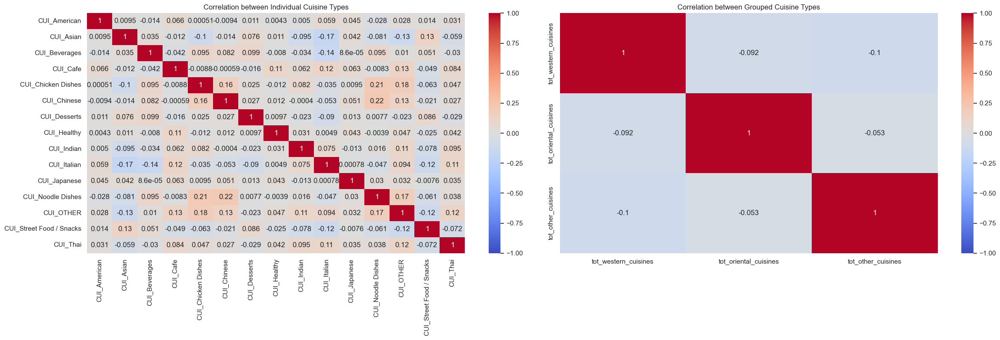

In [68]:
# Plot the correlation heatmaps for individual cuisine types and grouped cuisine types
plot_correlation_heatmaps(
     df,
     individual_columns=compute_total_cuisine(df),
     grouped_columns=['tot_western_cuisines', 'tot_oriental_cuisines', 'tot_other_cuisines'],
     individual_title="Correlation between Individual Cuisine Types",
     grouped_title="Correlation between Grouped Cuisine Types",
     figsize=(24, 8)
)

**Conclusions from the Heatmaps on Cuisine Groupings** (Spearman Correlation)

1. **Correlation between Individual Cuisine Types**:
- The first heatmap presents the correlation matrix for individual cuisine types.
- Most cuisine types show low correlations with each other, generally close to **0**, indicating that orders for these cuisines are largely independent.
- Certain pairs, such as **`CUI_Asian` and `CUI_Beverages`** or **`CUI_Chinese` and `CUI_Indian`**, exhibit slightly higher correlations (around **0.1 to 0.2**). However, these are still weak correlations, suggesting no strong relationships between specific individual cuisines.
- This low correlation supports the decision to group cuisines into broader categories, as it emphasizes the diversity in customer preferences across individual types without significant overlap.

2. **Correlation between Grouped Cuisine Types**:
- The second heatmap shows the correlation matrix for the grouped cuisine categories: **`tot_western_cuisines`**, **`tot_oriental_cuisines`**, and **`tot_other_cuisines`**.
- Correlations between these grouped categories remain low, ranging from **-0.092 to -0.1**, even when analyzed using Spearman's method. This suggests that orders within each grouped cuisine type are **largely independent** of the others.
- The low correlation among grouped categories reinforces the effectiveness of grouping cuisines into broader categories (Western, Oriental, Other). It confirms that these groups capture distinct customer preferences with minimal overlap.
- Additionally, the independence of these grouped categories implies that they represent separate customer segments or target markets, each characterized by unique dining preferences.

**Exploration of Non-Linear Correlations Between Cuisine Groups**

To investigate potential non-linear associations between the grouped cuisine categories (`tot_western_cuisines`, `tot_oriental_cuisines`, and `tot_other_cuisines`), additional analyses were conducted. Hexbin plots were generated, and alternative correlation coefficients were calculated. 

The results revealed extremely low correlations, with values around **0.1 or lower**, indicating no significant relationship, linear or non-linear, between these grouped cuisine types. 

These findings confirm the independence of customer preferences across the grouped categories, further supporting the effectiveness of this segmentation approach in capturing distinct behavioral patterns.

<a class="anchor" id="section_4_9_2_2">

#### 4.9.2.2 Heat Maps between Days of the Week and between Work and Leisure Days

</a>

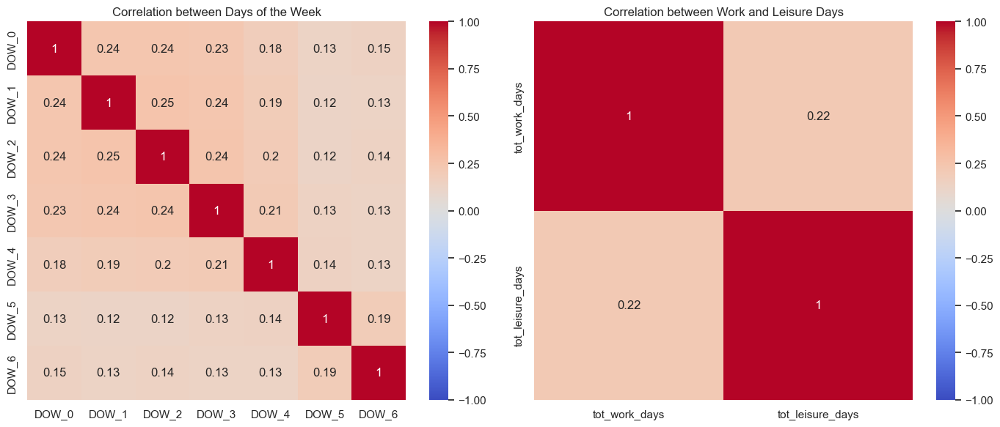

In [69]:
# Plot the correlation heatmaps for individual days of the week and the grouped days (workdays vs leisure days)
plot_correlation_heatmaps(
    df,
    individual_columns=compute_total_products_by_week(),
    grouped_columns=['tot_work_days', 'tot_leisure_days'],
    individual_title="Correlation between Days of the Week",
    grouped_title="Correlation between Work and Leisure Days",
    figsize=(14, 6)
)

**Conclusions from Heatmaps**

1. **Correlation between Days of the Week**
- The heatmap analyzing days of the week shows very low correlations between individual days, ranging from **0.13 to 0.25**.
- This indicates that ordering behavior is largely independent across the week, with minimal dependency between specific days.
- Including Friday in the leisure days created a clearer distinction between the "leisure" and "work" groups, further reducing correlations within each group and enhancing the segmentation.

2. **Correlation between Work and Leisure Days**
- The correlation between **`tot_work_days`** (workdays) and **`tot_leisure_days`** (leisure days) was approximately **0.22** when Friday was classified as a leisure day.
- This very low correlation suggests that work and leisure day groups are largely distinct in terms of ordering patterns, with minimal overlap or similarity in customer behavior across these two types of days.


**Exploration of Non-Linear Correlations Between Days of the Week and Day Types**

To investigate potential non-linear associations between the days of the week and the categorized day types (`tot_work_days` and `tot_leisure_days`), additional correlation methods were applied, including Spearman correlation and hexbin plot visualizations.

The results indicated very low correlations:
- Correlations between individual days of the week were **0.25 or lower**, highlighting minimal dependency across specific days.
- The correlation between **workdays (`tot_work_days`)** and **leisure days (`tot_leisure_days`)** was even weaker, at approximately **0.22**.

These findings suggest that there is no significant relationship, linear or monotonic, among specific days or between the work and leisure day groups. This lack of correlation confirms the independence of ordering patterns across different days, reinforcing that customer behavior is not strongly influenced by specific days of the week or by whether a day is classified as a workday or leisure day.


<a class="anchor" id="section_4_9_2_3">

#### 4.9.2.3 Heat Maps between Individual Hours and between Grouped Time Periods

</a>

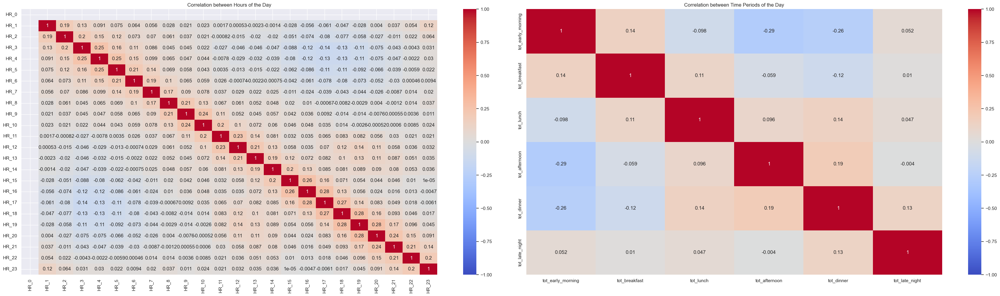

In [70]:
# Plot the correlation heatmaps for individual days of the week and the grouped days (workdays vs leisure days)
plot_correlation_heatmaps(
    df,
    individual_columns=compute_total_products_by_day(),
    grouped_columns=['tot_early_morning', 'tot_breakfast', 'tot_lunch', 'tot_afternoon', 'tot_dinner', 'tot_late_night'],
    individual_title="Correlation between Hours of the Day",
    grouped_title="Correlation between Time Periods of the Day",
    figsize=(35, 10)
)

**Conclusions from the Heatmaps on the Grouping of Time Periods**

1. **Correlation between Individual Hours:**
- The first heatmap presents the Spearman correlation between all hours of the day, showing mostly very low values, especially between hours that are further apart.
- This indicates minimal dependency between specific hours in terms of order frequency, suggesting that the popularity of orders in one hour does not significantly influence orders in preceding or following hours.
- Slightly higher correlations are observed between adjacent hours, such as **`HR_11` and `HR_12`** or **`HR_18` and `HR_19`**, which likely reflect transitional periods like lunch and dinner, where demand remains relatively stable over these meal-related time blocks.



2. **Correlation between Grouped Time Periods:**
- The second heatmap shows the Spearman correlation between grouped time periods: **early morning**, **breakfast**, **lunch**, **afternoon**, **dinner**, and **late night**.
- The **lunch** and **dinner** periods exhibit a mild positive correlation, aligning with expectations as these are peak meal times when customers tend to place more orders. This suggests a degree of consistency in customer behavior during these periods.
- Other periods, such as **breakfast** and **early morning**, show negligible correlations with the rest, indicating that these time blocks represent distinct ordering behaviors with little overlap in customer demand patterns.

**Note: `HR_0` Column in Correlation Analysis**

The `HR_0` column in the correlation heatmap shows zero correlation with all other hourly columns. This indicates that no orders were recorded during this hour across all observations. Notably, this behavior reflects the absence of customer activity during this period (midnight to 1 AM) rather than missing or unrecorded data.

To verify that all values in `HR_0` are indeed zero, the following validation was conducted:

In [71]:
# Check if all values in HR_0 are zero
is_hr_0_all_zero = (df['HR_0'] == 0).all()

# Output the result
print(f"Is HR_0 entirely zero? {is_hr_0_all_zero}")

Is HR_0 entirely zero? True


This validation confirms that `HR_0` consistently contains only zero values. As a result, no imputation or correction is required. This behavior aligns with typical customer ordering patterns, where orders are rarely placed during this time period (midnight to 1 AM).

**Exploration of Non-Linear Correlations Between Time Periods of the Day**

To examine potential non-linear associations between grouped time periods, additional correlation methods were applied. Visual tools, such as hexbin plots, were used to analyze the relationships between these time groups.

The results revealed very low correlations, with values ranging between **0.1 and 0.2** at most. These findings indicate that there is no significant relationship—linear or non-linear—between the grouped time periods. 

This confirms that customer ordering behavior is largely independent across different times of the day. Each time period captures distinct ordering patterns with minimal overlap, reinforcing the validity of these groupings for analyzing unique customer behaviors.


<a class="anchor" id="section_4_9_3">

### 4.9.3 Analysis of Demand Patterns Across Cuisine Groups, Day Types, and Time Periods

</a>

<a class="anchor" id="section_4_9_3_1">

#### 4.9.3.1 Analysis of Bar Plots: Cuisine Group Popularity by Time of Day

</a>

In [75]:
period_trend_by_time = calculate_period_trend_by_time(df) # Creates a DataFrame showing the total orders for each cuisine group across different time periods
period_trend_by_cuisine = calculate_period_trend_by_cuisine(df) # Creates a DataFrame showing the total orders for each time period across different cuisine groups

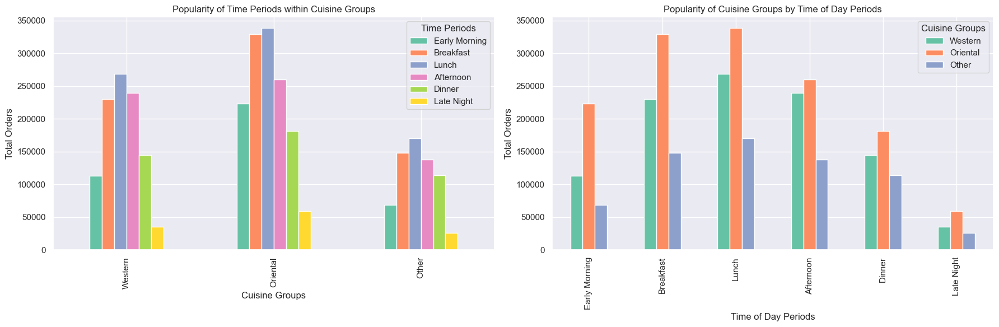

In [ ]:
# Plot the barplot with the relationships
plot_side_by_side_barcharts(
    period_trend_by_time,
    period_trend_by_cuisine,
    title1="Popularity of Time Periods within Cuisine Groups",
    title2="Popularity of Cuisine Groups by Time of Day Periods",
    xlabel1="Cuisine Groups",
    xlabel2="Time of Day Periods",
    ylabel1="Total Orders",
    ylabel2="Total Orders",
    legend_title1="Time Periods",
    legend_title2="Cuisine Groups",
    figsize=(18, 6),
    color_palette="Set2"
)

**Observations from the First Plot (Popularity of Time Periods within Cuisine Groups)**

1. **Western Cuisine**:
   - Demand for Western cuisine peaks during **lunch**, followed closely by **breakfast** and **dinner**.
   - There is a noticeable drop in orders during **early morning** and **late night**, indicating lower popularity during off-peak hours.

2. **Oriental Cuisine**:
   - Oriental cuisine is most popular during **lunch**, followed by **breakfast** and **afternoon** periods.
   - Unlike Western cuisine, Oriental dishes maintain relatively consistent demand across various periods, with only a modest decline during **late night**.

3. **Other Cuisine**:
   - "Other" cuisines see generally lower demand across all time periods, with **lunch** being the most popular.
   - This group follows a pattern similar to Western cuisine, with significant declines in orders during **early morning** and **late night** periods.

<br>**Observations from the Second Plot (Popularity of Cuisine Groups by Time of Day Periods)**

1. **Breakfast and Lunch Peaks**:
   - Both Western and Oriental cuisines experience strong peaks in demand during **breakfast** and **lunch**, highlighting these as the primary times of customer activity.
   - Oriental cuisine consistently outperforms Western cuisine across most periods, particularly during **lunch**.

2. **Distinct Patterns in Demand**:
   - Western and Oriental cuisines maintain steady order volumes during key meal times, while "Other" cuisines see significantly lower demand across all periods.
   - **Late night orders** are minimal across all cuisine groups, reflecting typical dining behaviors.

3. **General Trends**:
   - Oriental cuisine emerges as the most popular overall, with strong customer preference across most periods.
   - The distribution of orders aligns with standard eating habits, with peaks during **breakfast**, **lunch**, and **dinner**, and minimal activity during **early morning** and **late night**.

<br>**Summary**

Customer preferences indicate that Oriental cuisine enjoys consistent popularity, making it a staple choice for many customers. In contrast, "Other" cuisines appear to cater to more specific tastes or niche occasions, reflecting a narrower audience.

When it comes to meal time dynamics, primary meal times (breakfast, lunch, and dinner) dominate order volumes across all cuisine groups, underscoring their importance as the main drivers of customer activity. Meanwhile, early morning and late night consistently remain low-demand periods across all cuisine categories, aligning with expected patterns in customer behavior.


<a class="anchor" id="section_4_9_3_2">

#### 4.9.3.2 Analysis of Bar Plots: Popularity of Work and Leisure Days by Cuisine Groups

</a>

In [78]:
work_leisure_trend_by_daytype = calculate_work_leisure_trend_by_daytype(df) # Creates a DataFrame showing total orders on work and leisure days by cuisine groups
work_leisure_trend_by_cuisine = calculate_work_leisure_trend_by_cuisine(df) # Creates a DataFrame showing total orders on work and leisure days by day types

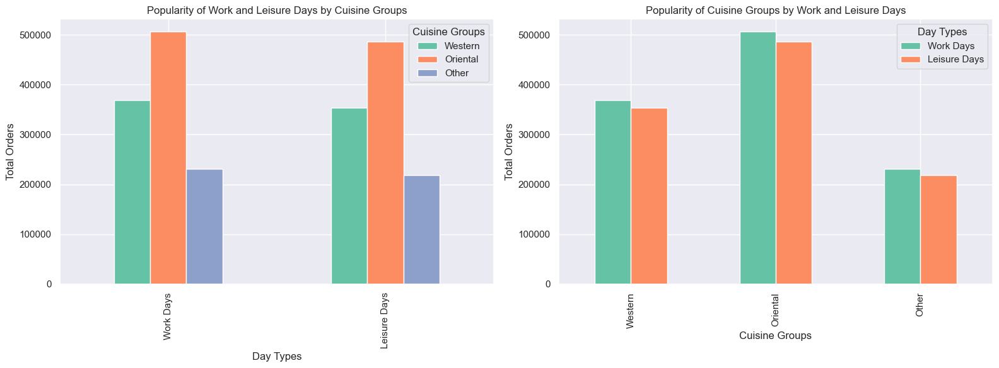

In [ ]:
# Plot the barplot with the relationships
plot_side_by_side_barcharts(
    df1=work_leisure_trend_by_daytype,  # First DataFrame
    df2=work_leisure_trend_by_cuisine,  # Second DataFrame
    title1="Popularity of Work and Leisure Days by Cuisine Groups",
    title2="Popularity of Cuisine Groups by Work and Leisure Days",
    xlabel1="Day Types",
    xlabel2="Cuisine Groups",
    ylabel1="Total Orders",
    ylabel2="Total Orders",
    legend_title1="Cuisine Groups",
    legend_title2="Day Types",
    figsize=(16, 6),  # Figure size
    color_palette="Set2"  # Color palette
)

**Observations from the First Plot (Popularity of Work and Leisure Days by Cuisine Groups)**

1. **General Trends**:
  - Across all three cuisine groups (**Western**, **Oriental**, and **Other**), the number of orders is slightly higher on **work days** compared to **leisure days**.
  - This difference is consistent across all cuisine types, indicating that the decrease in orders from work days to leisure days is proportional. Customers do not show a significant preference for any particular cuisine type on work days versus leisure days.

2. **Oriental Cuisine**:
  - Oriental cuisine remains the most popular choice on both work and leisure days, reinforcing its status as a favorite among customers regardless of day type.
  - The small decline in orders from work days to leisure days mirrors the trend observed in Western and Other cuisines, suggesting that Oriental cuisine is a consistently preferred option across all contexts.

<br>**Observations from the Second Plot (Popularity of Cuisine Groups by Work and Leisure Days)**

1. **Work Days vs. Leisure Days**:
  - Oriental cuisine consistently receives the highest number of orders on both work and leisure days, followed by Western cuisine, with the Other category receiving the fewest orders. This indicates a stable preference hierarchy that persists regardless of day type.

2. **Proportional Decrease**:
  - The reduction in orders from work days to leisure days is proportional across all cuisine groups. This suggests that customers do not significantly shift their cuisine preferences between these day types. Instead, the overall decrease in orders on leisure days reflects a general reduction in order frequency, while the preference structure among cuisine groups remains consistent.

<br>**Summary**

Customer activity patterns reveal that work days consistently have higher order volumes compared to leisure days, with peak activity observed during Lunch and Dinner. These two time periods dominate customer preferences, making them critical focal points for improving business performance.

<a class="anchor" id="section_4_9_3_3">

#### 4.9.3.3 Analysis of Time Period Demand on Work and Leisure Days

</a>

In [82]:
period_trend_work_leisure_by_day_type = calculate_period_trend_by_day_type(df) # Creates a DataFrame that calculates the total orders for each time period on work and leisure days, using Day Types as columns
period_trend_work_leisure_by_time_period = calculate_period_trend_by_time_period(df) # Creates a DataFrame that calculates the total orders for each time period on work and leisure days, using Time Periods as columns

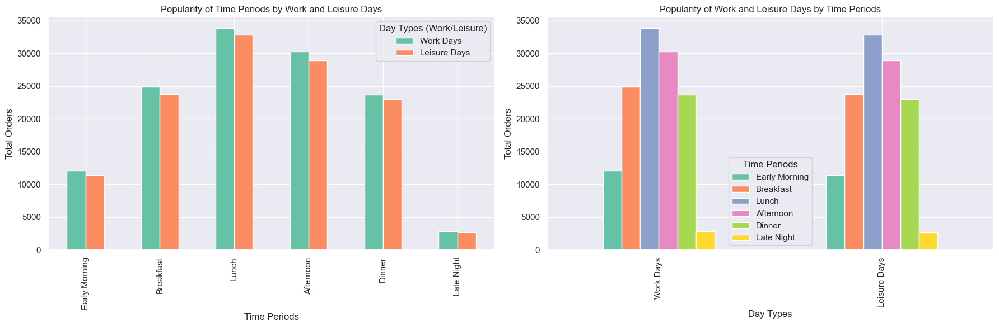

In [83]:
# Plot the barplot with the relationships
plot_side_by_side_barcharts(
    df1=period_trend_work_leisure_by_day_type,  # First DataFrame
    df2=period_trend_work_leisure_by_time_period,  # Second DataFrame
    title1="Popularity of Time Periods by Work and Leisure Days",
    title2="Popularity of Work and Leisure Days by Time Periods",
    xlabel1="Time Periods",
    xlabel2="Day Types",
    ylabel1="Total Orders",
    ylabel2="Total Orders",
    legend_title1="Day Types (Work/Leisure)",
    legend_title2="Time Periods",
    figsize=(18, 6),  # Figure size
    color_palette="Set2"  # Color palette
)

**Observations from the First Plot (Total Orders by Time Periods on Work and Leisure Days)**

1. **Comparison Across Time Periods**:
  - The bar plot displays total orders for each time period across **work** and **leisure days**, with time periods represented on the x-axis. Key observations include:
    - **Lunch** and **Afternoon** have the highest order volumes for both work and leisure days, highlighting these as peak periods for customer activity. Lunch sees slightly higher demand on work days compared to leisure days.
    - **Dinner** and **Breakfast** exhibit nearly identical order volumes across work and leisure days, suggesting consistent customer interest in these periods regardless of the day type.
    - **Early Morning** and **Late Night** have the lowest order volumes across both day types, reflecting minimal demand during these off-peak hours. **Late Night**, in particular, shows a consistent pattern between work and leisure days.

<br>**Observations from the First Plot (Time Periods by Work and Leisure Days)**

1. **Comparison Across Work and Leisure Days**:
  - In this bar plot, **work** and **leisure days** are on the x-axis, with time periods represented as categories within each day type. Key findings include:
    - **Lunch** and **Afternoon** remain the most popular time periods for both work and leisure days, confirming these as peak order times. Lunch shows slightly higher demand on work days, but both time periods maintain consistently high volumes.
    - **Dinner** and **Breakfast** again display similar order volumes across both day types, reinforcing the balanced demand pattern observed in the left plot.
    - **Early Morning** and **Late Night** continue to show the lowest order volumes, indicating limited customer activity during these times for both work and leisure days.

<br>**Summary**

These observations confirm that **Lunch** and **Afternoon** are the primary drivers of customer orders, with consistently high demand across work and leisure days. In contrast, **Early Morning** and **Late Night** remain off-peak periods with minimal activity. **Dinner** and **Breakfast** exhibit steady, balanced demand, making them secondary but reliable periods for customer engagement.

<div class="alert alert-block alert-success">
<a class="anchor" id="section_6">

# 6. Visual Exploration

</a>
<div>

[Back to ToC](#toc)<br>

In [191]:
# Define metric and non-metric features.
metric_features = df.select_dtypes(include=['number']).columns.to_list()
non_metric_features = df.columns.drop(metric_features).to_list()

<a class="anchor" id="section_6_1">

## 6.1 Numeric Variables - Univariate Analysis


</a>

<a class="anchor" id="section_6_1_1">

### 6.1.1 Histograms

[Back to 6.1. Numeric Variables-Univariate Analysis](#section_6_1)<br>

</a>


In [192]:
""" def number_bins_sturges(data):
    '''
    Calculates the number of bins based on the number of data points, using Sturges' rule
    Sturges' rule: k = log2(n) + 1

    Requires: The dataset for which the number of bins is to be calculated.
    Ensures:
        - The returned value is a positive integer representing the number of bins.
        - The number of bins increases logarithmically as the dataset size increases.
    '''

    n = len(data)
    bins = np.ceil(np.log2(n) + 1) # np.log2 computes the base-2 logarithm of n, and np.ceil rounds the result up to the next whole number.
    return int(bins) """

" def number_bins_sturges(data):\n    '''\n    Calculates the number of bins based on the number of data points, using Sturges' rule\n    Sturges' rule: k = log2(n) + 1\n\n    Requires: The dataset for which the number of bins is to be calculated.\n    Ensures:\n        - The returned value is a positive integer representing the number of bins.\n        - The number of bins increases logarithmically as the dataset size increases.\n    '''\n\n    n = len(data)\n    bins = np.ceil(np.log2(n) + 1) # np.log2 computes the base-2 logarithm of n, and np.ceil rounds the result up to the next whole number.\n    return int(bins) "

In [193]:
# Create a list with all the type of food columns
cuisine_cols= df.columns[df.columns.str.contains('CUI')].tolist()
# Create a list with variables referring to the hours of the day
hr_cols = df.columns[df.columns.str.contains('HR')].tolist()
# Create a list with variables referring to the days of the week
dow_cols = df.columns[df.columns.str.contains('DOW')].tolist()
# Create a list with the other numerical variables
others_cols= [item for item in metric_features if item not in cuisine_cols +hr_cols + dow_cols]

# Create a new list with all numeric variables divided by the lists created above
metric_features_sep=[others_cols,cuisine_cols,hr_cols,dow_cols]

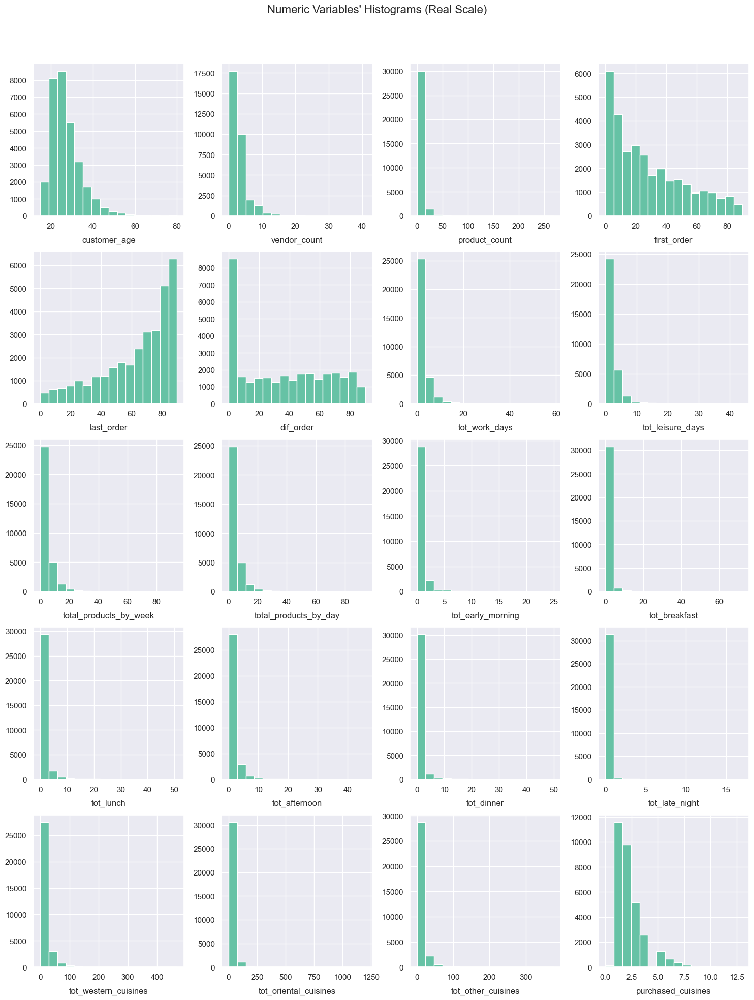

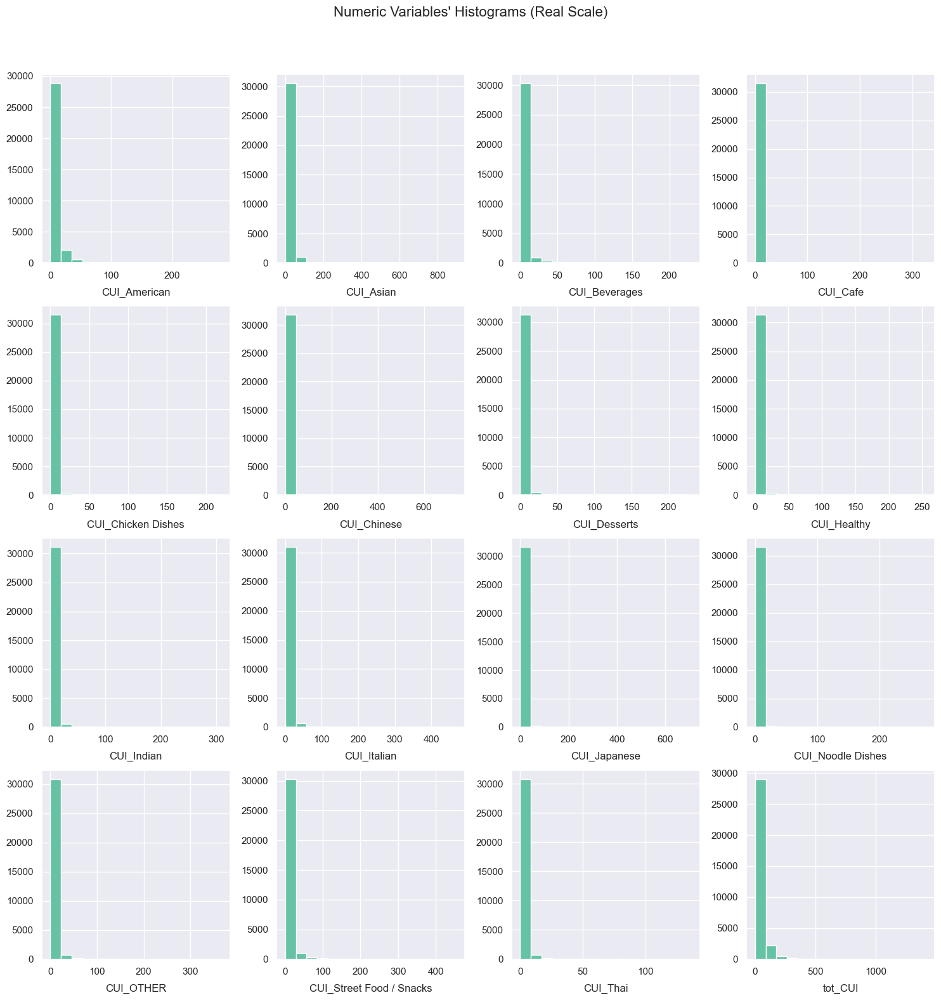

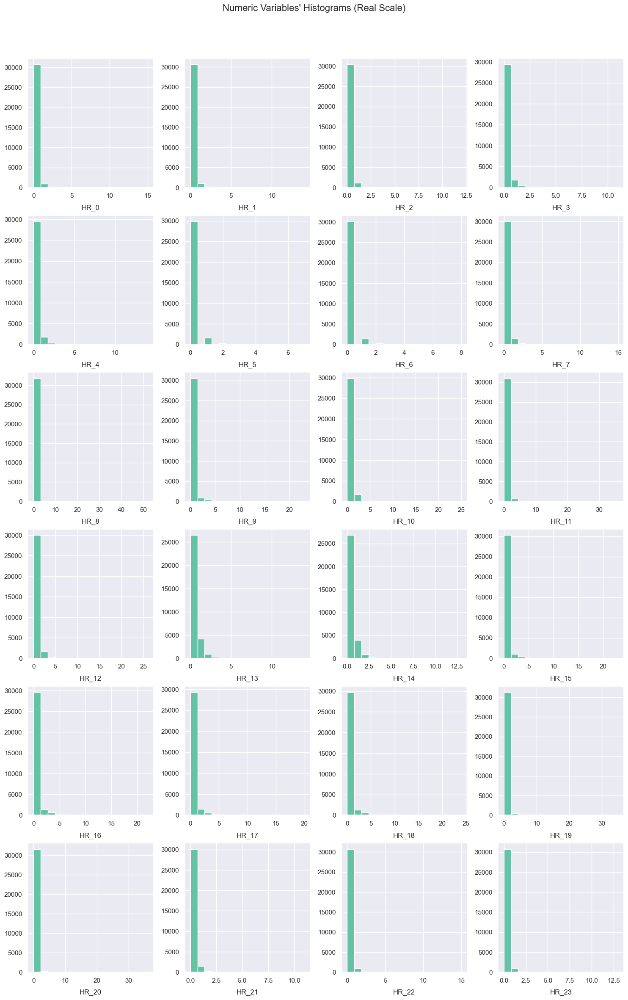

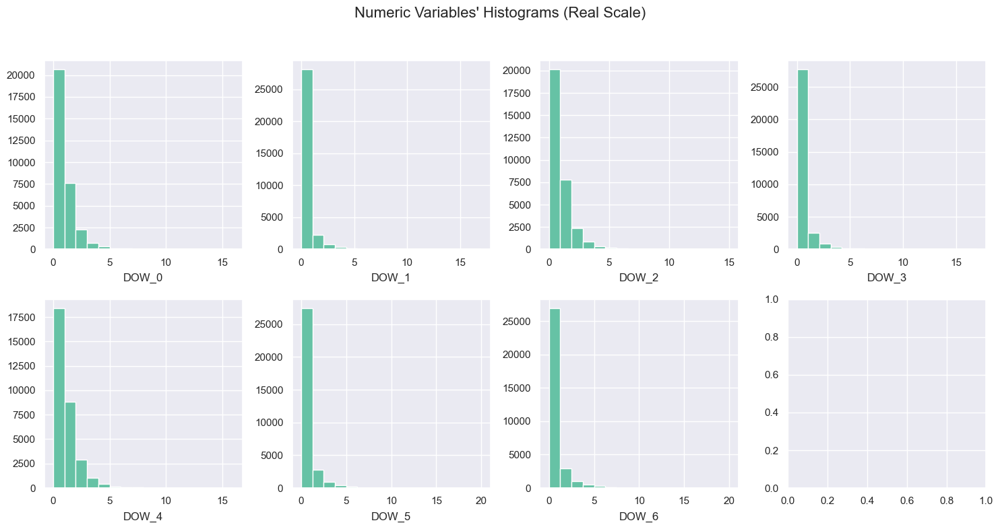

In [194]:
sns.set() # Set the Seaborn styling for consistent and clean plots

# Loop through each list of columns (cuisine, hr, dow, others)
for list in metric_features_sep:

    n_rows= ceil(len(list) /4) # Calculate the number of rows based on the number of features

    # Prepare the figure with subplots. The size dynamically changes based on the number of rows
    fig, axes = plt.subplots(n_rows,4, figsize=(15, n_rows *4),tight_layout=True)

    # Plot data
    # Iterate across axes objects and associate each histogram (hint: use the ax.hist() instead of plt.hist()):
    for ax, feat in zip(axes.flatten(), list): # 'flatten()' allows us to treat all subplots in a single loop
        bins_numb= number_bins_sturges(df[feat])
        ax.hist(df[feat], bins=bins_numb, color="#66c2a5")
        ax.set_title(feat, y=-0.20)  # Set the title for each subplot, positioned slightly above the plot (y=1.05)


    # Add a centered title to the figure:
    title = "Numeric Variables' Histograms (Real Scale)"

    plt.suptitle(title,fontsize=16) # Place the title at the top of the figure with larger font size

    # Adjust layout and leave space for the main title
    plt.tight_layout(rect=[0, 0, 1, 0.95])

    plt.show() # Display the current figure

**Conclusions From Histogram Analysis:**
+ `customer_age`: The age of customers seems to have a right-skewed distribution, with a concentration of values between 20 and 40 years. The distribution is approximately asymmetric, potentially resembling a Weibull or exponential distribution.
+ `vendor_count`: The vendor count displays a strong right-skewness, indicating that the majority of values are concentrated towards the lower end of the range. Given its discrete nature and decreasing trend as the number of vendors increases, it is likely that the distribution follows a Poisson distribution.
+ `product_count`: Although difficult to observe visually due to the scale, it appears to show significant concentration below 50, suggesting that most values are clustered around this range.
+ `first_order`: There is higher concentration on the left with a right tail. This indicates that most customers placed their first order early in the dataset’s timeline.
+  `last_order`: Increases as days increase, meaning that by the end of data collection, most customers had placed orders recently.
+  `df_order`: The difference between orders appears to have a relatively uniform distribution between 0 and 80, with higher peaks at specific values. It seems to have a mostly uniform distribution.
+  `tot_works_days`, `tot_leisures_days`, `total_products_by_week`, `total_products_by_day` : These variables all appear to have similar distributions.
+  For most of the other graphs, it is not possible to make observations due to the scale.

To facilitate the interpretation of the underlying distribution, the identification of trends and patterns of behavior, we resort to the logarithmic scale.

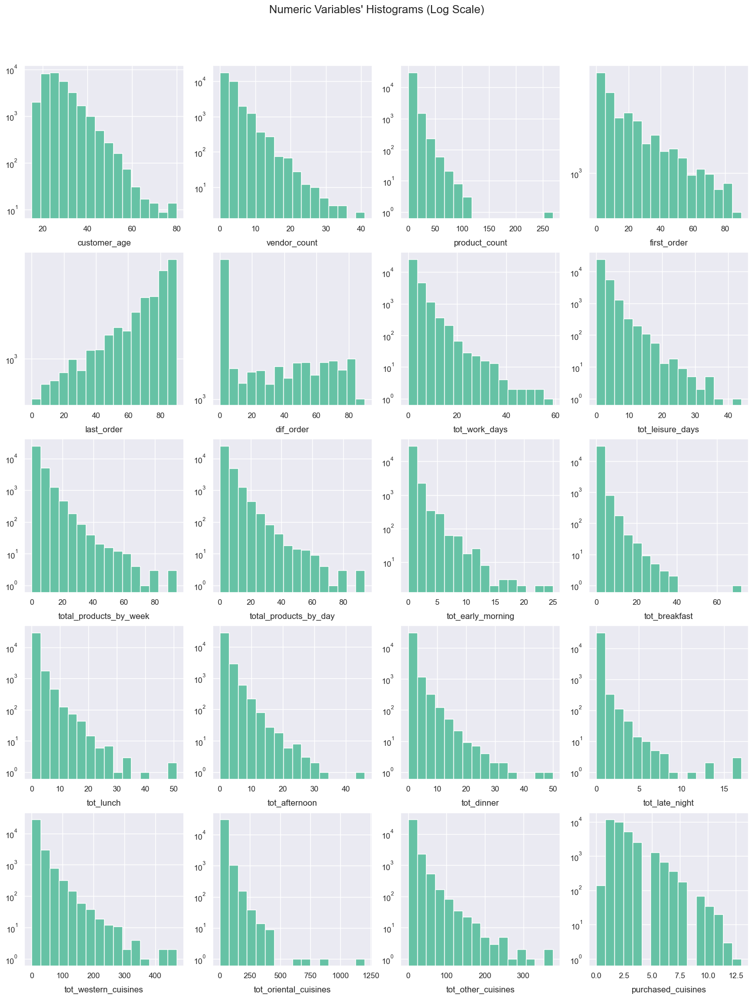

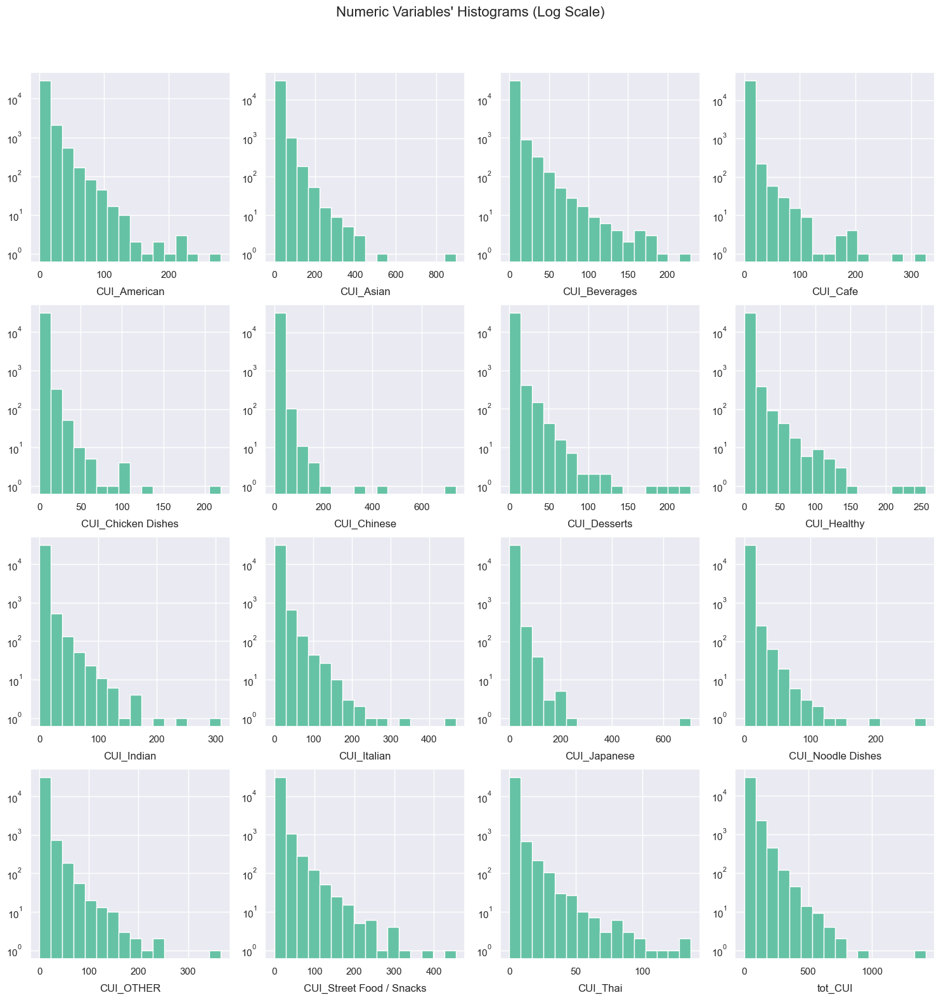

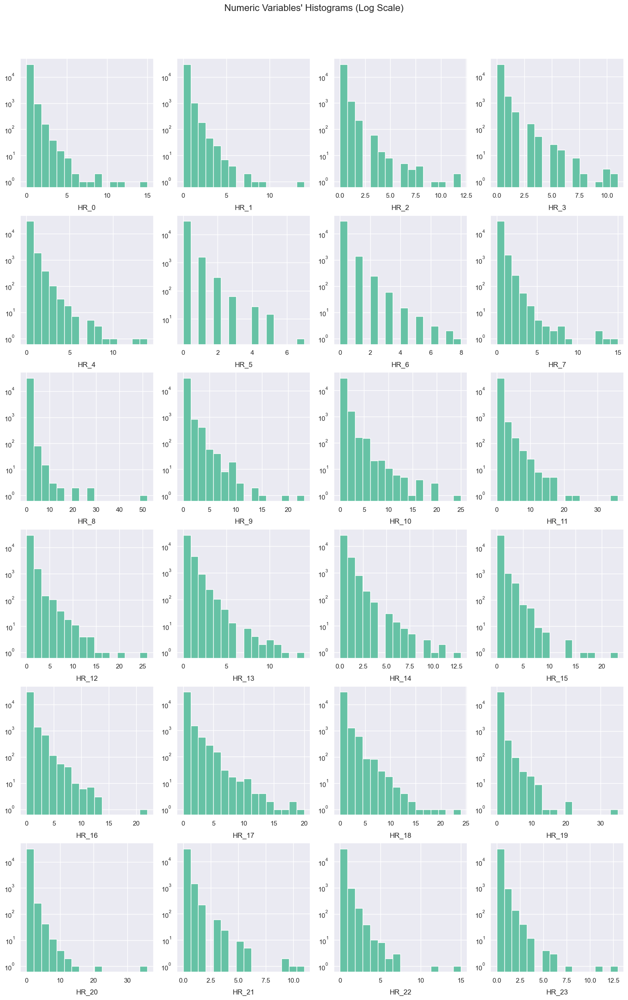

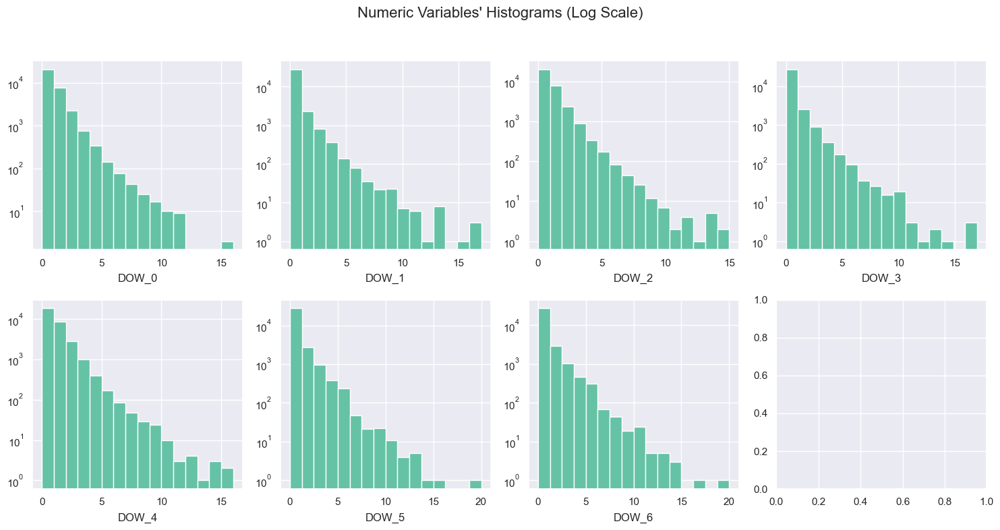

In [195]:
sns.set() # Set the Seaborn styling for consistent and clean plots

# Loop through each list of columns (cuisine, hr, dow, others)
for list in metric_features_sep:

    n_rows= ceil(len(list) /4) # Calculate the number of rows based on the number of features

    # Prepare the figure with subplots. The size dynamically changes based on the number of rows
    fig, axes = plt.subplots(n_rows,4, figsize=(15, n_rows *4),tight_layout=True)

    # Plot data
    # Iterate across axes objects and associate each histogram (hint: use the ax.hist() instead of plt.hist()):
    for ax, feat in zip(axes.flatten(), list): # 'flatten()' allows us to treat all subplots in a single loop
        bins_numb= number_bins_sturges(df[feat])
        ax.hist(df[feat], bins=bins_numb, log = True, color= '#66c2a5')  # Use log scale for better visualization if values are concentrated
        ax.set_title(feat, y=-0.20)  # Set the title for each subplot, positioned slightly above the plot (y=1.05)


    # Add a centered title to the figure:
    title = "Numeric Variables' Histograms (Log Scale)"

    plt.suptitle(title,fontsize=16) # Place the title at the top of the figure with larger font size

    # Adjust layout and leave space for the main title
    plt.tight_layout(rect=[0, 0, 1, 0.95])

    plt.show() # Display the current figure

**Conclusions from Log-Scale Histogram Analysis:**
+ In general, for most variables, the frequency decreases as the values on the x-axis increase, indicating a concentration of lower values and suggesting a right-skewed distribution.
+ For the variable `last_order`, its values increase as the days increase (as we had already visualized in the histograms with real scale).
+ For the variable `dif_order`, its distribution is practically uniform, which is to be expected since it is the difference between the day of the last order and the day of the first order, and the graphs of these two variables are practically symmetrical.
+ For the variable HR_0, there seem to be no orders,indicating a lack of activity in this category.
+ There are several histograms with gaps in the intervals, suggesting that there are no occurrences in those intervals. It is expected that these gaps exist, for example, in the HR and DOW graphs, as these are discrete variables and therefore do not have values between natural numbers. In the CUI graphs, it simply means that no one spent a certain amount of money.

<a class="anchor" id="section_6_1_2">

### 6.1.2 Box Plots
[Back to 6.1. Numeric Variables-Univariate Analysis](#section_6_1)<br>


</a>

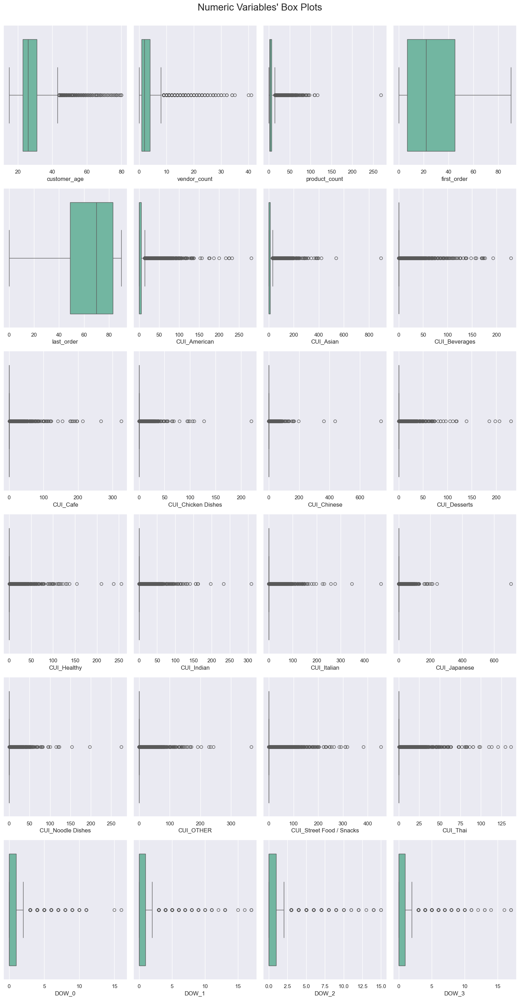

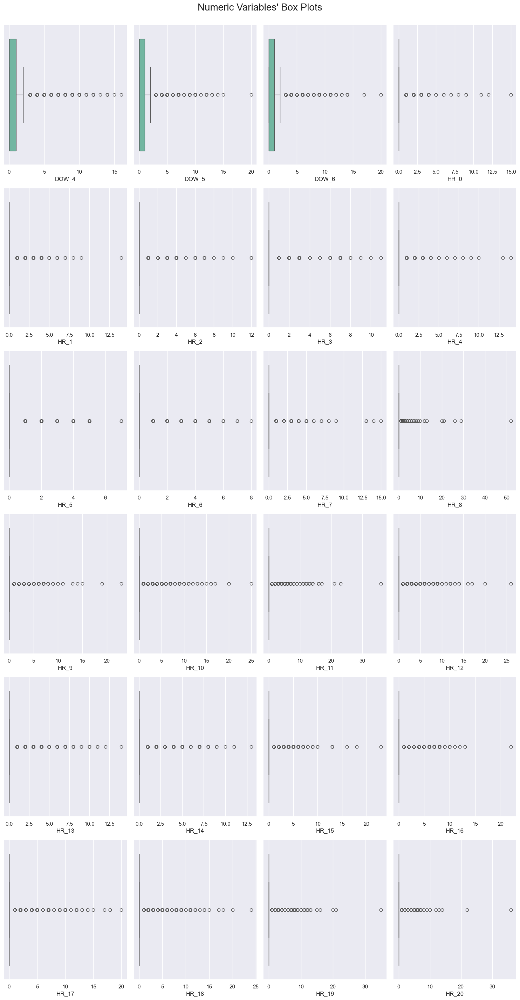

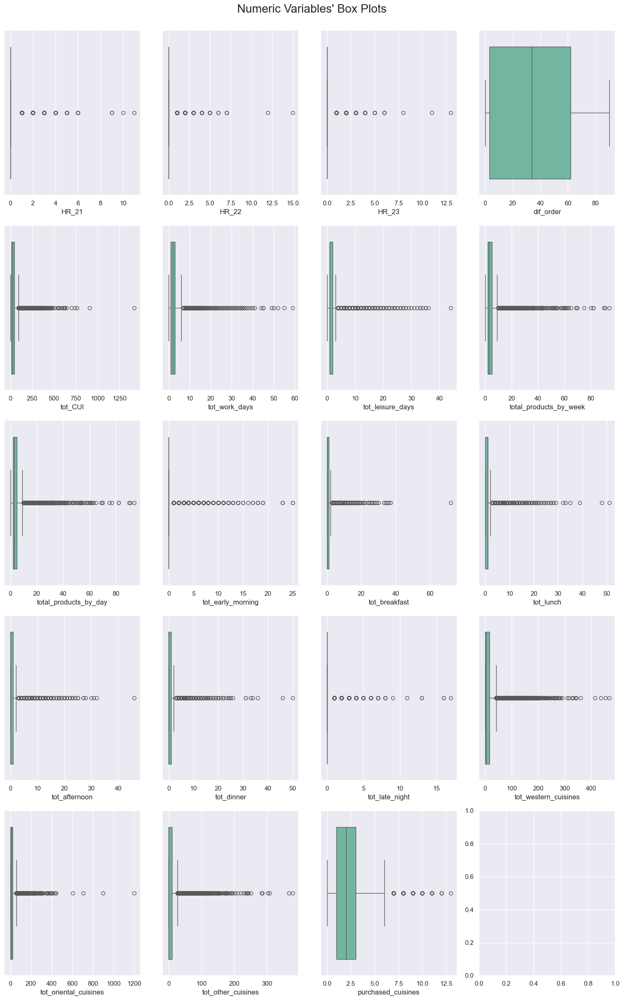

In [196]:
def plot_boxplots(data, title):
  '''
  Plots box plots for a set of numeric features in a dataset, organized across multiple figures
  if the number of features exceeds a specified limit. Each figure displays up to 24 box plots.

  Requires:
  - `data` (pd.DataFrame): DataFrame containing numeric features.
    Each feature column should be numeric and may contain NaN values (these will be ignored in plots).
  - `title` (str): Title for the entire figure, displayed at the top of each figure.

  Ensures:
  - Generates and displays one or more figures with box plots, each containing up to 24 subplots (4x6 grid layout).
  - Each figure will have a centralized title and organized layout, with subplots showing the box plot for
    each specified feature in `data`.
  '''
  # Loop through metric features in batches of 24 (one batch per figure)
  for i in range(0, len(metric_features), 24):
      current_features = metric_features[i:i + 24]

      # Create figure and axis grid based on number of features to plot
      fig, axes = plt.subplots(ceil(len(current_features) / 4), 4, figsize=(15, ceil(len(current_features) / 4) * 5))

      # Create a box plot for each feature in the current batch
      for ax, feat in zip(axes.flatten(), current_features):
        if data[feat].dropna().empty:  # Check for empty data
          ax.set_visible(False)      # Hide axes with no data
        else:
          sns.boxplot(x=data[feat], ax=ax, color='#66c2a5')


      plt.suptitle(title, fontsize=20, y=0.95)
      plt.tight_layout(rect=[0, 0, 1, 0.95])
      plt.show()

plot_boxplots(df,"Numeric Variables' Box Plots")

Most variables have skewed distributions with the median close to or at the lower limit of the box (positive skew) and many outliers towards higher values. This suggests that most values for these variables are low, but there are elevated values. The variables `first_order`, `last_order` and `dif_order` are the only ones without outliers, except for the variable `HR_0`, which only has null values.

<a class="anchor" id="section_6_1_3">

### 6.1.3 Bar Plots
[Back to 6.1. Numeric Variables-Univariate Analysis](#section_6_1)<br>

</a>

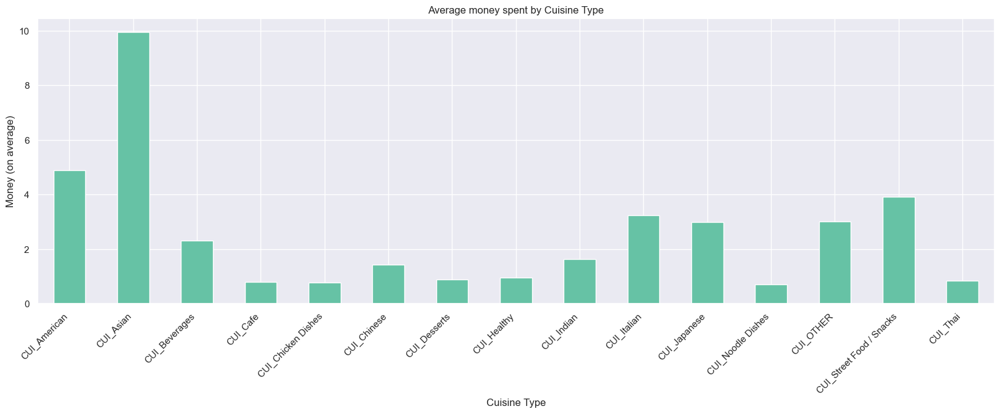

In [197]:
# Filter the column names to get only the ones that contain 'CUI'
cuisine_totals = df.columns[df.columns.str.contains('CUI')]

# Remove the 'tot_CUI' column from the list
cuisine_totals = [col for col in cuisine_totals if col != 'tot_CUI']

# Calculate the mean of the remaining columns
cuisine_means= df[cuisine_totals].mean()

# Plot the mean values as a bar chart
plt.figure(figsize=(20, 6))
cuisine_means.plot(kind='bar', color= '#66c2a5')
plt.title('Average money spent by Cuisine Type')
plt.xlabel('Cuisine Type')
plt.xticks(rotation=45, ha='right')
plt.ylabel('Money (on average)')
plt.show()

**Analysis of Average Expenditure by Cuisine Category**
+ The `CUI_Asian` category exhibits the highest average expenditure, with a mean of approximately 10 monetary units, indicating that customers tend to spend more on average in this category. This may be attributed to its popularity or higher price point.
+ `CUI_American` also displays a relatively high average expenditure, although lower than that of Asian cuisine, with a mean of around 6 monetary units.
+ `CUI_Street Food / Snacks` and `CUI_Italian` categories also exhibit relatively high average expenditures, both exceeding the 3 monetary unit mark.
+ In contrast, cuisine categories such as `CUI_Cafe`, `CUI_Chicken Dishes`, `CUI_Chinese`, `CUI_Healthy`, `CUI_Desserts`, `CUI_Noodle Dishes`, and CUI_Thai display low average expenditures, all below 2 monetary units. This suggests that these types of cuisine may not be as popular or have a lower average ticket price

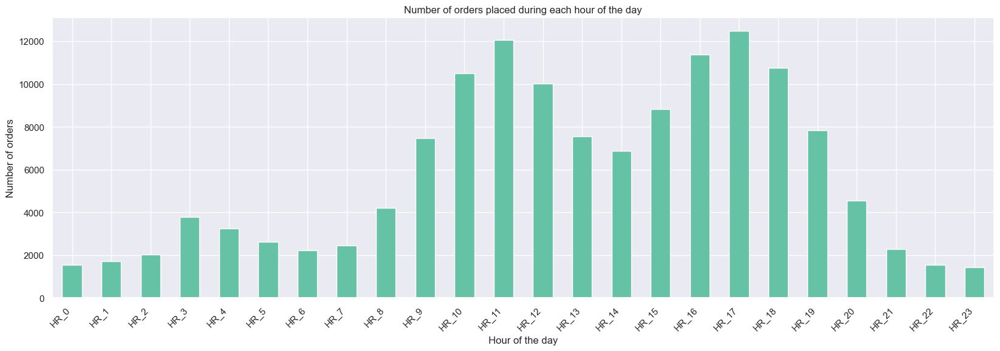

In [198]:
# Filter the column names to get only the ones that contain 'HR'
hr_totals = df.columns[df.columns.str.contains('HR')]

# Calculate the total number of orders per hour of the day
hr_sum= df[hr_totals].sum()

#Plot the results
plt.figure(figsize=(20, 6))
hr_sum.plot(kind='bar', color= '#66c2a5')
plt.title('Number of orders placed during each hour of the day')
plt.xlabel('Hour of the day')
plt.xticks(rotation=45, ha='right')
plt.ylabel('Number of orders')
plt.show()

**Analysis of activity periods**
+ Peak Order Hours: There is a peak in orders at 11:00 AM (`HR_11`) and 5:00 PM (`HR_17`), which coincides with lunch and dinner times, respectively, when demand tends to increase.
+ High Activity Periods: There is a high volume of orders between 9:00 AM and 1:00 PM (`HR_9` to `HR_13`) and between 3:00 PM and 7:00 PM (`HR_15` to `HR_19`), which corresponds to the morning and afternoon rush hours when many customers seek options for breakfast, lunch, or snacks.
+ Low Activity Periods: There is a decrease in the number of orders between 1:00 AM and 7:00 AM (`HR_1` to `HR_7`), as expected for the early morning hours when most people are asleep. Additionally, there is a significant drop in activity between 9:00 PM and 11:00 PM (`HR_21` to `HR_23`), possibly related to the period after dinner when demand naturally tends to decrease.
+ Zero Activity Period: There were no orders at midnight (`HR_0`).

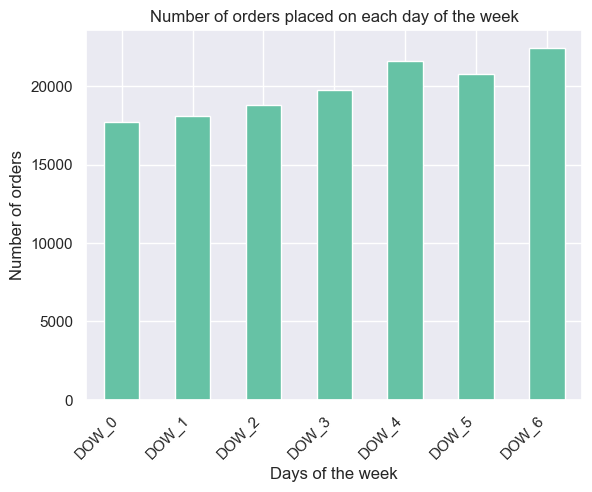

In [199]:
# Filter the column names to get only the ones that contain 'DOW'
dow_totals = df.columns[df.columns.str.contains('DOW')]
# Calculate the total number of orders per day
dow_sum= df[dow_totals].sum()
# Plot the results
dow_sum.plot(kind='bar', color= '#66c2a5')
plt.title('Number of orders placed on each day of the week')
plt.xlabel('Days of the week')
plt.xticks(rotation=45, ha='right')
plt.ylabel('Number of orders')
plt.show()

Despite some variations, the difference in orders between days is not substantial, indicating that orders are relatively evenly distributed throughout the week, with a slight tendency towards an increase towards the end of the week.

<a class="anchor" id="section_6_2">

## 6.2 Numeric Variables - Bivariate Analysis
[Back to 6. Visual Exploration](#section_6)<br>

</a>

In [200]:
# Define a list of variables to remove by combining cuisine, day-of-week, and hour columns
vars_to_remove = cuisine_cols + dow_cols + hr_cols

# Create a new list of metric features, excluding the variables in vars_to_remove
new_metric_features = [var for var in metric_features if var not in vars_to_remove]

# Add 'tot_CUI' to the new list of metric features
new_metric_features.append('tot_CUI')

<a class="anchor" id="section_6_2_1">

### 6.2.1 Scatter Plots

</a>

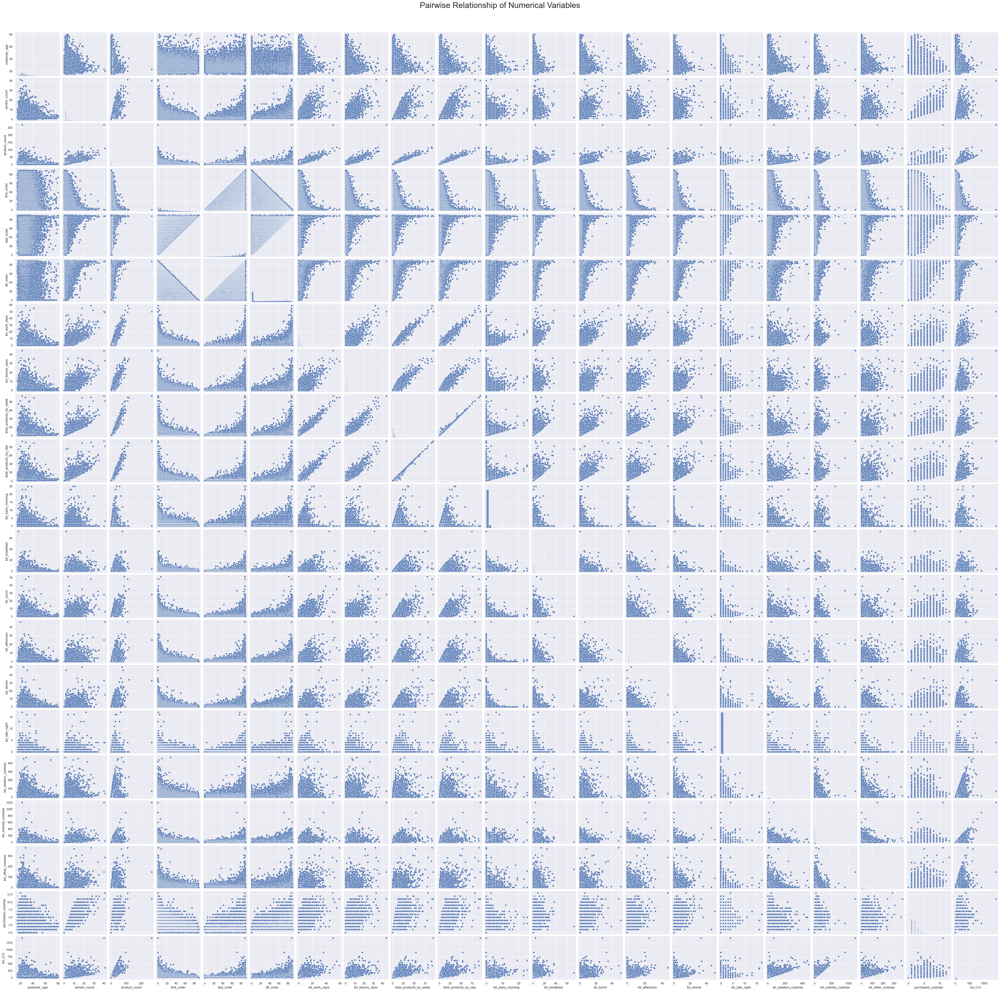

In [201]:
# Setting pairplot
pairplot = sns.pairplot(df[new_metric_features], diag_kind="hist")

# Layout
plt.subplots_adjust(top=0.95)
plt.suptitle("Pairwise Relationship of Numerical Variables", fontsize=30)

plt.show()

**Pairwise Scatter Plot Analysis of Numerical Variables**

The pairwise scatter plot analysis allows us to observe visual relationships among the numerical variables in the dataset, highlighting potential correlations and patterns. Below are some general observations and insights derived from this visualization:

<br>Absence of Strong Correlations
- Most scatter plots show randomly scattered points, indicating a lack of strong linear relationships between variables.
- Some variables exhibit slightly inclined patterns, but the visual correlation appears weak. This suggests that, for most variables, a simple linear relationship may not adequately capture dependency patterns.

<br>Presence of Clusters and Non-Linear Patterns
- In certain plots, clusters or groupings of points are visible. These clusters may indicate subsets of customers with similar behaviors across specific variables.
- Rather than a linear relationship, these patterns may suggest that categorical variables or new groupings (such as work vs. leisure days or time periods) could be more relevant for segmentation or behavior analysis.

<br>Outliers and Value Ranges
- Some variables appear to contain outliers (points distant from the majority of the data). For example, variables capturing order counts may show extreme values representing high-frequency customers.
- The presence of outliers and dispersion in some variables suggests high variability in customer behavior, possibly indicating distinct consumption profiles (e.g., casual vs. frequent customers).

<br>Univariate Distributions on the Diagonals
- The diagonal presents individual histograms for each variable, allowing univariate distribution analysis.
- Observing these histograms, we see that some variables have skewed distributions, indicating that customer behavior is not uniformly distributed. This is important for descriptive analysis, as it suggests that most customers tend to follow certain behaviors (e.g., preferred times or days).

**In summary**, the scatter plot matrix suggests a relative independence among numerical variables and indicates the need for more advanced methods to capture the complexity of behavior patterns in the dataset. This analysis reinforces the importance of derived variables and previously defined groupings, such as time categories and consumption periods, to gain deeper insights into customer behavior.


<a class="anchor" id="section_6_2_2">

### 6.2.2 Heatmaps
[Back to 6.2. Numeric Variables-Bivariate Analysis](#section_6_2)<br>
</a>

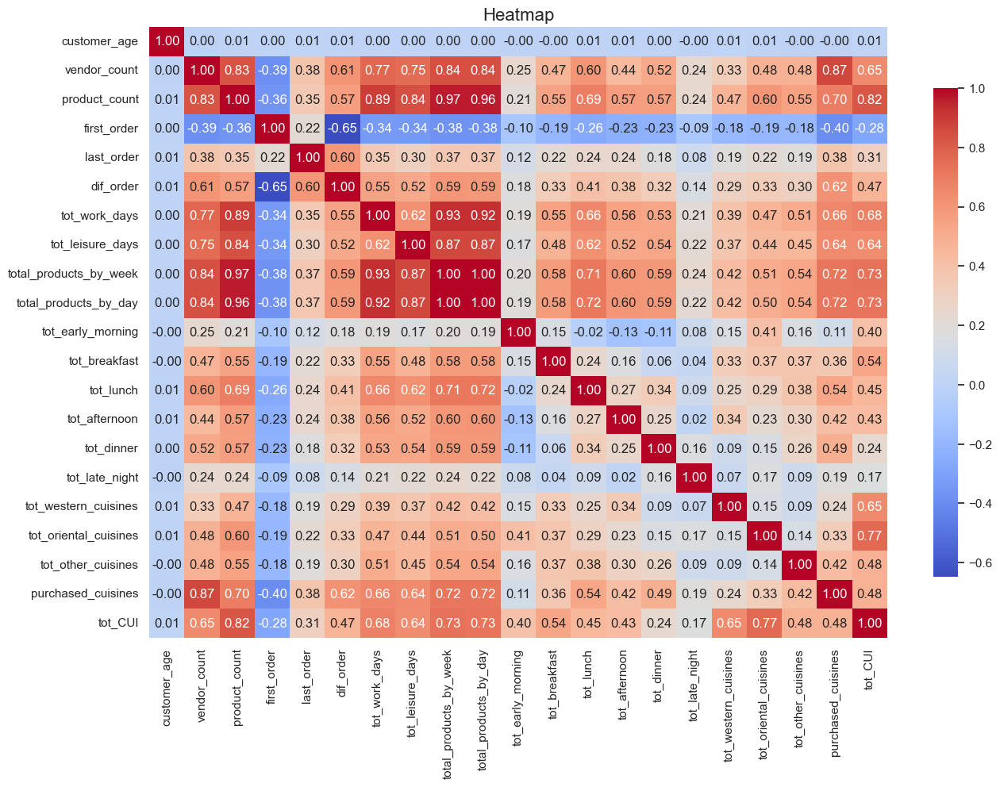

In [202]:
# Calculate the correlation matrix for the selected features
correlation_matrix = df[new_metric_features].corr()

# Set up the figure size for the heatmap
plt.figure(figsize=(15, 10))  # Adjust the figure size as needed

# Create the heatmap to visualize the correlations
heatmap = sns.heatmap(correlation_matrix,
                      annot=True,          # Display correlation values
                      fmt=".2f",           # Format numbers to 2 decimal places
                      cmap='coolwarm',     # Use the 'coolwarm' color map
                      cbar_kws={"shrink": .8})  # Adjust the color bar size

# Set the title for the heatmap
plt.title('Heatmap', fontsize=16)
plt.show()

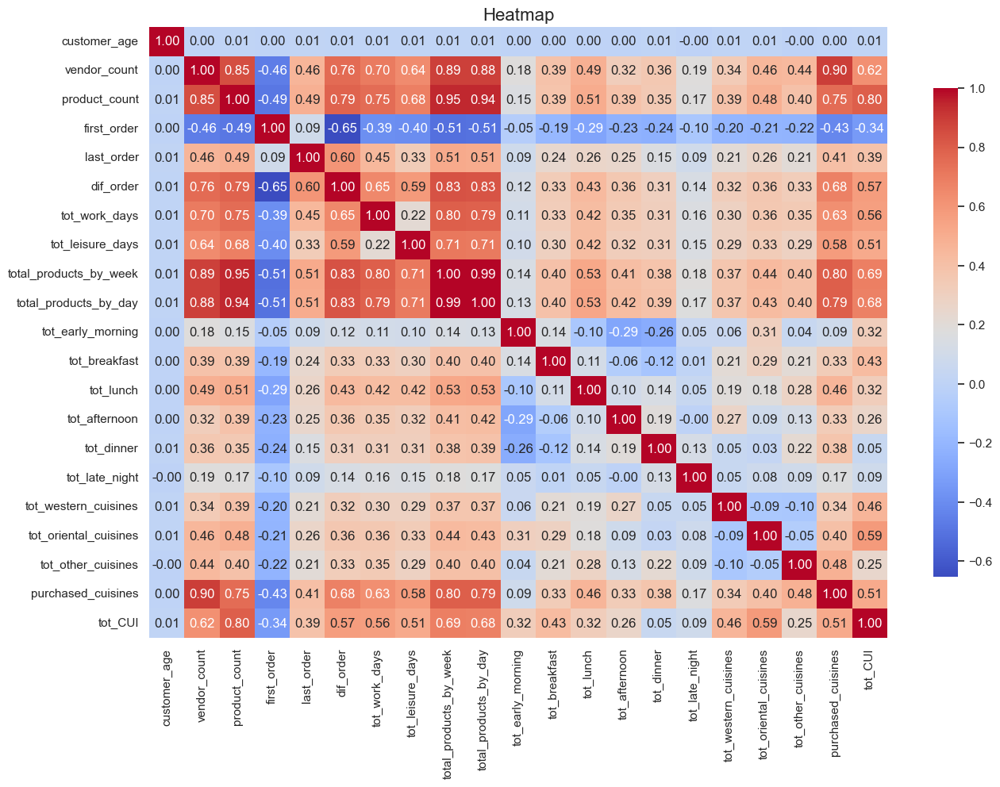

In [203]:
# Calculate the Spearman correlation matrix for the selected features
correlation_matrix = df[new_metric_features].corr("spearman")

# Set up the figure size for the heatmap
plt.figure(figsize=(15, 10))  # Adjust the figure size as needed

# Create the heatmap to visualize the correlations
heatmap = sns.heatmap(correlation_matrix,
                      annot=True,          # Display correlation values
                      fmt=".2f",           # Format numbers to 2 decimal places
                      cmap='coolwarm',     # Use the 'coolwarm' color map
                      cbar_kws={"shrink": .8})  # Adjust the color bar size

# Set the title for the heatmap
plt.title('Heatmap', fontsize=16)
plt.show()

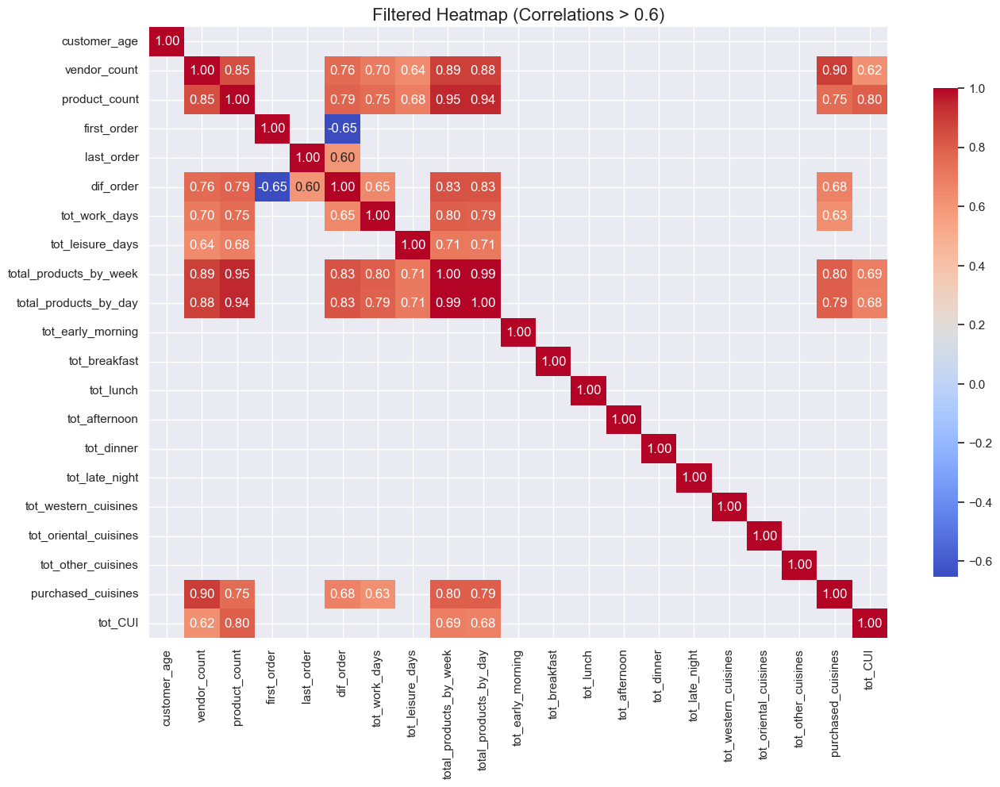

In [204]:
# Apply a filter: set values < 0.6 to NaN
filtered_correlation_matrix = correlation_matrix.where(abs(correlation_matrix) > 0.6)

# Set up the figure size for the heatmap
plt.figure(figsize=(15, 10))  # Adjust the figure size as needed

# Create the heatmap to visualize the filtered correlations
heatmap = sns.heatmap(filtered_correlation_matrix,
                      annot=True,          # Display correlation values
                      fmt=".2f",           # Format numbers to 2 decimal places
                      cmap='coolwarm',     # Use the 'coolwarm' color map
                      cbar_kws={"shrink": .8})  # Adjust the color bar size

# Set the title for the heatmap
plt.title('Filtered Heatmap (Correlations > 0.6)', fontsize=16)
plt.show()

**Observations from the Heatmap Analysis: Pearson and Spearman Comparison**

1. **High Correlation Among Product Count Variables**:
   - Variables like `product_count`, `total_products_by_week`, and `total_products_by_day` consistently show strong correlations in both Pearson and Spearman matrices, which is expected as they measure product counts over different time intervals.
   - This highlights a stable purchasing behavior over time, reinforcing the idea that customers maintain consistent ordering patterns on both weekly and daily scales.

2. **Impact of Day Types on Product Consumption**:
   - The variables representing `tot_work_days` and `tot_leisure_days` show moderate to high correlations with product metrics such as `vendor_count` and `product_count`, indicating a relationship between the type of day and ordering behavior.
   - In both Pearson and Spearman correlations, `tot_work_days` and `tot_leisure_days` show correlations above 0.5 with some product-related metrics, suggesting that ordering habits differ between workdays and leisure days. This could be due to different routines or lifestyle patterns on these days.

3. **Correlation Between Meal Periods and Product Count**:
   - Meal-time variables, like `tot_lunch` and `tot_dinner`, have moderate correlations with `product_count` and `vendor_count`, indicating that orders tend to peak around typical meal times.
   - Pearson and Spearman both show that these meal periods are associated with higher order volumes, supporting the observation that lunch and dinner are key times for food ordering. Other periods, like `tot_early_morning` and `tot_late_night`, display minimal correlations with product metrics, suggesting reduced order activity during these times.

4. **Culinary Preferences and Independence Across Groups**:
   - Grouped cuisine variables (`tot_western_cuisines`, `tot_oriental_cuisines`, `tot_other_cuisines`) exhibit low correlations with each other, as seen in both correlation matrices, indicating that customer preferences are distinct across cuisine types.
   - Spearman correlation particularly reinforces this independence, implying that culinary preferences don’t follow a linear or even strongly monotonic relationship, and customers who prefer one cuisine group don’t necessarily order from others.

5. **Additional Relationships Observed**:
   - The `customer_age` variable shows minimal correlations with most other variables, consistent across both correlation types, suggesting that age does not significantly influence ordering patterns.
   - The `dif_order` variable, representing the time difference between a customer's first and last orders, shows moderate correlations with `product_count` and `vendor_count`. This may indicate that customers with longer ordering histories are more likely to have diverse and frequent orders.

**General Conclusion**

The heatmaps, utilizing both Pearson and Spearman correlations, reveal robust patterns in ordering behavior. Product count metrics and culinary preferences are generally independent but follow specific behavioral patterns related to meal periods and day types. The use of Spearman correlation highlights non-linear relationships, confirming the stability of ordering trends across different customer segments.

<a class="anchor" id="section_6_3">

## 6.3 Categorical Variables - Univariate Analysis
[Back to 6. Visual Exploration](#section_6)<br>

</a>

**Count Plot Analysis: Insights into Customer Behavior**
+ `customer_region`: he top three customer regions with the most clients are "8670", "4660", and "2360". Notably, the region "8550" appears to have a frequency very close to zero.
+ `is_chain`: The dominant chain is clearly chain 1, followed by chain 0 and chain 2. There are several chains that are relatively infrequent, with values very close to zero.
+ `last_promo`: The majority of records fall under the "NOPROMO" category, indicating that, in most cases, no promotion was offered. The promotions "FREEBIE" and "DISCOUNT" appear less frequently.
+ `payment_method`: The "CARD" method is the most popular payment method, followed by "DIGI" and "CASH", which have a relatively similar frequency.

<a class="anchor" id="section_6_4">

## 6.4 Categorical Variables - Bivariate Analysis
[Back to 6. Visual Exploration](#section_6)<br>
</a>

<a class="anchor" id="section_5_4_1">

### 6.4.1 Customer Region vs Payment Method

</a>

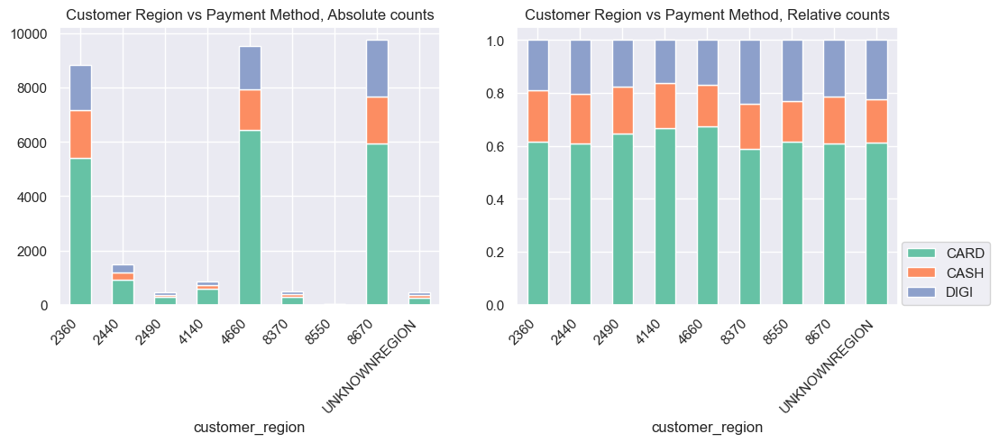

In [205]:
# Set the category variables
cat1 = 'customer_region'
cat2 = 'payment_method'

# Create a figure with two subplots, side by side
fig, axes = plt.subplots(1, 2, figsize=(12, 4))

# Absolute counts: Group by customer region and payment method, then plot stacked bar chart
catpc_df = df.groupby([cat1, cat2])[cat2].size().unstack()  # Group and count occurrences
catpc_df.plot.bar(stacked=True, ax=axes[0], color= set2_colors)  # Plot absolute counts in stacked bars
axes[0].legend([], frameon=False)  # Remove legend
axes[0].set_title('Customer Region vs Payment Method, Absolute counts')  # Set title

# Rotate x-axis labels and align them to the right
axes[0].tick_params(axis='x', rotation=45)
for label in axes[0].get_xticklabels():
    label.set_ha('right')

# Relative counts: Calculate percentage by dividing by total in each customer region
catpc_df2 = df.groupby([cat1, cat2])[cat2].size() / df.groupby([cat1])[cat2].size()  # Calculate relative frequencies
catpc_df2.unstack().plot.bar(stacked=True, ax=axes[1], color= set2_colors)  # Plot relative counts in stacked bars
axes[1].set_title('Customer Region vs Payment Method, Relative counts')  # Set title
axes[1].legend(loc=(1.01, 0))  # Position legend outside the plot

# Rotate x-axis labels and align them to the right
axes[1].tick_params(axis='x', rotation=45)
for label in axes[1].get_xticklabels():
    label.set_ha('right')

# Show the plot
plt.show()

**Payment Method vs Customer Region Analysis: Absolute and Relative Counts** <br>

**Absolute Count** <br>
The payment method "CARD" is the most frequently used across all regions, with a significant lead over the other two methods. The methods "CASH"  and "DIGI" have lower counts, but are present in all regions. Notably, the regions "UNKNOWNREGION" and "8550" have relatively few transactions compared to the other regions.

**Relative Count** <br>
In all regions, the payment method "CARD" is the most frequent, followed by "DIGI" and then "CASH", with a similar distribution across the regions. The relative preference for the "CARD" method is high and consistent across all regions, indicating a uniform trend among customers in opting for this payment method. This suggests that customers in all regions tend to favor the "CARD" method, regardless of their geographic location.

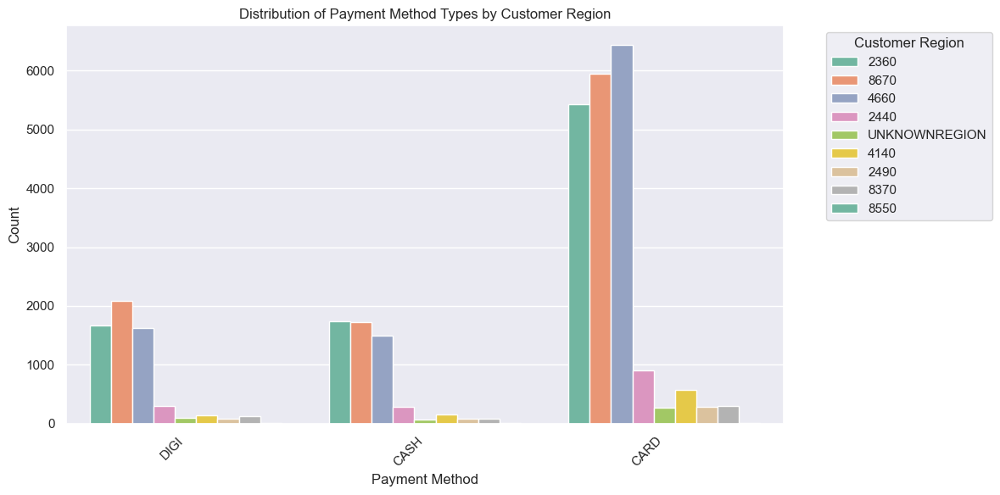

In [206]:
# Set figure size for better readability
plt.figure(figsize=(12, 6))

# Create the countplot with customized hue
sns.countplot(data=df, x='payment_method', hue='customer_region', palette='Set2')

# Adjust legend: place it outside the plot
plt.legend(title='Customer Region', bbox_to_anchor=(1.05, 1), loc='upper left')

# Rotate x-axis labels for clarity
plt.xticks(rotation=45, ha='right')

# Add a title and axis labels
plt.title('Distribution of Payment Method Types by Customer Region')
plt.xlabel('Payment Method')
plt.ylabel('Count')

# Display the plot
plt.tight_layout()  # Adjust layout to prevent clipping
plt.show()

**Key Findings**

1. **Card Dominance (CARD)**:
   - Card is the most used payment method, especially in regions **4660**, **2360**, and **8670**.
   - The popularity of card payments suggests a preference for convenience and security in transactions.

2. **Digital Payments (DIGI)**:
   - While significant, digital payments are less frequent than card payments.
   - Regions **8670** and **2360** lead in the use of digital methods, indicating growing acceptance of digital payment technology.

3. **Low Cash Usage (CASH)**:
   - Cash payments are the least common across all regions, indicating a shift towards digital transactions.
   - The category labeled **UNKNOWNREGION** (representing customers from unspecified locations) has a low frequency of cash payments, as do regions **2490**, **4140**, and **8370**.

4. **Regional Differences**:
   - **2360**, **8670**, and **4660** have high transaction volumes, indicating strong economic activity or a larger customer base.
   - Smaller regions, such as **2440** and the unspecified **UNKNOWNREGION**, show a more diversified distribution of payment methods.



<a class="anchor" id="section_6_4_2">

### 6.4.2 Customer Region vs Last Promo
[Back to 6.4. Categorical Variables-Bivariate Analysis](#section_6_4)<br>

</a>

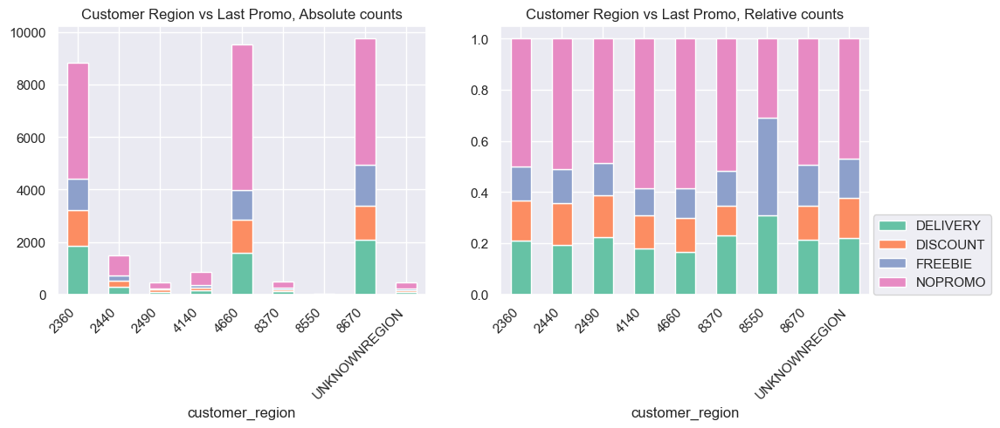

In [207]:
# Set the category variables
cat1 = 'customer_region'
cat2 = 'last_promo'

# Create a figure with two subplots, side by side
fig, axes = plt.subplots(1, 2, figsize=(12, 4))

# Absolute counts: Group by customer region and last promo, then plot stacked bar chart
catpc_df = df.groupby([cat1, cat2])[cat2].size().unstack()  # Group and count occurrences
catpc_df.plot.bar(stacked=True, ax=axes[0], color= set2_colors)  # Plot absolute counts in stacked bars
axes[0].legend([], frameon=False)  # Remove legend for clarity
axes[0].set_title('Customer Region vs Last Promo, Absolute counts')  # Set title

# Rotate x-axis labels and align them to the right
axes[0].tick_params(axis='x', rotation=45)
for label in axes[0].get_xticklabels():
    label.set_ha('right')

# Relative counts: Calculate percentage by dividing by total in each customer region
catpc_df2 = df.groupby([cat1, cat2])[cat2].size() / df.groupby([cat1])[cat2].size()  # Calculate relative frequencies
catpc_df2.unstack().plot.bar(stacked=True, ax=axes[1], color= set2_colors)  # Plot relative counts in stacked bars
axes[1].set_title('Customer Region vs Last Promo, Relative counts')  # Set title
axes[1].legend(loc=(1.01, 0))  # Position legend outside the plot

# Rotate x-axis labels and align them to the right
axes[1].tick_params(axis='x', rotation=45)
for label in axes[1].get_xticklabels():
    label.set_ha('right')

# Show the plot
plt.show()

**Last Promotion vs Customer Region Analysis: Absolute and Relative Counts**


**Absolute Count:**

The majority of transactions fall under the "NOPROMO" category, particularly in regions "2360" and "4660".

**Relative Count:**

All regions have a significant proportion of NOPROMO transactions (highlighted in red), followed by DELIVERY (blue) and FREEBIE (green) transactions. The relative distribution is consistent across regions, indicating that most transactions in each region do not involve promotions, but where promotions do occur, they are distributed similarly.

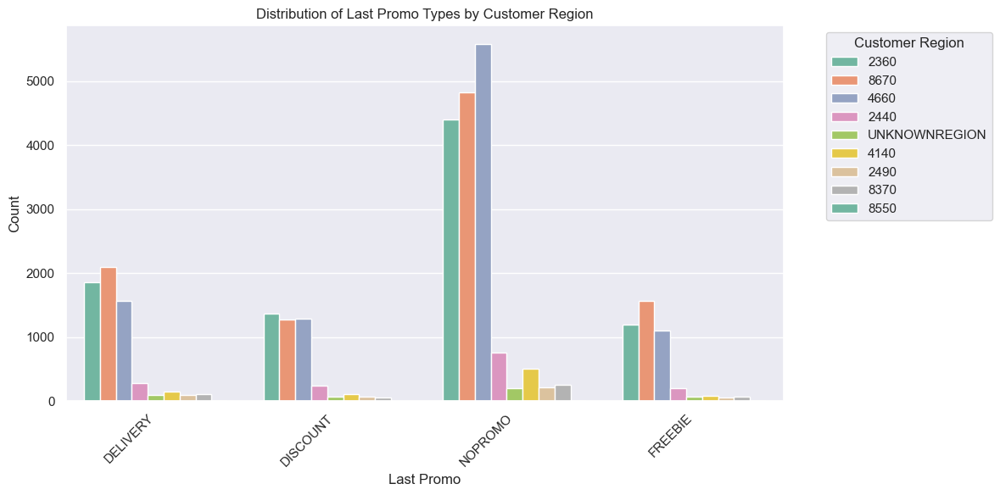

In [208]:
# Set figure size for better readability
plt.figure(figsize=(12, 6))

# Create the countplot with customized hue
sns.countplot(data=df, x='last_promo', hue='customer_region', palette='Set2')

# Adjust legend: place it outside the plot
plt.legend(title='Customer Region', bbox_to_anchor=(1.05, 1), loc='upper left')

# Rotate x-axis labels for clarity
plt.xticks(rotation=45, ha='right')

# Add a title and axis labels
plt.title('Distribution of Last Promo Types by Customer Region')
plt.xlabel('Last Promo')
plt.ylabel('Count')

# Display the plot
plt.tight_layout()  # Adjust layout to prevent clipping
plt.show()

**Key Findings**

1. **High Frequency of No Promotion (NOPROMO)**:
   - The "NOPROMO" category is the most common across all regions, especially in **4660**, **8670**, and **2360**.
   - This suggests that a large portion of customers are not motivated by recent promotional offers or have not been targeted with promotions.

2. **Delivery Promotion (DELIVERY)**:
   - Delivery-based promotions are popular, with high usage in regions **8670**, **2360**, and **4660**.
   - This indicates that customers in these regions may value delivery services as a promotional incentive.

3. **Discount Promotion (DISCOUNT)**:
   - Discount promotions have a moderate presence, particularly in **2360** and **4660**.
   - This could suggest that discounts are an effective promotional type in these regions, although less prevalent than no promotion or delivery offers.

4. **Freebie Promotion (FREEBIE)**:
   - Freebie promotions are less common, but they are notable in regions **2360**, **8670**, and **4660**.
   - The lower frequency of freebies suggests they are used sparingly, perhaps as a selective promotional strategy to attract specific customer segments.

5. **Unspecified Customer Region (UNKNOWNREGION)**:
   - The category labeled **UNKNOWNREGION** shows low counts across all promotion types, similar to regions with smaller customer bases like **2490** and **4140**.
   - This could indicate fewer customers from unspecified locations or less promotional targeting toward these groups.

6. **Regional Differences**:
   - Regions **2360**, **8670**, and **4660** have higher transaction volumes across various promotion types, which may indicate larger or more active customer bases in these areas.
   - In contrast, smaller regions, such as **2440** and **2490**, show a lower and more varied use of promotions, suggesting a different customer demographic or promotional strategy.

<a class="anchor" id="section_6_5">

## 6.5 Numeric Variables vs Categorical Variables
[Back to 6. Visual Exploration](#section_6)<br>
</a>

C:\Users\Rafael\AppData\Local\Temp\ipykernel_47804\2785300703.py:9: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x='customer_region', y='daily_consumption', data=region_consumption, palette='Set2')


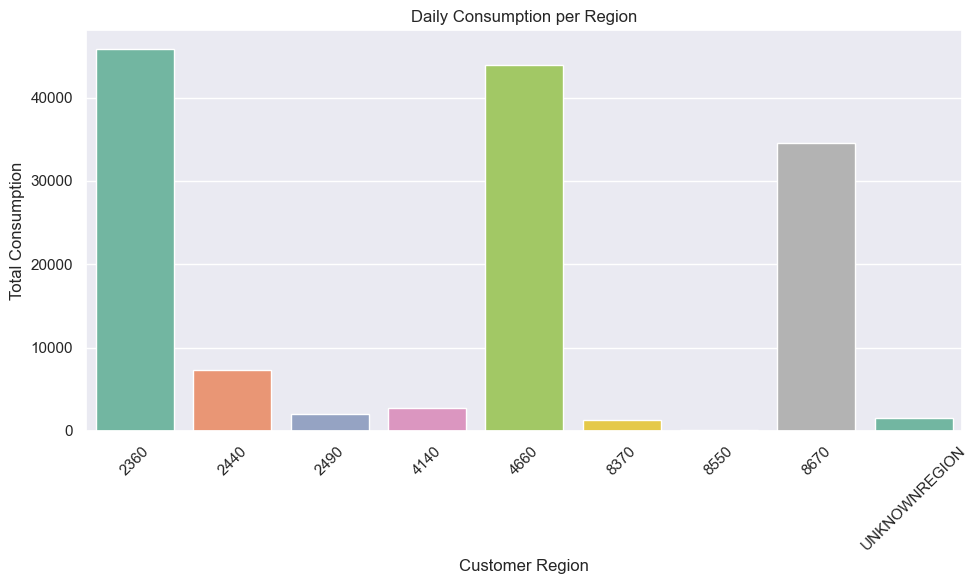

In [209]:
# Create a new column called "daily consumption" to store the daily consumption calculated above.
df['daily_consumption'] = df.loc[:, "HR_0":"HR_23"].sum(axis=1)

# The variable "region_consumption" group all the customers regions with the daily consumption.
region_consumption = df.groupby('customer_region')['daily_consumption'].sum().reset_index()

# Specifications for the bar plot.
plt.figure(figsize=(10, 6))
sns.barplot(x='customer_region', y='daily_consumption', data=region_consumption, palette='Set2')
plt.title('Daily Consumption per Region')
plt.xlabel('Customer Region')
plt.ylabel('Total Consumption')
plt.xticks(rotation=45)
plt.tight_layout()
plt.show()

**Daily consumption per Region**

Through the analysis of the chart, we can conclude two main points:


1. **Regions with highest consumption**:
  - Upon examining the graph, we can identify three main regions with higher daily consumption: **Region 2360, Region 4660, and Region 8670**. These regions are notably distinct from the others. Both Regions **2360** and **4660** have daily consumption values exceeding **40000**, while Region **8670** has a value slightly above **30000**.
  - There is a significant difference between the top-consuming regions ("2360" and "4660") and the lower-consuming ones, indicating regional disparities in consumption patterns.


2. **Other Regions (2440, 2490, 4160, 8370, 8550)**:
   - The remaining regions have very low consumption levels compared to the first ones, all below **10,000**.
   - Several factors could be influencing the low values in these regions:
      1. The company may have operational issues in these areas, resulting in a lower frequency of orders.
      2. These could be areas with fewer customers or a lower average consumption volume per customer.

3. **UNKNOWNREGION**:
   - The region labeled as "UNKNOWNREGION" has a low daily consumption value.
   - This label may represent consumptions that cannot be linked to a specific region due to data errors or customers who are not categorized geographically.

**Conclusion**

The chart indicates that both **Region 2360** and **Region 4660** are crucial markets, exhibiting the highest total consumption levels. **Region 8670**, with its moderate consumption, may be a market that requires further investment from the company. The other regions, which have very low consumption values, may either need to scale back operations or be considered for additional investment if there are opportunities for market expansion, depending on the company's strategic objectives.

C:\Users\Rafael\AppData\Local\Temp\ipykernel_47804\727806464.py:8: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x='last_promo', y='product_count', data=mean_counts, palette='Set2')


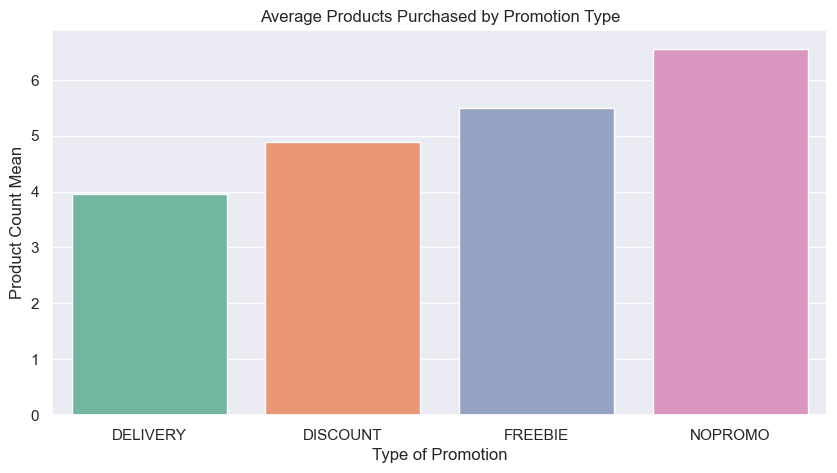

In [210]:
# Group the DataFrame 'df' by the promotion type ('last_promo') and calculate the average number of products purchased ('product_count') for each type.
mean_counts = df.groupby('last_promo')['product_count'].mean().reset_index()

# Plot data.
plt.figure(figsize=(10, 5))  # Defining the size of the figure.

# Specifications for the bar plot.
sns.barplot(x='last_promo', y='product_count', data=mean_counts, palette='Set2')
plt.title('Average Products Purchased by Promotion Type')
plt.xlabel('Type of Promotion')
plt.ylabel('Product Count Mean')
plt.show()



**Average Products Purchased by Promotion Type** <br>

Through the analysis of the bar plot, we can observe that **NOPROMO** stands out significantly in terms of purchase volumes. Several factors may explain this behavior:

__1.__ Consumers may be loyal to a specific product or type of cuisine that is not currently on promotion.

__2.__ The existing promotions might not appeal to these customers; for example, they might only apply to group orders or require purchasing multiple items (like a combo meal).

__3.__ Highly-rated cuisines or popular chains may not offer promotions, leading customers to buy from them at full price.

__4.__ Customers who want to take advantage of promotions like **FREEBIE** may place smaller, more frequent orders rather than larger ones.

This behavior suggests that while promotions attract interest, a considerable segment of customers continues to make regular purchases regardless of discounts, likely driven by product preference, loyalty, or perceived value.

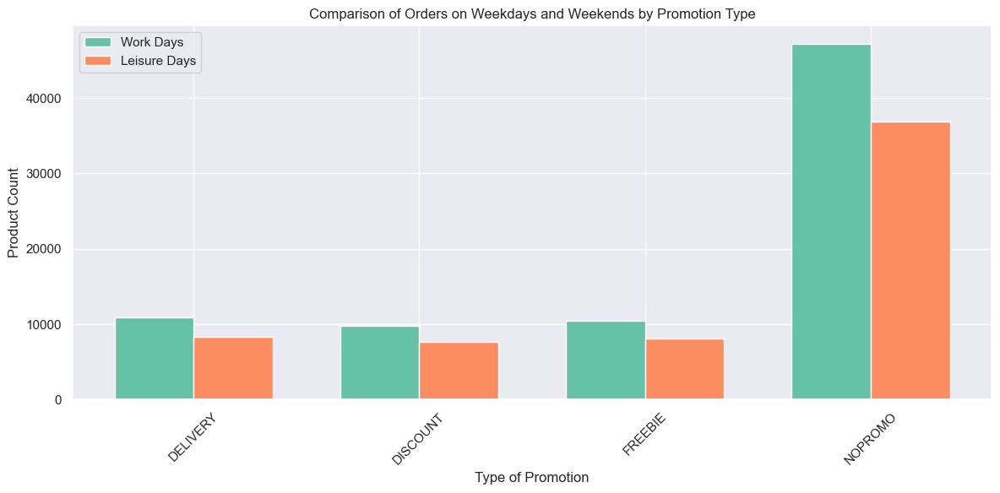

The most used promotion on work days is : NOPROMO
The most used promotion on leisure days is: NOPROMO


In [211]:
# Group by promotion type and sum the orders for weekdays and weekends
df_grouped = df.groupby('last_promo')[['tot_work_days', 'tot_leisure_days']].sum().reset_index()

# Create the comparison bar chart
plt.figure(figsize=(12, 6))

# Set bar width and x-axis positions
bar_width = 0.35                       # Define the width of each bar
r1 = range(len(df_grouped))            # Positions for the first set of bars (work days)
r2 = [x + bar_width for x in r1]       # Offset positions for the second set of bars (leisure days)

# Plot the bars
plt.bar(r1, df_grouped['tot_work_days'], color='#66c2a5', width=bar_width, label='Work Days')
plt.bar(r2, df_grouped['tot_leisure_days'], color='#fc8d62', width=bar_width, label='Leisure Days')

# Add chart details
plt.xlabel("Type of Promotion")       # Label for the x-axis
plt.ylabel("Product Count")           # Label for the y-axis
plt.title("Comparison of Orders on Weekdays and Weekends by Promotion Type")      # Title of the chart
plt.xticks([r + bar_width / 2 for r in range(len(df_grouped))], df_grouped["last_promo"], rotation=45)    # Set x-axis tick labels to the promotion types and rotate them for readability
plt.legend()                          # Display the legend to identify bars for work days and leisure days

# Display the chart
plt.tight_layout()                    # Adjust layout to prevent overlapping of elements
plt.show()                            # Render the chart

# Find the most used promotion for weekdays and weekends
promotion_work_days = df_grouped.loc[df_grouped["tot_work_days"].idxmax(), "last_promo"]
promotion_leisure_days = df_grouped.loc[df_grouped["tot_leisure_days"].idxmax(), "last_promo"]
# The function "idxmax()" finds the index with the maximum value for "tot_work_days" and "tot_leisure_days".
# The function "loc" extracts the promotion type corresponding to the maximum value.

# Print the results
print(f"The most used promotion on work days is : {promotion_work_days}")
print(f"The most used promotion on leisure days is: {promotion_leisure_days}")



**Comparison of Orders on Weekdays and Weekends by Promotion Type** <br>

Based on the chart analysis, we can conclude the following points: <br>

__1.__ **Larger Order Volumes on Weekdays:**
   - Across all promotion categories (DELIVERY, DISCOUNT, FREEBIE, and NOPROMO), orders are generally higher on weekdays compared to weekends. This may indicate that customers are more likely to place orders during the workweek, possibly due to routines related to work, convenience, or weekday schedules.

__2.__ **Relatively Low Impact of Specific Promotions (DELIVERY, DISCOUNT, FREEBIE):**
   - Promotion-specific categories like DELIVERY, DISCOUNT, and FREEBIE show significantly lower order volumes compared to NOPROMO, both on weekdays and weekends. This might suggest that these promotions are less appealing than anticipated, or that customers prefer ordering regardless of promotional offers.

__3.__ **Higher Appeal of Promotions on Weekdays:**
   - The weekday versus weekend difference is consistent across all promotion types but is particularly noticeable for the NOPROMO category. This may indicate that weekdays are generally more favorable for orders, regardless of promotions, and that promotional strategies could be more effective if targeted during weekdays.
   <br>

**Marketing Solutions**

- **Reevaluate Promotions**: Due to low engagement with current promotions, consider reassessing the types of promotions offered or introducing alternative campaigns to enhance weekend appeal.

- **Focus on Weekdays**:To maximize order volume, focus your marketing strategies and promotions on weekdays when customers are more likely to engage with your campaigns. Offering special deals during workdays, such as lunch specials or quick delivery options, can align with customers' weekday routines and encourage more frequent orders.

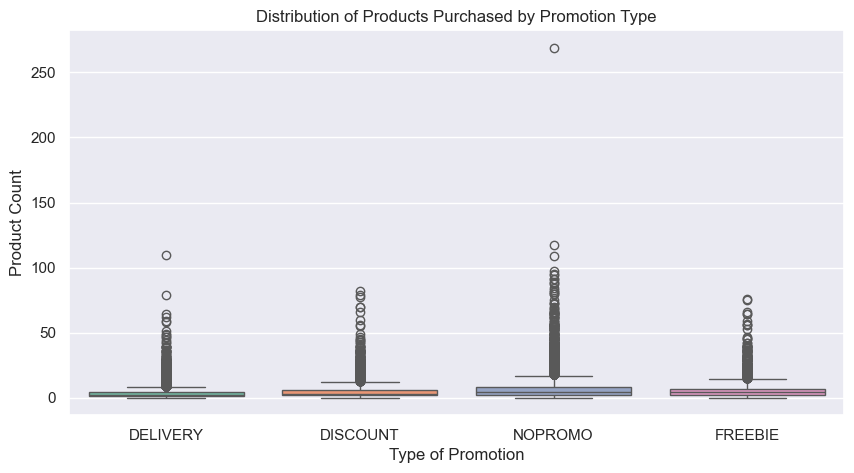

F-Statistic: 242.1103194796198, P-Value: 2.386800213994077e-155


In [212]:
# Specifications for the box plot.
plt.figure(figsize=(10, 5))
sns.boxplot(x='last_promo', y='product_count', data=df, hue='last_promo', palette='Set2', legend=False)
plt.title('Distribution of Products Purchased by Promotion Type')
plt.xlabel('Type of Promotion')
plt.ylabel('Product Count')
plt.show()

#  Perform statistical analysis using ANOVA test.
promo_groups = [df[df['last_promo'] == promo]['product_count'] for promo in df['last_promo'].unique()]
# The variable "promo_groups", contains a separate Series of product_count values for each unique promotion type.
# Each element in promo_groups corresponds to the product counts for a specific promotion.

f_stat, p_value = f_oneway(*promo_groups)
# The f_oneway' function is used to compare the means of product counts across different promotion types.
# The argument '*promo_groups' unpacks the list so that each Series of product counts is passed as a separate argument for the function.
# The function returns the F-statistic and the p-value, which indicates whether there are significant differences among the group means.

print(f"F-Statistic: {f_stat}, P-Value: {p_value}")

**Distribution of Products Purchased by Promotion Type**

Analyzing the box plot, we observe the following: <br>

1. **Outliers:** Individual points outside the whiskers represent outliers. The whiskers usually extend up to 1.5 times the IQR (interquartile range), so points falling beyond this range can be classified as outliers. These outliers appear in all categories, but are particularly prominent in the **NOPROMO** category.
2. **Median:** Since the median represents the central values of the data, it is less influenced by outliers than the mean of the samples. Thus, in all categories, we can verify that it is located in the lower zone of the distributions, indicating that most orders contain a low quantity of products ordered.  

3. **Quantiles:** In all categories, we observe that both Q1 and Q3 show low values, indicating that 75% of the orders consist of a small quantity of products. This conclusion is supported by the median. However, we also notice values that exceed the third quartile, which we can identify as outliers. The presence of these outliers suggests that while large orders are placed occasionally, they represent a minority of the total.
4. **ANOVA Test:** The F statistic we obtained was **242.11**, which measures how different the average quantities of products purchased are between the promotion groups compared to the variation within each group. This result allows us to conclude that there is a significant difference between the means, indicating that the type of promotion affects the number of products purchased. Additionally, the p-value is extremely low, approximately zero, suggesting that it is highly unlikely the differences between the group means are due to random variation.

C:\Users\Rafael\AppData\Local\Temp\ipykernel_47804\1982557791.py:16: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(x='cuisine', y='customer_age', data=boxplot_df, palette= "Set2")


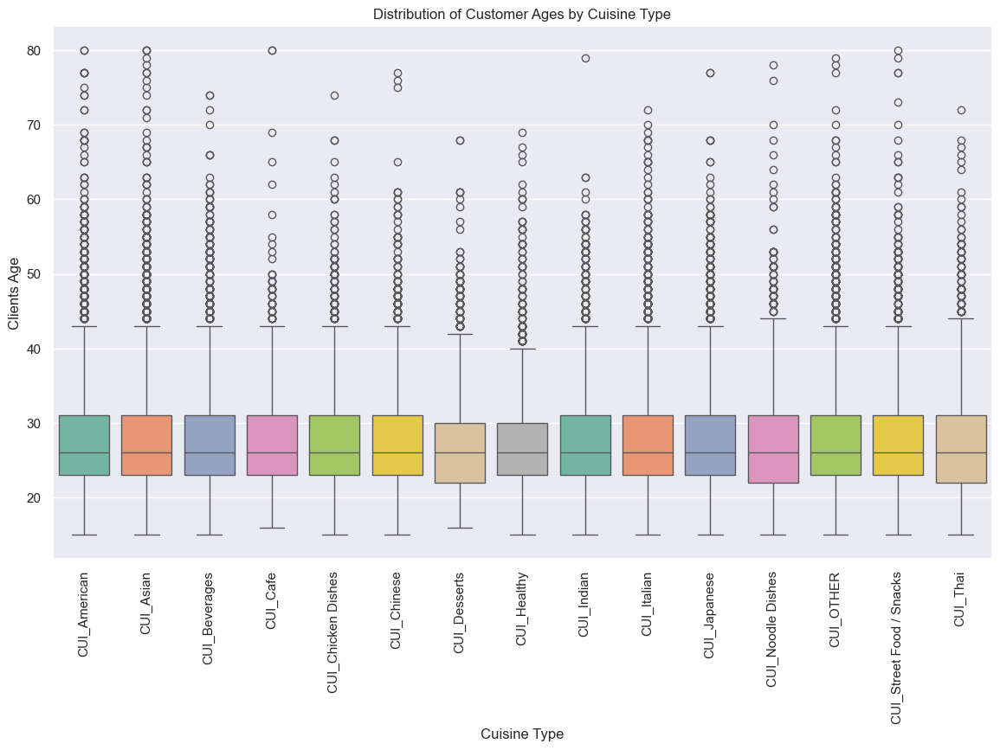

In [213]:
# Create an empty list to store the data for the boxplot
boxplot_data = []

# Iterate over each type of cuisine
for cuisine in cuisine_totals:
    # Filter data where the cuisine was purchased
    age_data = df[df[cuisine] > 0][['customer_age']]
    age_data['cuisine'] = cuisine   # Add the cuisine name as a new column
    boxplot_data.append(age_data)   # Add to the list

# Concatenate all DataFrames into a single DataFrame
boxplot_df = pd.concat(boxplot_data, ignore_index=True)

# Create the boxplot
plt.figure(figsize=(14, 8))
sns.boxplot(x='cuisine', y='customer_age', data=boxplot_df, palette= "Set2")
plt.title('Distribution of Customer Ages by Cuisine Type')
plt.xlabel('Cuisine Type')
plt.ylabel('Clients Age')
plt.xticks(rotation=90)  # Rotate x-axis labels for better visibility
plt.show()

In [214]:
!jupyter nbconvert -- to html projeto.ip

This application is used to convert notebook files (*.ipynb)
        to various other formats.


Options
The options below are convenience aliases to configurable class-options,
as listed in the "Equivalent to" description-line of the aliases.
To see all configurable class-options for some <cmd>, use:
    <cmd> --help-all

--debug
    set log level to logging.DEBUG (maximize logging output)
    Equivalent to: [--Application.log_level=10]
--show-config
    Show the application's configuration (human-readable format)
    Equivalent to: [--Application.show_config=True]
--show-config-json
    Show the application's configuration (json format)
    Equivalent to: [--Application.show_config_json=True]
--generate-config
    generate default config file
    Equivalent to: [--JupyterApp.generate_config=True]
-y
    Answer yes to any questions instead of prompting.
    Equivalent to: [--JupyterApp.answer_yes=True]
--execute
    Execute the notebook prior to export.
    Equivalent to: [--ExecutePr

[NbConvertApp] WARNING | pattern 'to' matched no files
[NbConvertApp] WARNING | pattern 'html' matched no files
[NbConvertApp] WARNING | pattern 'projeto.ip' matched no files


**Distribution of Customer Ages by Cuisine Type**

1. **Median:** In nearly all cuisine categories, the median customer age is between **25 and 35 years**, suggesting most customers are in this age range regardless of cuisine type.

2. **Quantiles:** Most box heights are similar, indicating consistent age distribution across different cuisine categories.
3. **Whiskers:** For all categories, whiskers span from around **18 years** to approximately **50 years**, indicating that the majority of customers fall within this age range across cuisines.
4. **Outliers:** Each cuisine category has various outliers, with some customers exceeding 60 or 70 years of age. While the majority of customers fall between 20 and 40 years old, there is still a smaller, yet significant older demographic that orders from different cuisine types.

C:\Users\Rafael\AppData\Local\Temp\ipykernel_47804\2736736545.py:3: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(x='customer_region', y='vendor_count', data=df, palette= "Set2")


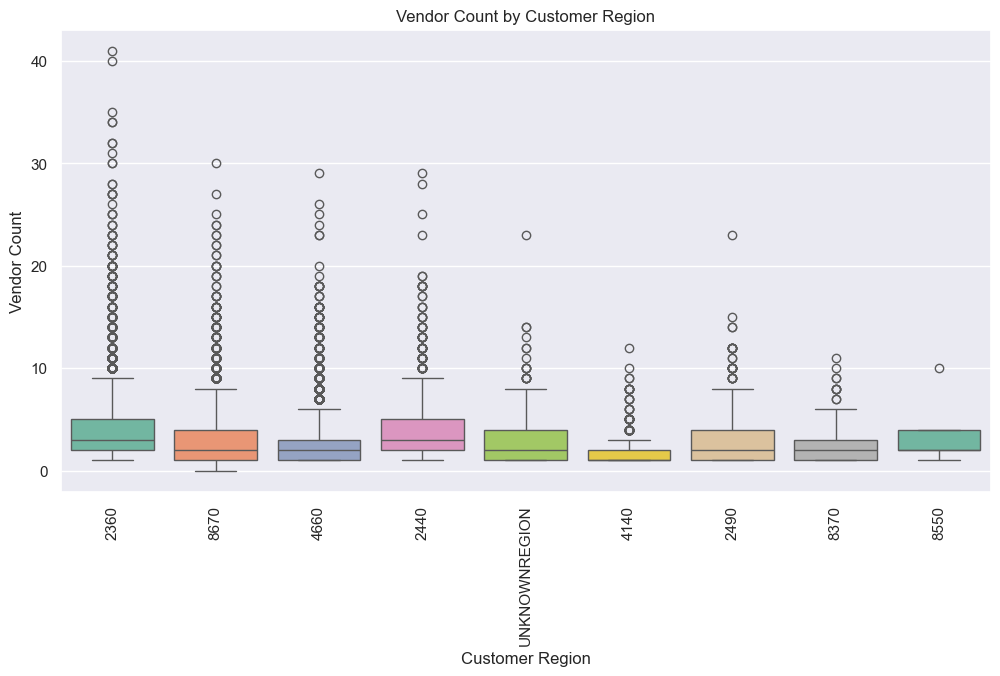

In [215]:
# Box plot to analyze the vendor count across different customer regions
plt.figure(figsize=(12, 6))
sns.boxplot(x='customer_region', y='vendor_count', data=df, palette= "Set2")
plt.title('Vendor Count by Customer Region')
plt.xlabel('Customer Region')
plt.ylabel('Vendor Count')
plt.xticks(rotation=90)
plt.show()

 **Vendor Count by Customer Region**
1. **Median:** In all regions, the central vendor count is around **5**, showing a median of about five vendors per region.
2. **Quantiles:** The distance from Q1 to Q3 is nearly the same across all regions, indicating that there is a relatively consistent distribution of suppliers among the regions.
3. **Whiskers:** In regions **2360 and 8670**, whiskers extend up to around 10 vendors, showing that most customers have access to fewer than **10 vendors**.
4. **Outliers:** Individual points beyond whisker limits appear in all regions. However, regions **2360** and **8670** have more outliers, reaching up to **30 or 40 vendors**, suggesting that some customers in these areas may have access to a significantly higher number of vendors.

<div class="alert alert-block alert-success">
<a class="anchor" id="section_7">

# 7. Preprocessing
[Back to ToC](#toc)<br>

</a>
<div>

<a class="anchor" id="section_7_1">

## 7.1 Processing decisions for `is_chain` Variable (second part)

</a>

In [216]:
# Grouping rare values in the 'is_chain' feature with a threshold of 10 into the category 'Other Chains'
group_rare_values(df, column='is_chain', threshold=10, new_category='Other Chains')

In [217]:
# Verify the new frequency distribution of 'is_chain'
df['is_chain'].value_counts()

is_chain
1               8543
0               6099
2               5892
3               3696
4               2165
5               1380
6                946
7                679
8                500
9                373
10               291
11               248
12               169
13               152
14               138
15                89
Other Chains      87
16                68
18                65
17                55
19                35
20                34
21                29
22                26
24                23
23                20
26                20
27                16
25                14
28                13
29                10
Name: count, dtype: int64

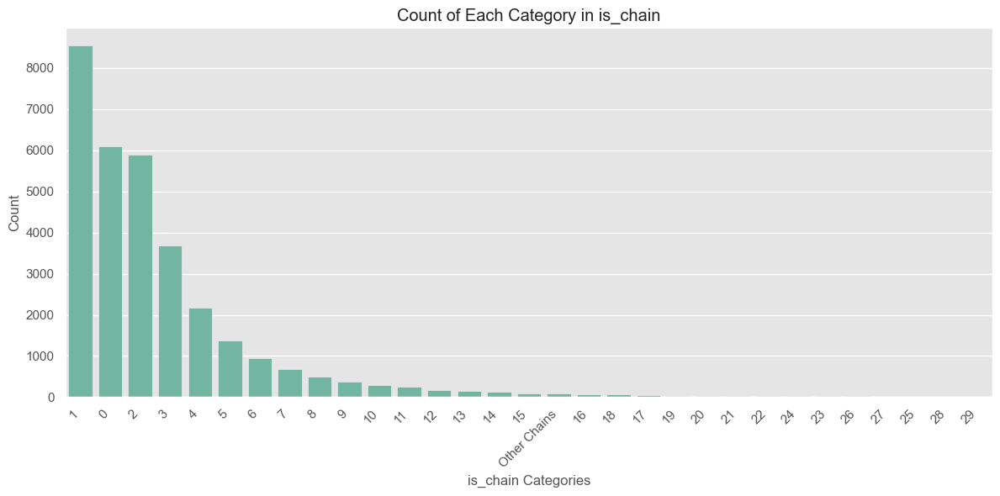

In [218]:
# Plot the distribution of the 'is_chain' feature
plot_category_distribution(
    df, 
    column='is_chain', 
    title='Count of Each Category in is_chain', 
    figsize=(12, 6), 
    rotation=45, 
    color="#66c2a5"
)

To better analyze the `is_chain` variable, categories with fewer than 10 occurrences were grouped under a single category called "Other Chains." This adjustment simplifies the dataset, allowing for a sharper focus on chain preferences while retaining key insights. By spotlighting the most popular chains, the analysis provides actionable insights for targeted strategies.

**Key Observations:**
- **Popularity Concentration:** A small number of chains, specifically `0`, `1`, `2`, and `3`, dominate customer orders. This highlights a clear preference for familiar, well-known options.
- **Streamlined Analysis:** Consolidating rare chains into "Other Chains" reduced the dataset's complexity, making it easier to focus on the major players.
- **Long Tail Dynamics:** The data follows a long-tail distribution, with a few chains capturing the majority of orders while many others have minimal activity. This justifies prioritizing the most popular chains for future marketing efforts.

**Summary:**
This reclassification emphasizes customer loyalty to leading chains and simplifies the analysis without losing important details. By balancing clarity and detail, this approach not only sharpens the focus on high-demand chains but also creates opportunities for refined marketing strategies targeting these top performers.


<a class="anchor" id="section_7_2">

## 7.2 Missing Values Imputation

</a>


[Back to 7. Preprocessing](#section_7)<br>

<a class="anchor" id="section_7_2_1">

### 7.2.1 Numeric Features

</a>

In [219]:
df_original = df.copy()

In [220]:
df_original.columns

Index(['customer_region', 'customer_age', 'vendor_count', 'product_count',
       'is_chain', 'first_order', 'last_order', 'last_promo', 'payment_method',
       'CUI_American', 'CUI_Asian', 'CUI_Beverages', 'CUI_Cafe',
       'CUI_Chicken Dishes', 'CUI_Chinese', 'CUI_Desserts', 'CUI_Healthy',
       'CUI_Indian', 'CUI_Italian', 'CUI_Japanese', 'CUI_Noodle Dishes',
       'CUI_OTHER', 'CUI_Street Food / Snacks', 'CUI_Thai', 'DOW_0', 'DOW_1',
       'DOW_2', 'DOW_3', 'DOW_4', 'DOW_5', 'DOW_6', 'HR_0', 'HR_1', 'HR_2',
       'HR_3', 'HR_4', 'HR_5', 'HR_6', 'HR_7', 'HR_8', 'HR_9', 'HR_10',
       'HR_11', 'HR_12', 'HR_13', 'HR_14', 'HR_15', 'HR_16', 'HR_17', 'HR_18',
       'HR_19', 'HR_20', 'HR_21', 'HR_22', 'HR_23', 'dif_order', 'tot_CUI',
       'tot_work_days', 'tot_leisure_days', 'total_products_by_week',
       'total_products_by_day', 'tot_early_morning', 'tot_breakfast',
       'tot_lunch', 'tot_afternoon', 'tot_dinner', 'tot_late_night',
       'tot_western_cuisines', 'tot_orient

In [221]:
#Define metric and non-metric features.
metric_features = ['customer_age',
 'vendor_count',
 'product_count',
 'first_order',
 'last_order',
 'dif_order',
 'tot_CUI',
 'tot_work_days',
 'tot_leisure_days',
 'total_products_by_week',
 'total_products_by_day',
 'tot_early_morning',
 'tot_breakfast',
 'tot_lunch',
 'tot_afternoon',
 'tot_dinner',
 'tot_late_night',
 'tot_western_cuisines',
 'tot_oriental_cuisines',
 'tot_other_cuisines',
 'purchased_cuisines']
non_metric_features = df.columns.drop(metric_features).to_list()

In [222]:
# Identify columns with NaN values
columns_with_nan = df.columns[df.isna().any()].tolist()

# Print the list of columns
print(columns_with_nan)

['customer_age', 'first_order', 'dif_order']


In [223]:
means = df[columns_with_nan].mean()
means

customer_age    27.507545
first_order     28.469924
dif_order       35.414901
dtype: Float64

In [224]:
medians = df[columns_with_nan].median()
medians

customer_age    26.0
first_order     22.0
dif_order       34.0
dtype: Float64

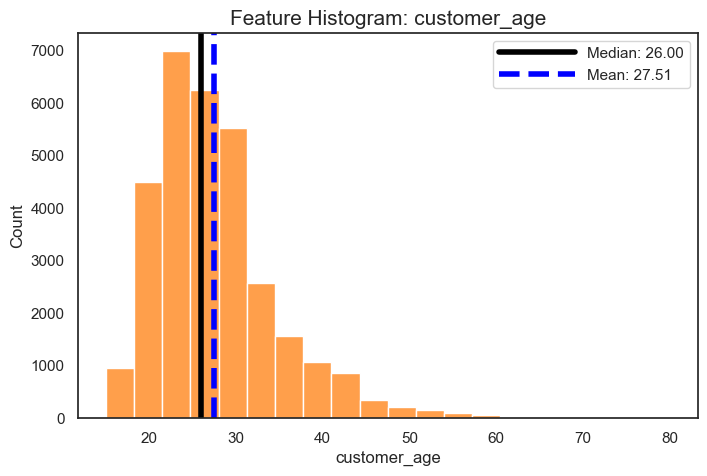

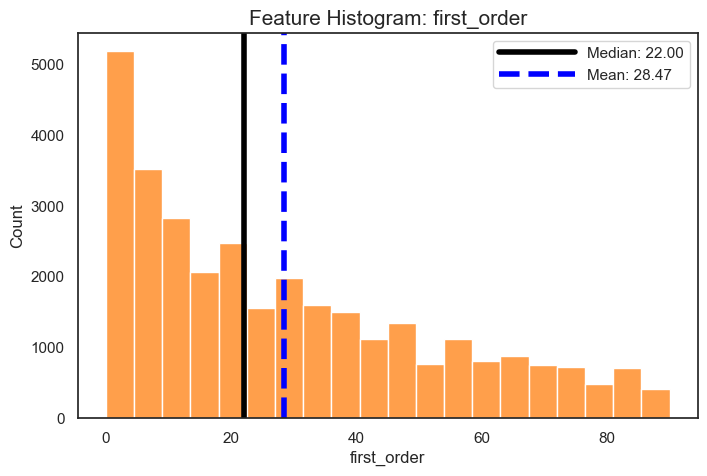

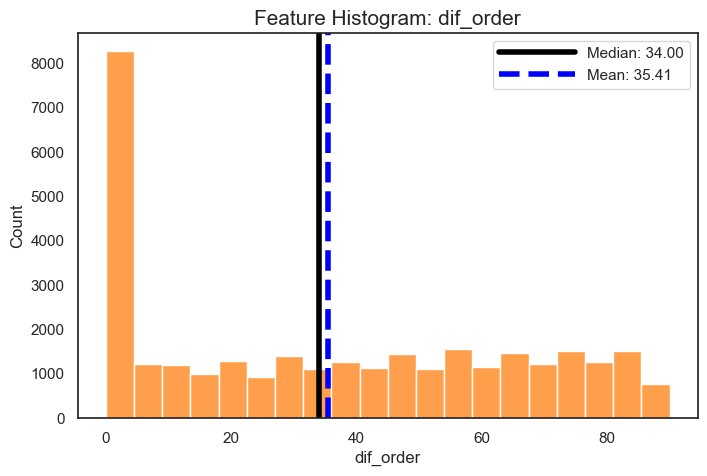

In [225]:
plot_histograms_with_mean_median(df, columns_with_nan, "Feature Histogram")

**Missing Value Imputation Strategy**

To address missing values in the variables (`customer_age`, `first_order`, `dif_order`, `HR_0`), we opted for specific strategies tailored to each variable's distribution and characteristics. Below are the details and justifications for these decisions:

1. **`customer_age`**:
   - The distribution is slightly skewed, with most values concentrated between 20 and 30 years.  
   - While the difference between the mean (27.51) and median (26) is small, the **median** is more robust to outliers (e.g., older customers) and better represents the central tendency of the data.

2. **`first_order`**:
   - This variable is highly skewed, with a large concentration of values in the first 20 days and a gradual spread for higher values.  
   - The mean (28.47) is higher than the median (22) due to the influence of larger values. The **median** is a better measure of central tendency for this distribution and aligns well with the majority of the data.

3. **`dif_order`**:
   - Since the variable dif_order represents the difference in days between the last and the first order, and its missing values correspond to the missing values in the variables from which it is derived, this variable will be recalculated. This approach justifies the imputation of NaN values, as we can derive the correct values by recalculating dif_order using the available data.

In [226]:
fill_missing_values(df, column_name='customer_age', method='median')
fill_missing_values(df, column_name='first_order', method='median')

In [227]:
df['dif_order'] = (df['last_order'] - df['first_order'])

<a class="anchor" id="section_7_2_2">

### 7.2.2 Categorical Features
</a>

In [228]:
# Replace value "UNKNOWNREGION" with nan.
df['customer_region'] = df['customer_region'].replace(["UNKNOWNREGION"], np.nan)

print(df['customer_region'].mode())

df['customer_region'] = df['customer_region'].fillna(df['customer_region'].mode()[0])

0    8670
Name: customer_region, dtype: object


<a class="anchor" id="section_7_3">

## 7.3 Outlier removal
[Back to 7. Preprocessing](#section_7)<br>

</a>

<a class="anchor" id="section_7_3_1">

### 7.3.1 Using the IQR method


</a>

In [229]:
# Compute the IQR
# Calculate Q1, Q3, IQR

q1 = df[metric_features].quantile(.25)
q3 = df[metric_features].quantile(.75)
iqr = (q3 - q1)

# Compute upper and lower limit 

# lower_limit = Q1 -1.5*IQR
lower_lim = q1 - (1.5 * iqr)

# upper_limit = Q3 + 1.5*IQR
upper_lim = q3 + (1.5 * iqr)

limits_table = create_limits_table(q1, q3, iqr, lower_lim, upper_lim)
limits_table

,Q1 (25%),Q3 (75%),IQR,Lower Limit,Upper Limit
customer_age,23.0,31.0,8.0,11.0,43.0
vendor_count,1.0,4.0,3.0,-3.5,8.5
product_count,2.0,7.0,5.0,-5.5,14.5
first_order,7.0,45.0,38.0,-50.0,102.0
last_order,49.0,83.0,34.0,-2.0,134.0
dif_order,3.0,62.0,59.0,-85.5,150.5
tot_CUI,12.88,44.97,32.09,-35.255,93.105
tot_work_days,1.0,3.0,2.0,-2.0,6.0
tot_leisure_days,1.0,2.0,1.0,-0.5,3.5
total_products_by_week,2.0,5.0,3.0,-2.5,9.5


In [230]:
# def remove_outliers_iqr(df, features):
#     for feature in features:
#         Q1 = df[feature].quantile(0.25)  # First quartile (25%)
#         Q3 = df[feature].quantile(0.75)  # Third quartile (75%)
#         IQR = Q3 - Q1  # Interquartile range

#         # Calculate the boundaries
#         lower_bound = Q1 - 1.5 * IQR
#         upper_bound = Q3 + 1.5 * IQR

#         # Filter values within the boundaries
#         df = df[(df[feature] >= lower_bound) & (df[feature] <= upper_bound)]
#     return df

# # Apply the function to the dataframe
# df_cleaned = remove_outliers_iqr(df, metric_features)

# # Exibe o resultado
# print(f"Percentage of data remaining: {(len(df_cleaned) / len(df)) * 100} %")

The application of the IQR method for outlier removal led to a significant loss of data, as it excluded a substantial proportion of observations. This is particularly concerning because, for many variables, the outliers carry valuable and informative insights. These outliers often represent extreme but meaningful variations in the data that could reflect critical trends, rare phenomena, or important deviations essential for a comprehensive analysis

<a class="anchor" id="section_7_3_2">

### 7.3.2 Manual Removel


</a>

In [231]:
df.columns

Index(['customer_region', 'customer_age', 'vendor_count', 'product_count',
       'is_chain', 'first_order', 'last_order', 'last_promo', 'payment_method',
       'CUI_American', 'CUI_Asian', 'CUI_Beverages', 'CUI_Cafe',
       'CUI_Chicken Dishes', 'CUI_Chinese', 'CUI_Desserts', 'CUI_Healthy',
       'CUI_Indian', 'CUI_Italian', 'CUI_Japanese', 'CUI_Noodle Dishes',
       'CUI_OTHER', 'CUI_Street Food / Snacks', 'CUI_Thai', 'DOW_0', 'DOW_1',
       'DOW_2', 'DOW_3', 'DOW_4', 'DOW_5', 'DOW_6', 'HR_0', 'HR_1', 'HR_2',
       'HR_3', 'HR_4', 'HR_5', 'HR_6', 'HR_7', 'HR_8', 'HR_9', 'HR_10',
       'HR_11', 'HR_12', 'HR_13', 'HR_14', 'HR_15', 'HR_16', 'HR_17', 'HR_18',
       'HR_19', 'HR_20', 'HR_21', 'HR_22', 'HR_23', 'dif_order', 'tot_CUI',
       'tot_work_days', 'tot_leisure_days', 'total_products_by_week',
       'total_products_by_day', 'tot_early_morning', 'tot_breakfast',
       'tot_lunch', 'tot_afternoon', 'tot_dinner', 'tot_late_night',
       'tot_western_cuisines', 'tot_orient

In [232]:
df

,customer_region,customer_age,vendor_count,product_count,is_chain,first_order,last_order,last_promo,payment_method,CUI_American,CUI_Asian,CUI_Beverages,CUI_Cafe,CUI_Chicken Dishes,CUI_Chinese,CUI_Desserts,CUI_Healthy,CUI_Indian,CUI_Italian,CUI_Japanese,CUI_Noodle Dishes,CUI_OTHER,CUI_Street Food / Snacks,CUI_Thai,DOW_0,DOW_1,DOW_2,DOW_3,DOW_4,DOW_5,DOW_6,HR_0,HR_1,HR_2,HR_3,HR_4,HR_5,HR_6,HR_7,HR_8,HR_9,HR_10,HR_11,HR_12,HR_13,HR_14,HR_15,HR_16,HR_17,HR_18,HR_19,HR_20,HR_21,HR_22,HR_23,dif_order,tot_CUI,tot_work_days,tot_leisure_days,total_products_by_week,total_products_by_day,tot_early_morning,tot_breakfast,tot_lunch,tot_afternoon,tot_dinner,tot_late_night,tot_western_cuisines,tot_oriental_cuisines,tot_other_cuisines,purchased_cuisines,daily_consumption
customer_id,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
1b8f824d5e,2360,18,2,5,1,0,1,DELIVERY,DIGI,0.00,0.00,0.00,0.0,0.0,0.0,0.00,0.0,28.88,0.00,0.0,0.0,0.0,0.0,0.0,1,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,2,0,0,0,0,0,1,28.88,0,2,2,2,0,0,0,0,2,0,0.00,28.88,0.00,1,2
5d272b9dcb,8670,17,2,2,2,0,1,DISCOUNT,DIGI,12.82,6.39,0.00,0.0,0.0,0.0,0.00,0.0,0.00,0.00,0.0,0.0,0.0,0.0,0.0,1,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,1,1,0,0,0,0,0,0,0,0,0,0,0,0,1,19.21,0,2,2,2,0,1,1,0,0,0,12.82,6.39,0.00,2,2
f6d1b2ba63,4660,38,1,2,2,0,1,DISCOUNT,CASH,9.20,0.00,0.00,0.0,0.0,0.0,0.00,0.0,0.00,0.00,0.0,0.0,0.0,0.0,0.0,1,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,1,0,1,0,0,0,0,0,0,0,0,0,0,0,0,1,9.20,0,2,2,2,0,1,1,0,0,0,9.20,0.00,0.00,1,2
180c632ed8,4660,26,2,3,1,0,2,DELIVERY,DIGI,0.00,13.70,0.00,0.0,0.0,0.0,0.00,0.0,17.86,0.00,0.0,0.0,0.0,0.0,0.0,0,1,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,1,0,0,1,0,0,0,0,0,0,0,0,0,2,31.56,1,1,2,2,0,0,2,0,0,0,0.00,31.56,0.00,2,2
4eb37a6705,4660,20,2,5,0,0,2,NOPROMO,DIGI,14.57,40.87,0.00,0.0,0.0,0.0,0.00,0.0,0.00,0.00,0.0,0.0,0.0,0.0,0.0,0,1,0,0,0,0,1,0,0,0,0,0,0,0,0,1,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,2,55.44,1,1,2,2,0,2,0,0,0,0,14.57,40.87,0.00,2,2
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
f4e366c281,8670,30,1,1,1,22,0,FREEBIE,DIGI,0.00,0.00,18.04,0.0,0.0,0.0,0.00,0.0,0.00,0.00,0.0,0.0,0.0,0.0,0.0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,-22,18.04,0,1,1,1,0,0,1,0,0,0,0.00,0.00,18.04,1,1
f6b6709018,8670,26,1,1,0,22,0,DELIVERY,DIGI,18.04,0.00,0.00,0.0,0.0,0.0,0.00,0.0,0.00,0.00,0.0,0.0,0.0,0.0,0.0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,-22,18.04,0,1,1,1,0,0,0,1,0,0,18.04,0.00,0.00,1,1
f74ad8ce3f,8670,24,1,1,1,22,0,NOPROMO,DIGI,0.00,0.00,0.00,0.0,0.0,0.0,17.79,0.0,0.00,0.00,0.0,0.0,0.0,0.0,0.0,0,0,0,0,0,0,1,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,-22,17.79,0,1,1,1,1,0,0,0,0,0,0.00,0.00,17.79,1,1


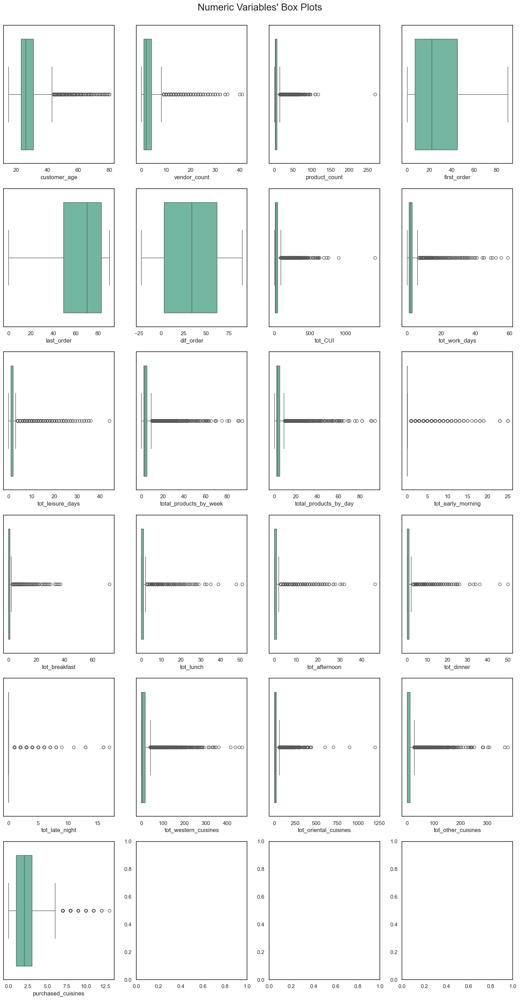

In [233]:
plot_boxplots(df[new_metric_features],"Numeric Variables' Box Plots")

In [234]:
filters_man = (
    (df['vendor_count']<=30)
    &
    (df['product_count']<=100)
    &
    (df['tot_CUI']<=500)
    &
    (df['tot_work_days']<=30)
     &
    (df['tot_leisure_days']<=30)
     &
    (df['total_products_by_week']<=50)
     &
    (df['total_products_by_day']<=50)
     &
    (df['tot_early_morning']<=20)
    &
    (df['tot_breakfast']<=25)
    &
    (df['tot_lunch']<=20)
    &
    (df['tot_afternoon']<=20)
    &
    (df['tot_dinner']<=20)
    &
    (df['tot_late_night']<=8)
    &
    (df['tot_western_cuisines']<=250)
    &
    (df['tot_oriental_cuisines']<=300)
    &
    (df['tot_other_cuisines']<=150)
    &
    (df['purchased_cuisines']<=6)
    
)

df_man = df[filters_man]

In [235]:
print('Percentage of data kept after removing outliers:', 100*np.round(df_man.shape[0] / df_original.shape[0], 4))

Percentage of data kept after removing outliers: 97.61


In [236]:
print(f"Original data: {df.shape[0]} rows")
print(f"Data after removing values above the 90th percentile: {df_man.shape[0]} rows")

Original data: 31875 rows
Data after removing values above the 90th percentile: 31113 rows


In [237]:
df[new_metric_features].describe()

,customer_age,vendor_count,product_count,first_order,last_order,dif_order,tot_work_days,tot_leisure_days,total_products_by_week,total_products_by_day,tot_early_morning,tot_breakfast,tot_lunch,tot_afternoon,tot_dinner,tot_late_night,tot_western_cuisines,tot_oriental_cuisines,tot_other_cuisines,purchased_cuisines,tot_CUI
count,31875.0,31875.000000,31875.000000,31875.0,31875.000000,31875.0,31875.000000,31875.000000,31875.000000,31875.0,31875.0,31875.000000,31875.000000,31875.000000,31875.000000,31875.000000,31875.000000,31875.000000,31875.000000,31875.000000,31875.000000
mean,27.473161,3.102714,5.668424,28.448408,63.672376,35.223969,2.455749,1.913286,4.369035,4.320345,0.418918,0.841757,1.144627,1.024753,0.796831,0.093459,12.823815,17.568962,7.903080,2.275263,38.295857
std,7.083258,2.771753,6.957933,24.067394,23.227992,29.552161,3.192346,2.443901,5.084780,5.049923,1.15975,1.822053,2.036109,1.904752,1.792844,0.462586,24.209546,29.900524,16.172452,1.484889,46.410657
min,15.0,0.000000,0.000000,0.0,0.000000,-22.0,0.000000,0.000000,0.000000,0.0,0.0,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
25%,23.0,1.000000,2.000000,7.0,49.000000,3.0,1.000000,1.000000,2.000000,2.0,0.0,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,1.000000,12.880000
50%,26.0,2.000000,3.000000,22.0,70.000000,34.0,2.000000,1.000000,3.000000,3.0,0.0,0.000000,1.000000,0.000000,0.000000,0.000000,3.510000,8.110000,0.000000,2.000000,24.140000
75%,31.0,4.000000,7.000000,45.0,83.000000,62.0,3.000000,2.000000,5.000000,5.0,0.0,1.000000,1.000000,1.000000,1.000000,0.000000,16.360000,23.290000,10.570000,3.000000,44.970000
max,80.0,41.000000,269.000000,90.0,90.000000,90.0,59.000000,44.000000,94.000000,94.0,25.0,72.000000,51.000000,46.000000,50.000000,17.000000,468.330000,1201.270000,377.320000,13.000000,1418.330000


In [238]:
df_man[new_metric_features].describe()

,customer_age,vendor_count,product_count,first_order,last_order,dif_order,tot_work_days,tot_leisure_days,total_products_by_week,total_products_by_day,tot_early_morning,tot_breakfast,tot_lunch,tot_afternoon,tot_dinner,tot_late_night,tot_western_cuisines,tot_oriental_cuisines,tot_other_cuisines,purchased_cuisines,tot_CUI
count,31113.0,31113.000000,31113.000000,31113.0,31113.000000,31113.0,31113.000000,31113.000000,31113.000000,31113.0,31113.0,31113.000000,31113.000000,31113.000000,31113.000000,31113.000000,31113.000000,31113.000000,31113.000000,31113.000000,31113.000000
mean,27.470704,2.864623,5.075756,28.986404,63.196767,34.210362,2.203195,1.731366,3.934561,3.889371,0.410761,0.762897,1.011731,0.932151,0.690483,0.081349,12.213314,16.433745,7.026864,2.152059,35.673923
std,7.077255,2.191068,5.075036,24.066485,23.271170,29.116509,2.465808,1.954769,3.778112,3.750337,1.099809,1.490282,1.608715,1.628089,1.426764,0.384228,21.814527,25.600506,13.247921,1.246796,38.638122
min,15.0,0.000000,0.000000,0.0,0.000000,-22.0,0.000000,0.000000,0.000000,0.0,0.0,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
25%,23.0,1.000000,2.000000,8.0,49.000000,2.0,1.000000,0.000000,2.000000,2.0,0.0,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,1.000000,12.660000
50%,26.0,2.000000,3.000000,23.0,70.000000,32.0,1.000000,1.000000,3.000000,3.0,0.0,0.000000,0.000000,0.000000,0.000000,0.000000,3.160000,7.590000,0.000000,2.000000,23.790000
75%,31.0,4.000000,6.000000,46.0,83.000000,60.0,3.000000,2.000000,5.000000,5.0,0.0,1.000000,1.000000,1.000000,1.000000,0.000000,15.810000,21.730000,9.600000,3.000000,43.150000
max,80.0,24.000000,63.000000,90.0,90.000000,90.0,26.000000,29.000000,44.000000,44.0,19.0,25.000000,19.000000,20.000000,20.000000,8.000000,246.720000,299.370000,149.940000,6.000000,474.100000


In [239]:
df= df_man.copy()

<a class="anchor" id="section_7_4">

## 7.4 Data Normalization
[Back to 7. Preprocessing](#section_7)<br>

</a>

In [240]:
from sklearn.preprocessing import MinMaxScaler, StandardScaler, OneHotEncoder

In [241]:
df_standard = df.copy()

ss_scaler = StandardScaler()
ss_scaled_feat = ss_scaler.fit_transform(df_standard[metric_features])


df_standard[metric_features] = ss_scaled_feat
df_standard.head()

,customer_region,customer_age,vendor_count,product_count,is_chain,first_order,last_order,last_promo,payment_method,CUI_American,CUI_Asian,CUI_Beverages,CUI_Cafe,CUI_Chicken Dishes,CUI_Chinese,CUI_Desserts,CUI_Healthy,CUI_Indian,CUI_Italian,CUI_Japanese,CUI_Noodle Dishes,CUI_OTHER,CUI_Street Food / Snacks,CUI_Thai,DOW_0,DOW_1,DOW_2,DOW_3,DOW_4,DOW_5,DOW_6,HR_0,HR_1,HR_2,HR_3,HR_4,HR_5,HR_6,HR_7,HR_8,HR_9,HR_10,HR_11,HR_12,HR_13,HR_14,HR_15,HR_16,HR_17,HR_18,HR_19,HR_20,HR_21,HR_22,HR_23,dif_order,tot_CUI,tot_work_days,tot_leisure_days,total_products_by_week,total_products_by_day,tot_early_morning,tot_breakfast,tot_lunch,tot_afternoon,tot_dinner,tot_late_night,tot_western_cuisines,tot_oriental_cuisines,tot_other_cuisines,purchased_cuisines,daily_consumption
customer_id,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
1b8f824d5e,2360,-1.338210,-0.394619,-0.014927,1,-1.20445,-2.672739,DELIVERY,DIGI,0.00,0.00,0.0,0.0,0.0,0.0,0.0,0.0,28.88,0.0,0.0,0.0,0.0,0.0,0.0,1,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,2,0,0,0,0,0,-1.140621,-0.175838,-0.893513,0.137427,-0.512053,-0.503795,-0.37349,-0.511922,-0.628917,-0.572552,0.917838,-0.211723,-0.559880,0.486180,-0.530421,-0.924030,2
5d272b9dcb,8670,-1.479510,-0.394619,-0.606066,2,-1.20445,-2.672739,DISCOUNT,DIGI,12.82,6.39,0.0,0.0,0.0,0.0,0.0,0.0,0.00,0.0,0.0,0.0,0.0,0.0,0.0,1,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,1,1,0,0,0,0,0,0,0,0,0,0,0,0,-1.140621,-0.426113,-0.893513,0.137427,-0.512053,-0.503795,-0.37349,0.159102,-0.007293,-0.572552,-0.483958,-0.211723,0.027812,-0.392332,-0.530421,-0.121961,2
f6d1b2ba63,4660,1.487789,-0.851025,-0.606066,2,-1.20445,-2.672739,DISCOUNT,CASH,9.20,0.00,0.0,0.0,0.0,0.0,0.0,0.0,0.00,0.0,0.0,0.0,0.0,0.0,0.0,1,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,1,0,1,0,0,0,0,0,0,0,0,0,0,0,0,-1.140621,-0.685187,-0.893513,0.137427,-0.512053,-0.503795,-0.37349,0.159102,-0.007293,-0.572552,-0.483958,-0.211723,-0.138136,-0.641941,-0.530421,-0.924030,2
180c632ed8,4660,-0.207810,-0.394619,-0.409020,1,-1.20445,-2.629767,DELIVERY,DIGI,0.00,13.70,0.0,0.0,0.0,0.0,0.0,0.0,17.86,0.0,0.0,0.0,0.0,0.0,0.0,0,1,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,1,0,0,1,0,0,0,0,0,0,0,0,0,-1.106275,-0.106475,-0.487959,-0.374151,-0.512053,-0.503795,-0.37349,-0.511922,0.614332,-0.572552,-0.483958,-0.211723,-0.559880,0.590867,-0.530421,-0.121961,2
4eb37a6705,4660,-1.055610,-0.394619,-0.014927,0,-1.20445,-2.629767,NOPROMO,DIGI,14.57,40.87,0.0,0.0,0.0,0.0,0.0,0.0,0.00,0.0,0.0,0.0,0.0,0.0,0.0,0,1,0,0,0,0,1,0,0,0,0,0,0,0,0,1,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,-1.106275,0.511578,-0.487959,-0.374151,-0.512053,-0.503795,-0.37349,0.830127,-0.628917,-0.572552,-0.483958,-0.211723,0.108035,0.954538,-0.530421,-0.121961,2


In [242]:
df_minmax = df.copy()

mm_scaler = MinMaxScaler()
mm_scaled_feat = mm_scaler.fit_transform(df_minmax[metric_features])

df_minmax[metric_features] = mm_scaled_feat

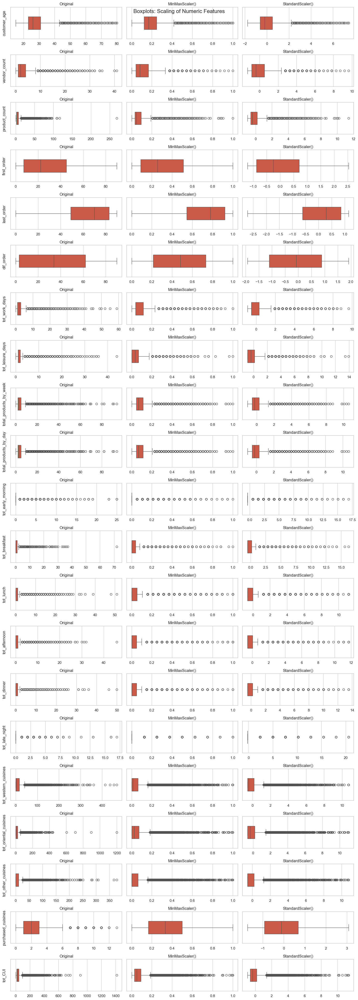

In [243]:
sns.set_style('whitegrid')

# Create subplots
fig, axes = plt.subplots(len(new_metric_features), 3, figsize=(15, len(new_metric_features) * 2), 
                         tight_layout=True, sharex=False, sharey=False)

# Iterate over numeric features
for i, feature in enumerate(new_metric_features):
    sns.boxplot(data=df_original, x=feature, ax=axes[i][0], width=.4)
    axes[i][0].set_title('Original')
    axes[i][0].set_ylabel(feature)

    sns.boxplot(data=df_minmax, x=feature, ax=axes[i][1], width=.4)
    axes[i][1].set_title('MinMaxScaler()')

    sns.boxplot(data=df_standard, x=feature, ax=axes[i][2], width=.4)
    axes[i][2].set_title('StandardScaler()')

    # Optionally, remove x-axis labels for a cleaner look
    axes[i][0].set_xlabel(None)
    axes[i][1].set_xlabel(None)
    axes[i][2].set_xlabel(None)

# Add a main title
fig.suptitle('Boxplots: Scaling of Numeric Features', fontsize=16)
plt.show()

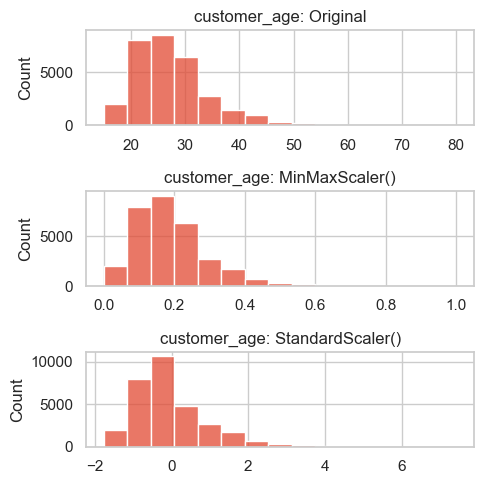

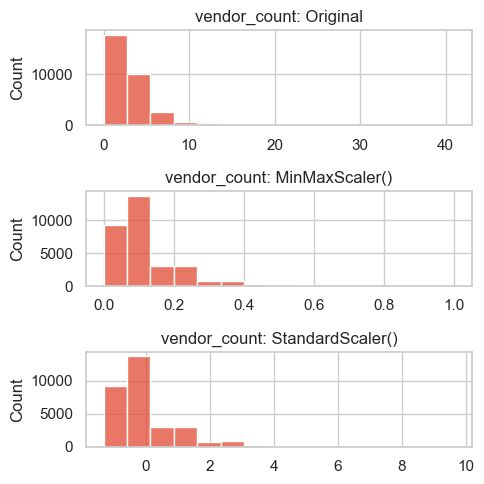

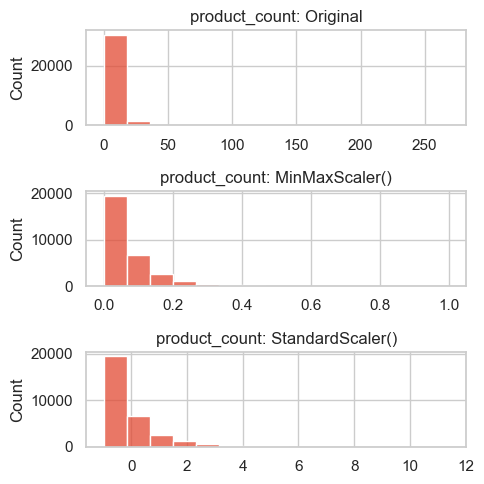

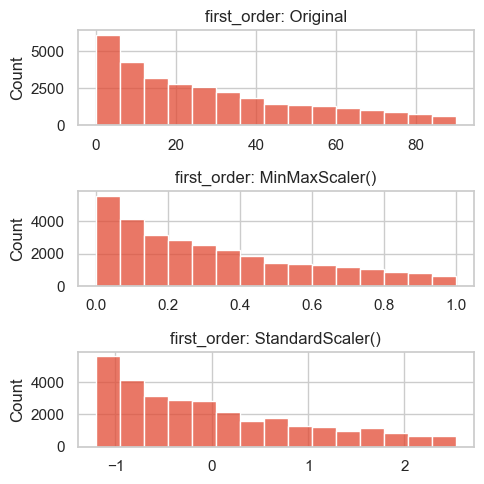

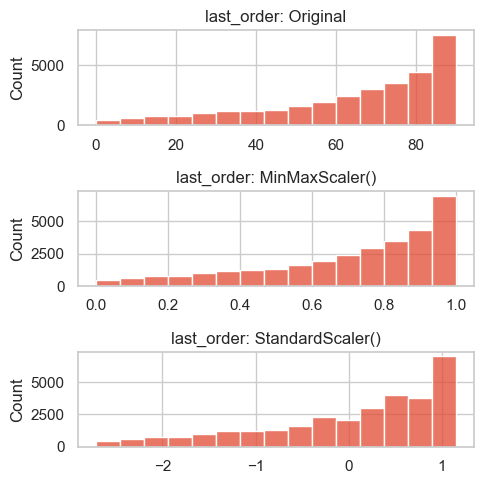

...

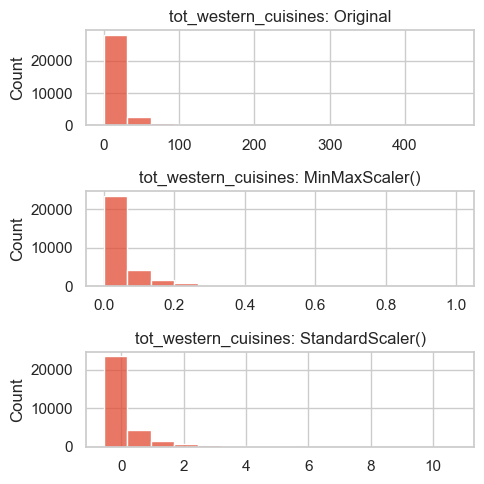

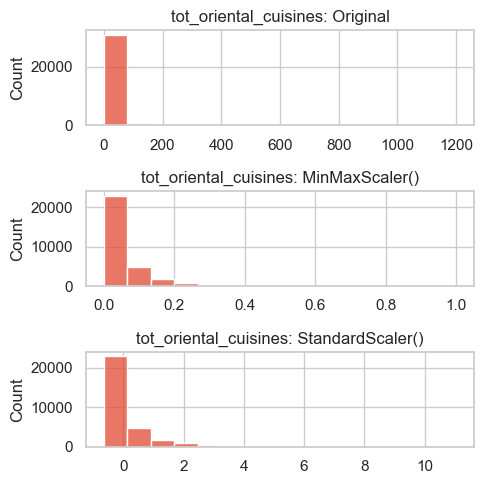

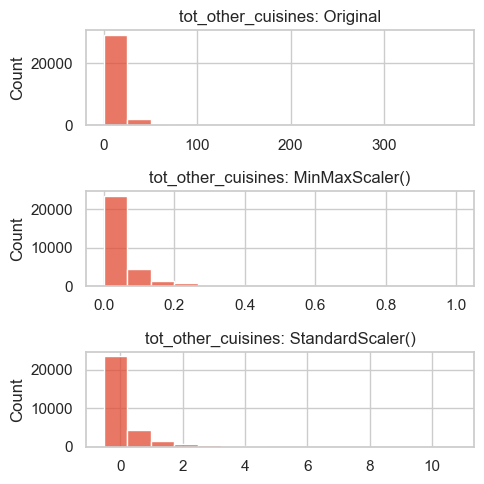

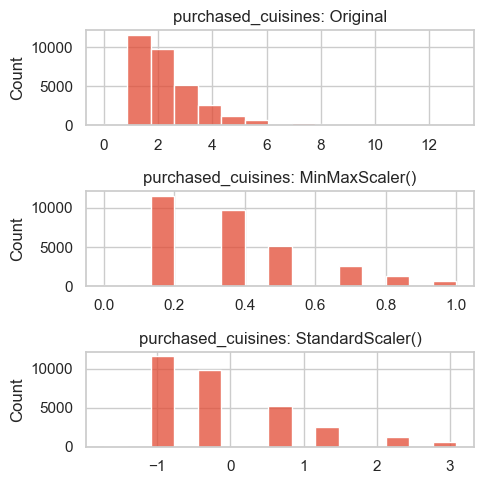

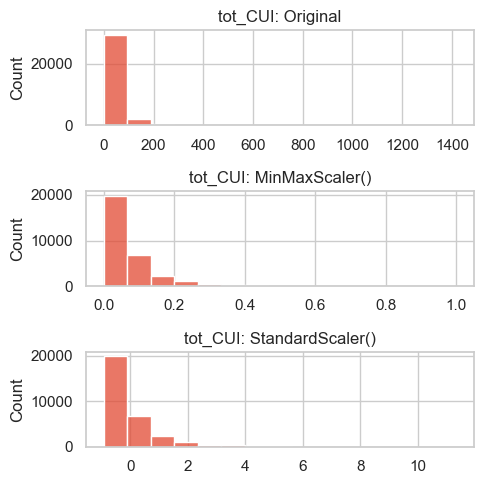

In [244]:
# Iterate over numeric features
for feature in new_metric_features:
    # Create subplots with 3 rows, 1 column for each feature
    fig, axes = plt.subplots(3, 1, figsize=(5, 5), tight_layout=True)

    # Common histogram arguments
    hp_args = dict(x=feature, bins=15)

    # Original Data
    sns.histplot(df_original, ax=axes[0], **hp_args)
    axes[0].set_title(f'{feature}: Original')
    axes[0].set_xlabel(None)

    # MinMaxScaler Data
    sns.histplot(df_minmax, ax=axes[1], **hp_args)
    axes[1].set_title(f'{feature}: MinMaxScaler()')
    axes[1].set_xlabel(None)

    # StandardScaler Data
    sns.histplot(df_standard, ax=axes[2], **hp_args)
    axes[2].set_title(f'{feature}: StandardScaler()')
    axes[2].set_xlabel(None)

    # Display the histograms for the current feature
    plt.show()

In [245]:
df = df_standard.copy()

<a class="anchor" id="section_7_5">

## 7.5 Encoding
[Back to 7. Preprocessing](#section_7)<br>

</a>

In [246]:
non_metric_features= ['customer_region',
 'is_chain',
 'last_promo',
 'payment_method']

In [247]:
# Use OneHotEncoder to encode the categorical features. Get feature names and create a DataFrame 
# with the one-hot encoded categorical features (pass feature names)
df[non_metric_features] = df[non_metric_features].astype(str)
ohc = OneHotEncoder(sparse_output=False, drop="first")
ohc_feat = ohc.fit_transform(df[non_metric_features])
ohc_feat_names = ohc.get_feature_names_out()

In [248]:
ohc_feat = ohc.fit_transform(df[non_metric_features])
ohc_feat_names = ohc.get_feature_names_out()

In [249]:
ohc_df = pd.DataFrame(ohc_feat, index=df.index, columns=ohc_feat_names)  
ohc_df

,customer_region_2440,customer_region_2490,customer_region_4140,customer_region_4660,customer_region_8370,customer_region_8550,customer_region_8670,is_chain_1,is_chain_10,is_chain_11,is_chain_12,is_chain_13,is_chain_14,is_chain_15,is_chain_16,is_chain_17,is_chain_18,is_chain_19,is_chain_2,is_chain_20,is_chain_21,is_chain_22,is_chain_23,is_chain_24,is_chain_25,is_chain_26,is_chain_27,is_chain_28,is_chain_29,is_chain_3,is_chain_4,is_chain_5,is_chain_6,is_chain_7,is_chain_8,is_chain_9,is_chain_Other Chains,last_promo_DISCOUNT,last_promo_FREEBIE,last_promo_NOPROMO,payment_method_CASH,payment_method_DIGI
customer_id,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
1b8f824d5e,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0
5d272b9dcb,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,1.0
f6d1b2ba63,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,1.0,0.0
180c632ed8,0.0,0.0,0.0,1.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0
4eb37a6705,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,1.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
f4e366c281,0.0,0.0,0.0,0.0,0.0,0.0,1.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,1.0
f6b6709018,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0
f74ad8ce3f,0.0,0.0,0.0,0.0,0.0,0.0,1.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,1.0


In [250]:
df= pd.concat([df, ohc_df], axis=1)
df.head()

,customer_region,customer_age,vendor_count,product_count,is_chain,first_order,last_order,last_promo,payment_method,CUI_American,CUI_Asian,CUI_Beverages,CUI_Cafe,CUI_Chicken Dishes,CUI_Chinese,CUI_Desserts,CUI_Healthy,CUI_Indian,CUI_Italian,CUI_Japanese,CUI_Noodle Dishes,CUI_OTHER,CUI_Street Food / Snacks,CUI_Thai,DOW_0,DOW_1,DOW_2,DOW_3,DOW_4,DOW_5,DOW_6,HR_0,HR_1,HR_2,HR_3,HR_4,HR_5,HR_6,HR_7,HR_8,HR_9,HR_10,HR_11,HR_12,HR_13,HR_14,HR_15,HR_16,HR_17,HR_18,HR_19,HR_20,HR_21,HR_22,HR_23,dif_order,tot_CUI,tot_work_days,tot_leisure_days,total_products_by_week,total_products_by_day,tot_early_morning,tot_breakfast,tot_lunch,tot_afternoon,tot_dinner,tot_late_night,tot_western_cuisines,tot_oriental_cuisines,tot_other_cuisines,purchased_cuisines,daily_consumption,customer_region_2440,customer_region_2490,customer_region_4140,customer_region_4660,customer_region_8370,customer_region_8550,customer_region_8670,is_chain_1,is_chain_10,is_chain_11,is_chain_12,is_chain_13,is_chain_14,is_chain_15,is_chain_16,is_chain_17,is_chain_18,is_chain_19,is_chain_2,is_chain_20,is_chain_21,is_chain_22,is_chain_23,is_chain_24,is_chain_25,is_chain_26,is_chain_27,is_chain_28,is_chain_29,is_chain_3,is_chain_4,is_chain_5,is_chain_6,is_chain_7,is_chain_8,is_chain_9,is_chain_Other Chains,last_promo_DISCOUNT,last_promo_FREEBIE,last_promo_NOPROMO,payment_method_CASH,payment_method_DIGI
customer_id,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
1b8f824d5e,2360,-1.338210,-0.394619,-0.014927,1,-1.20445,-2.672739,DELIVERY,DIGI,0.00,0.00,0.0,0.0,0.0,0.0,0.0,0.0,28.88,0.0,0.0,0.0,0.0,0.0,0.0,1,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,2,0,0,0,0,0,-1.140621,-0.175838,-0.893513,0.137427,-0.512053,-0.503795,-0.37349,-0.511922,-0.628917,-0.572552,0.917838,-0.211723,-0.559880,0.486180,-0.530421,-0.924030,2,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0
5d272b9dcb,8670,-1.479510,-0.394619,-0.606066,2,-1.20445,-2.672739,DISCOUNT,DIGI,12.82,6.39,0.0,0.0,0.0,0.0,0.0,0.0,0.00,0.0,0.0,0.0,0.0,0.0,0.0,1,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,1,1,0,0,0,0,0,0,0,0,0,0,0,0,-1.140621,-0.426113,-0.893513,0.137427,-0.512053,-0.503795,-0.37349,0.159102,-0.007293,-0.572552,-0.483958,-0.211723,0.027812,-0.392332,-0.530421,-0.121961,2,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,1.0
f6d1b2ba63,4660,1.487789,-0.851025,-0.606066,2,-1.20445,-2.672739,DISCOUNT,CASH,9.20,0.00,0.0,0.0,0.0,0.0,0.0,0.0,0.00,0.0,0.0,0.0,0.0,0.0,0.0,1,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,1,0,1,0,0,0,0,0,0,0,0,0,0,0,0,-1.140621,-0.685187,-0.893513,0.137427,-0.512053,-0.503795,-0.37349,0.159102,-0.007293,-0.572552,-0.483958,-0.211723,-0.138136,-0.641941,-0.530421,-0.924030,2,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,1.0,0.0
180c632ed8,4660,-0.207810,-0.394619,-0.409020,1,-1.20445,-2.629767,DELIVERY,DIGI,0.00,13.70,0.0,0.0,0.0,0.0,0.0,0.0,17.86,0.0,0.0,0.0,0.0,0.0,0.0,0,1,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,1,0,0,1,0,0,0,0,0,0,0,0,0,-1.106275,-0.106475,-0.487959,-0.374151,-0.512053,-0.503795,-0.37349,-0.511922,0.614332,-0.572552,-0.483958,-0.211723,-0.559880,0.590867,-0.530421,-0.121961,2,0.0,0.0,0.0,1.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0
4eb37a6705,4660,-1.055610,-0.394619,-0.014927,0,-1.20445,-2.629767,NOPROMO,DIGI,14.57,40.87,0.0,0.0,0.0,0.0,0.0,0.0,0.00,0.0,0.0,0.0,0.0,0.0,0.0,0,1,0,0,0,0,1,0,0,0,0,0,0,0,0,1,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,-1.106275,0.511578,-0.487959,-0.374151,-0.512053,-0.503795,-0.37349,0.830127,-0.628917,-0.572552,-0.483958,-0.211723,0.108035,0.954538,-0.530421,-0.121961,2,0.0,0

In [251]:
df.drop(non_metric_features, axis=1, inplace=True)

<a class="anchor" id="section_7_6">

## 7.6 Variable selection: Redundancy
[Back to 7. Preprocessing](#section_7)<br>

</a>

<a class="anchor" id="section_7_6_1">

### 7.6.1 Numeric Variables


</a>

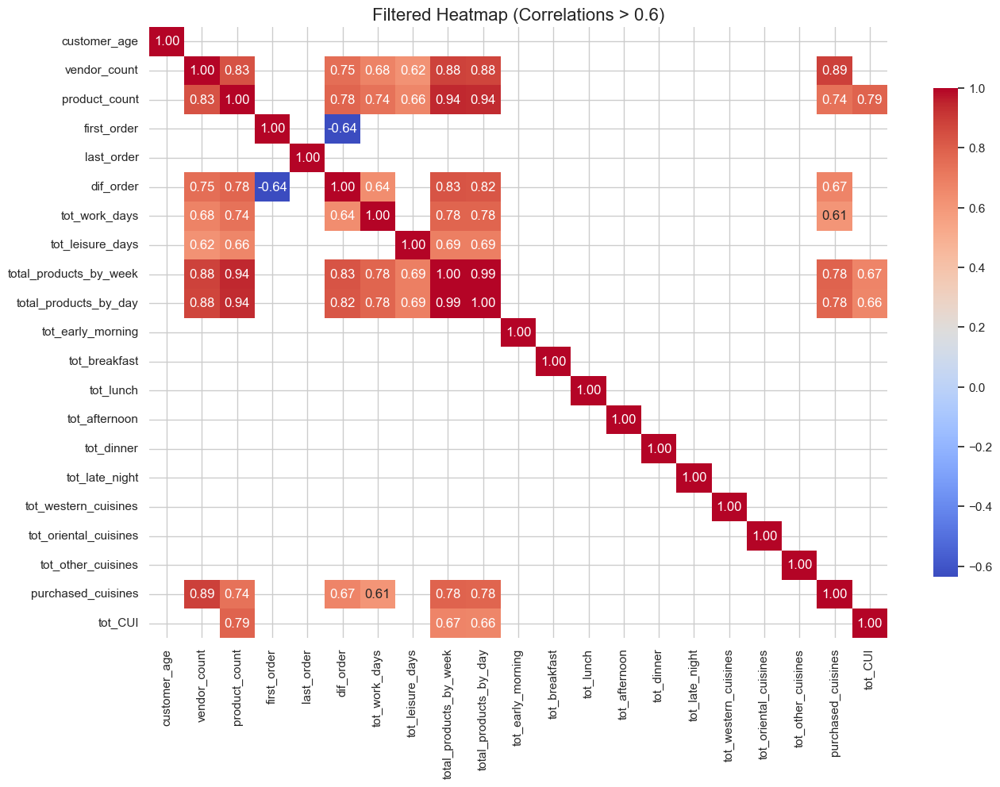

In [252]:
correlation_matrix = df[new_metric_features].corr("spearman")
# Apply a filter: set values < 0.6 to NaN
filtered_correlation_matrix = correlation_matrix.where(abs(correlation_matrix) > 0.6)

# Set up the figure size for the heatmap
plt.figure(figsize=(15, 10))  # Adjust the figure size as needed

# Create the heatmap to visualize the filtered correlations
heatmap = sns.heatmap(filtered_correlation_matrix,
                      annot=True,          # Display correlation values
                      fmt=".2f",           # Format numbers to 2 decimal places
                      cmap='coolwarm',     # Use the 'coolwarm' color map
                      cbar_kws={"shrink": .8})  # Adjust the color bar size

# Set the title for the heatmap
plt.title('Filtered Heatmap (Correlations > 0.6)', fontsize=16)
plt.show()

In [253]:
# new_metric_features.append("vendor_count")
# new_metric_features.append("product_count")
# new_metric_features.append("total_products_by_day")
# new_metric_features.append("total_products_by_week")


In [254]:
new_metric_features.remove("vendor_count")
new_metric_features.remove("product_count")
new_metric_features.remove("total_products_by_day")
new_metric_features.remove("total_products_by_week")

new_metric_features

['customer_age',
 'first_order',
 'last_order',
 'dif_order',
 'tot_work_days',
 'tot_leisure_days',
 'tot_early_morning',
 'tot_breakfast',
 'tot_lunch',
 'tot_afternoon',
 'tot_dinner',
 'tot_late_night',
 'tot_western_cuisines',
 'tot_oriental_cuisines',
 'tot_other_cuisines',
 'purchased_cuisines',
 'tot_CUI']

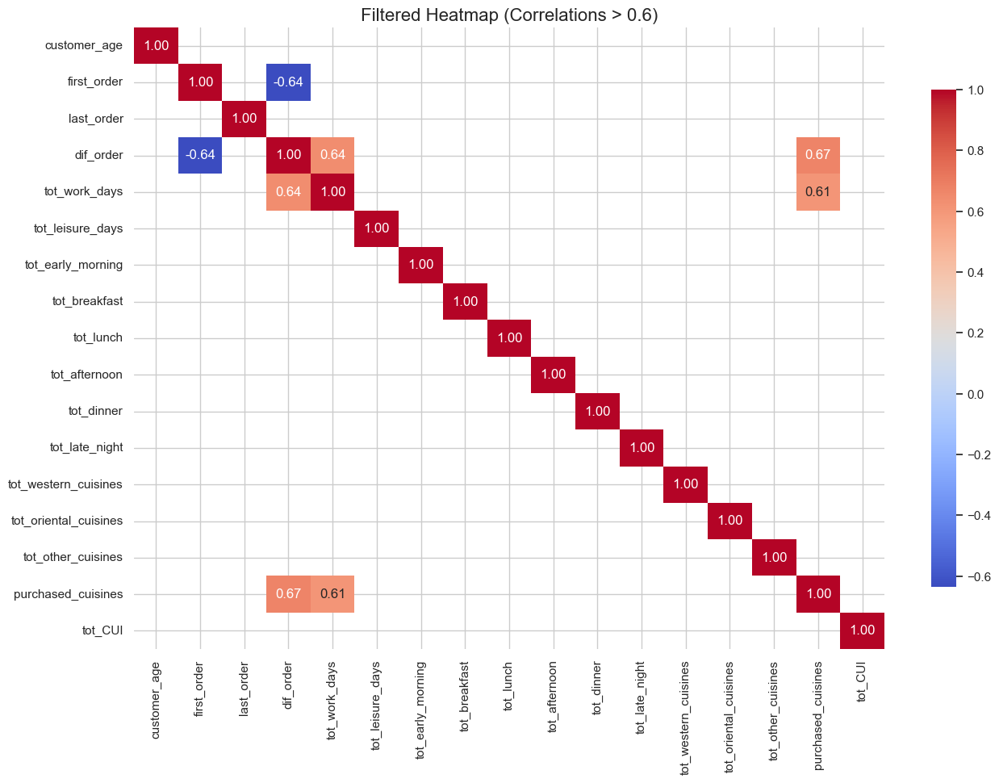

In [263]:
correlation_matrix = df[new_metric_features].corr("spearman")
# Apply a filter: set values < 0.6 to NaN
filtered_correlation_matrix = correlation_matrix.where(abs(correlation_matrix) > 0.6)

# Set up the figure size for the heatmap
plt.figure(figsize=(15, 10))  # Adjust the figure size as needed

# Create the heatmap to visualize the filtered correlations
heatmap = sns.heatmap(filtered_correlation_matrix,
                      annot=True,          # Display correlation values
                      fmt=".2f",           # Format numbers to 2 decimal places
                      cmap='coolwarm',     # Use the 'coolwarm' color map
                      cbar_kws={"shrink": .8})  # Adjust the color bar size

# Set the title for the heatmap
plt.title('Filtered Heatmap (Correlations > 0.6)', fontsize=16)
plt.show()

<a class="anchor" id="section_7_6_2">

### 7.6.2 Categorical Variables

</a>

In [255]:
from scipy.stats import chi2_contingency

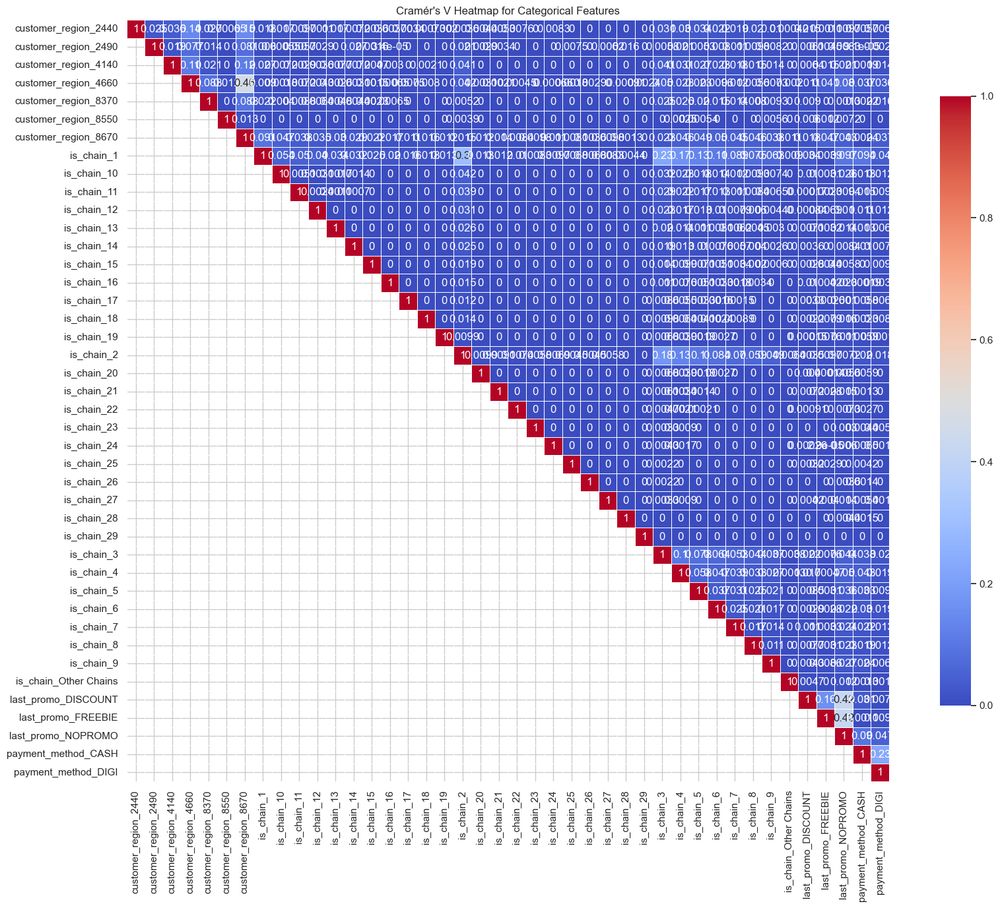

In [256]:
non_metric_features= ohc_feat_names
# Compute Cramér's V
def cramers_v(x, y):
    contingency_table = pd.crosstab(x, y)
    chi2 = chi2_contingency(contingency_table)[0]
    n = contingency_table.sum().sum()
    r, k = contingency_table.shape
    return np.sqrt(chi2 / (n * (min(r, k) - 1)))

# Cramér's V matrix
cramers_v_matrix = pd.DataFrame(index=non_metric_features, columns=non_metric_features)

# Calculate Cramér's V for each pair up to the diagonal
for i in range(len(non_metric_features)):
    for j in range(i, len(non_metric_features)):
        if i == j:
            cramers_v_matrix.iloc[i, j] = 1.0
        else:
            cramers_v_matrix.iloc[i, j] = cramers_v(df[non_metric_features[i]], df[non_metric_features[j]])

# Convert matrix to numeric to avoid plotting issues
cramers_v_matrix = cramers_v_matrix.astype(float)

# Plot the heatmap
plt.figure(figsize=(20, 15))
sns.heatmap(cramers_v_matrix, annot=True, cmap="coolwarm", square=True, linewidths=.5, cbar_kws={'shrink': .8})
plt.title("Cramér's V Heatmap for Categorical Features")
plt.show()

<a class="anchor" id="section_7_7">

## 7.7 PCA
[Back to 7. Preprocessing](#section_7)<br>
</a>

In [257]:
from sklearn.decomposition import PCA

In [258]:
df_pca = df.copy()
# Use PCA to reduce dimensionality of data
pca = PCA()
pca_feat = pca.fit_transform(df_pca[metric_features]) # CODE HERE
pca_feat  # What is this output?
pca_feat=pd.DataFrame(pca_feat)
pca_feat

,0,1,2,3,4,5,6,7,8,9,10,11,12,13,14,15,16,17,18,19,20
0,-1.758546,-0.313857,-2.776721,0.500848,0.056968,-1.276915,-0.946402,-1.352814,-0.457030,0.296953,0.601170,0.418475,-0.490238,-0.424779,0.232516,0.286234,0.038067,-7.958929e-15,-2.191667e-16,2.710155e-15,-1.284101e-15
1,-1.834939,-0.119376,-2.645835,1.037219,-0.558730,-1.325998,-0.792408,-0.203989,0.568474,0.101778,0.145335,0.677874,0.555144,0.007506,-0.122026,-0.099582,-0.002990,3.128058e-15,3.517798e-16,-1.128048e-15,3.345180e-16
2,-2.306088,-0.190814,-2.443441,1.192582,0.143879,1.531996,-1.152154,-0.079244,0.553180,0.124664,0.077514,0.522816,-0.069879,0.534473,-0.033171,-0.005546,0.000029,1.592458e-15,-5.244780e-16,3.908300e-16,1.106164e-16
3,-1.599142,0.032785,-2.655357,0.612240,-0.202706,-0.067490,-0.821469,-1.012614,0.534827,0.281177,-0.782701,-0.016097,0.402267,-0.546891,-0.181192,-0.069220,0.007187,1.464458e-15,4.646845e-17,-4.046678e-16,-4.808020e-16
4,-1.149066,1.107620,-2.644922,1.159099,-0.289852,-0.951231,-0.858686,-0.478711,0.208581,1.037151,0.494636,0.109758,0.360082,-0.785857,-0.268375,0.169034,0.030629,-3.195009e-15,4.646845e-17,6.283600e-16,1.783929e-16
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
31108,-2.932814,-0.139534,-1.920731,0.595066,-0.844902,0.525361,-2.009006,-0.069445,-0.384136,-0.267471,-0.495409,0.295274,0.057080,-0.181430,0.021237,-0.149999,-0.009617,3.129402e-15,1.294011e-16,7.572848e-17,-4.385418e-16
31109,-3.032751,-0.017180,-1.752003,1.577113,0.165482,-0.293407,-1.466755,-0.281574,-0.365453,-0.114176,0.003186,0.296868,0.537412,0.074735,0.051926,-0.090817,-0.004099,2.383492e-15,8.614466e-17,3.491967e-16,-7.636842e-16
31110,-2.980509,0.431152,-2.104761,0.355741,-0.893846,-0.305125,-1.710155,-0.068978,-0.978419,-0.541307,-0.182378,0.302979,0.223431,0.231808,-0.040640,-0.092846,-0.000483,2.140883e-15,-2.398446e-16,6.406974e-16,-9.215266e-17
31111,-3.095249,0.029909,-1.923872,0.782902,0.095426,0.917971,-1.628380,-0.803184,0.168515,0.123391,-0.373709,0.243092,0.330306,0.043025,-0.001104,-0.075908,-0.001104,2.019200e-15,2.877938e-18,6.692531e-16,-7.012342e-16


In [259]:
# Get PCA output as table

# Get the eigenvalues (explained variance)
explained_variance = pca.explained_variance_

# Get the explained variance ratio
explained_variance_ratio = pca.explained_variance_ratio_

# get the cumulative explained variance ratio 
# Hint: use np.cumsum()
cumulative_explained_variance_ratio = np.cumsum(explained_variance_ratio) 

# Combine into a dataframe
pca_results = pd.DataFrame(
    {
        "Eigenvalue": explained_variance,
        "Difference": np.insert(np.diff(explained_variance), 0, 0),
        "Proportion": explained_variance_ratio,
        "Cumulative": cumulative_explained_variance_ratio
    },
        index=range(1, pca.n_components_ + 1)
)

pca_results

,Eigenvalue,Difference,Proportion,Cumulative
1,9.174118e+00,0.000000e+00,4.368487e-01,0.436849
2,1.781951e+00,-7.392167e+00,8.485209e-02,0.521701
3,1.246373e+00,-5.355776e-01,5.934921e-02,0.581050
4,1.181898e+00,-6.447516e-02,5.627906e-02,0.637329
5,1.020886e+00,-1.610124e-01,4.861205e-02,0.685941
6,9.984080e-01,-2.247790e-02,4.754171e-02,0.733483
7,9.588524e-01,-3.955560e-02,4.565817e-02,0.779141
8,8.405218e-01,-1.183306e-01,4.002356e-02,0.819165
9,7.882196e-01,-5.230225e-02,3.753306e-02,0.856698
10,7.134391e-01,-7.478049e-02,3.397220e-02,0.890670


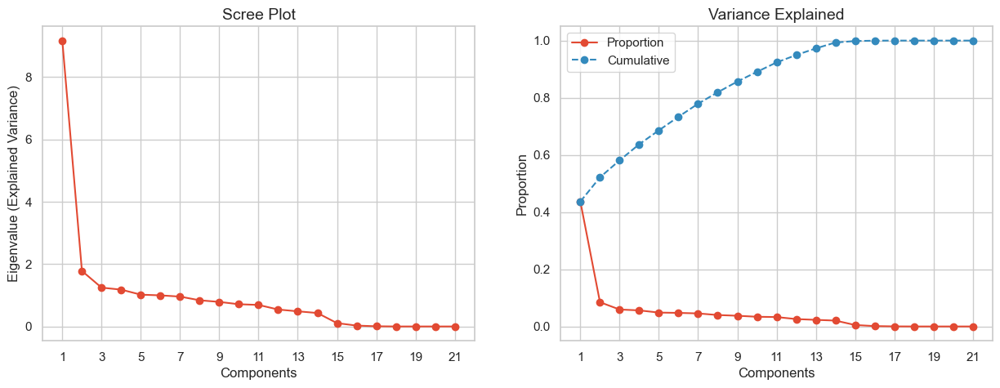

In [260]:
# figure and axes
fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(15, 5))

# draw plots

ax1.plot(explained_variance, # PLOT THE EIGENVALUES (EXPLAINED VARIANCE)
         marker=".", markersize=12)

ax2.plot(explained_variance_ratio, # PLOT THE EXPLAINED VARIANCE RATIO
         marker=".", markersize=12, label="Proportion")

ax2.plot(cumulative_explained_variance_ratio, # PLOT THE CUMULATIVE EXPLAINED VARIANCE RATIO
         marker=".", markersize=12, linestyle="--", label="Cumulative")

# customizations
ax2.legend()
ax1.set_title("Scree Plot", fontsize=14)
ax2.set_title("Variance Explained", fontsize=14)
ax1.set_ylabel("Eigenvalue (Explained Variance)")
ax2.set_ylabel("Proportion")
ax1.set_xlabel("Components")
ax2.set_xlabel("Components")
ax1.set_xticks(range(0, pca.n_components_, 2))
ax1.set_xticklabels(range(1, pca.n_components_ + 1, 2))
ax2.set_xticks(range(0, pca.n_components_, 2))
ax2.set_xticklabels(range(1, pca.n_components_ + 1, 2))

plt.show()

<div class="alert alert-block alert-success">
<a class="anchor" id="section_8">

# 8. Load the Preprocessed Datasets
[Back to ToC](#toc)<br>    
</a>
<div>

In this section, we save the preprocessing dataset, and ready for further cluster steps. To maintain an organized workflow, we create a dedicated folder to store intermediate datasets. These datasets will serve as inputs for the next notebook (cluster).

In [262]:
df.to_csv("Preprocessed_Data.csv", index=True)

""" # Splitting feature names into groups
metric_features = ['customer_age',
 'vendor_count',
 'product_count',
 'first_order',
 'last_order',
 'dif_order',
 'tot_CUI',
 'tot_work_days',
 'tot_leisure_days',
 'total_products_by_week',
 'tot_early_morning',
 'tot_breakfast',
 'tot_lunch',
 'tot_afternoon',
 'tot_dinner',
 'tot_late_night',
 'tot_western_cuisines',
 'tot_oriental_cuisines',
 'tot_other_cuisines',
 'daily_consumption']

CUI_metric_features = df.columns[df.columns.str.startswith('CUI_')].tolist()
DOW_metric_features = df.columns[df.columns.str.startswith('DOW_')].tolist()
HR_metric_features = df.columns[df.columns.str.startswith('HR_')].tolist()

#unused_features = [i for i in df.columns if i not in (metric_features+non_metric_features+pc_features) ] """